In [ ]:
from tensorflow.keras import backend as K
K.clear_session()


# ***`Data Preprocessing`***

In [ ]:
# Install the 'rarfile' library to handle RAR file extraction in the environment.
!pip install rarfile

In [ ]:
# Import necessary libraries for handling files, downloading, and data manipulation
import os
import pandas as pd
import gdown
import rarfile
import shutil

# Download the RAR file from Google Drive
url = 'https://drive.google.com/uc?id=1upl-lvDOFmVZNMFewW-oMcOtYp7KVjWc'
# https://drive.google.com/file/d/1upl-lvDOFmVZNMFewW-oMcOtYp7KVjWc/view?usp=sharing
output_rar = '/content/fitnesstan-Dataset.rar'
gdown.download(url, output_rar, quiet=False)

# Extract the RAR file to access the dataset
with rarfile.RarFile(output_rar, 'r') as rar_ref:
    rar_ref.extractall('/content')

Downloading...
From: https://drive.google.com/uc?id=1upl-lvDOFmVZNMFewW-oMcOtYp7KVjWc
To: /content/fitnesstan-Dataset.rar
100%|██████████| 1.01M/1.01M [00:00<00:00, 12.2MB/s]


### ***Cleaning***

In [ ]:
import pandas as pd

# Load the dataset to examine its structure
file_path = '/content/nutrition.csv'
nutrition_data = pd.read_csv(file_path)

# Display the first few rows of the dataset
nutrition_data.head(), nutrition_data.info(), nutrition_data.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8789 entries, 0 to 8788
Data columns (total 79 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Unnamed: 0                   8789 non-null   int64 
 1   name                         8789 non-null   object
 2   serving_size                 8789 non-null   object
 3   calories                     8789 non-null   int64 
 4   total_fat                    8789 non-null   object
 5   saturated_fat                7199 non-null   object
 6   cholesterol                  8789 non-null   object
 7   sodium                       8789 non-null   object
 8   choline                      8789 non-null   object
 9   folate                       8789 non-null   object
 10  folic_acid                   8789 non-null   object
 11  niacin                       8789 non-null   object
 12  pantothenic_acid             8789 non-null   object
 13  riboflavin                   8789

(   Unnamed: 0             name serving_size  calories total_fat saturated_fat  \
 0           0       cornstarch        100 g       381      0.1g           NaN   
 1           1     nuts, pecans        100 g       691       72g          6.2g   
 2           2    eggplant, raw        100 g        25      0.2g           NaN   
 3           3   teff, uncooked        100 g       367      2.4g          0.4g   
 4           4  sherbet, orange        100 g       144        2g          1.2g   
 
   cholesterol    sodium  choline     folate  ... monounsaturated_fatty_acids  \
 0           0   9.00 mg   0.4 mg   0.00 mcg  ...                     0.016 g   
 1           0   0.00 mg  40.5 mg  22.00 mcg  ...                    40.801 g   
 2           0   2.00 mg   6.9 mg  22.00 mcg  ...                     0.016 g   
 3           0  12.00 mg  13.1 mg          0  ...                     0.589 g   
 4         1mg  46.00 mg   7.7 mg   4.00 mcg  ...                     0.530 g   
 
   polyunsaturated

In [ ]:
# Correct Typographical Errors in Column Names
nutrition_data.rename(
    columns={
        'irom': 'iron',
        'lucopene': 'lycopene',
        'phosphorous': 'phosphorus',
        'zink': 'zinc'
    },
    inplace=True
)

# Verify the updated column names
print("Updated column names:")
print(nutrition_data.columns.tolist())


Updated column names:
['Unnamed: 0', 'name', 'serving_size', 'calories', 'total_fat', 'saturated_fat', 'cholesterol', 'sodium', 'choline', 'folate', 'folic_acid', 'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a', 'vitamin_a_rae', 'carotene_alpha', 'carotene_beta', 'cryptoxanthin_beta', 'lutein_zeaxanthin', 'lycopene', 'vitamin_b12', 'vitamin_b6', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k', 'calcium', 'copper', 'iron', 'magnesium', 'manganese', 'phosphorus', 'potassium', 'selenium', 'zinc', 'protein', 'alanine', 'arginine', 'aspartic_acid', 'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline', 'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine', 'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine', 'carbohydrate', 'fiber', 'sugars', 'fructose', 'galactose', 'glucose', 'lactose', 'maltose', 'sucrose', 'fat', 'saturated_fatty_acids', 'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids', 'fat

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
# Drop the 'Unnamed: 0' column (irrelevant index column)
nutrition_data = nutrition_data.drop(columns=['Unnamed: 0'])

# Identify missing values
missing_values = nutrition_data.isnull().sum()

# Drop columns with more than 50% missing values
nutrition_data = nutrition_data.loc[:, missing_values <= (0.5 * len(nutrition_data))]

# Fill missing values in numerical columns with mean
for column in nutrition_data.select_dtypes(include=['float64', 'int64']).columns:
    nutrition_data[column] = nutrition_data[column].fillna(nutrition_data[column].mean())

# For categorical columns, fill missing with mode
for column in nutrition_data.select_dtypes(include=['object']).columns:
    nutrition_data[column] = nutrition_data[column].fillna(nutrition_data[column].mode()[0])


In [ ]:
nutrition_data = nutrition_data.drop_duplicates()

In [ ]:
nutrition_data.columns = nutrition_data.columns.str.lower().str.replace(' ', '_').str.replace('[^a-z0-9_]', '')

In [ ]:
# Correct Typographical Errors in Column Names
nutrition_data.rename(
    columns={
        'irom': 'iron',
        'lucopene': 'lycopene',
        'phosphorous': 'phosphorus',
        'zink': 'zinc'
    },
    inplace=True
)

# Verify the updated column names
print("Updated column names:")
print(nutrition_data.columns.tolist())

# Essential features based on your selection
essential_features = [
    'calories', 'total_fat',  'cholesterol', 'protein',
    'carbohydrate', 'fiber', 'sugars', 'vitamin_a', 'vitamin_b6', 'vitamin_b12',
    'vitamin_c', 'vitamin_d', 'vitamin_e', 'vitamin_k', 'calcium', 'iron',
    'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
    'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
    'fatty_acids_total_trans', 'vegetarian', 'halal'
]

# Filter the dataset to include only essential features
essential_data = nutrition_data[[col for col in essential_features if col in nutrition_data.columns]]

# Save the filtered dataset
filtered_file_path = '/content/essential_features_nutrition_data.csv'
essential_data.to_csv(filtered_file_path, index=False)

# Display the saved file path and the first few rows of the dataset for confirmation
print(f"Filtered dataset saved at: {filtered_file_path}")
essential_data.head()


Updated column names:
['name', 'serving_size', 'calories', 'total_fat', 'saturated_fat', 'cholesterol', 'sodium', 'choline', 'folate', 'folic_acid', 'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a', 'vitamin_a_rae', 'carotene_alpha', 'carotene_beta', 'cryptoxanthin_beta', 'lutein_zeaxanthin', 'lycopene', 'vitamin_b12', 'vitamin_b6', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k', 'calcium', 'copper', 'iron', 'magnesium', 'manganese', 'phosphorus', 'potassium', 'selenium', 'zinc', 'protein', 'alanine', 'arginine', 'aspartic_acid', 'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline', 'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine', 'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine', 'carbohydrate', 'fiber', 'sugars', 'fructose', 'galactose', 'glucose', 'lactose', 'maltose', 'sucrose', 'fat', 'saturated_fatty_acids', 'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids', 'fatty_acids_total

,calories,total_fat,cholesterol,protein,carbohydrate,fiber,sugars,vitamin_a,vitamin_b6,vitamin_b12,...,iron,magnesium,potassium,zinc,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids,fatty_acids_total_trans,vegetarian,halal
0,381,0.1g,0,0.26 g,91.27 g,0.9 g,0.00 g,0.00 IU,0.000 mg,0.00 mcg,...,0.47 mg,3.00 mg,3.00 mg,0.06 mg,0.009 g,0.016 g,0.025 g,0.00 mg,True,True
1,691,72g,0,9.17 g,13.86 g,9.6 g,3.97 g,56.00 IU,0.210 mg,0.00 mcg,...,2.53 mg,121.00 mg,410.00 mg,4.53 mg,6.180 g,40.801 g,21.614 g,0.00 mg,True,True
2,25,0.2g,0,0.98 g,5.88 g,3.0 g,3.53 g,23.00 IU,0.084 mg,0.00 mcg,...,0.23 mg,14.00 mg,229.00 mg,0.16 mg,0.034 g,0.016 g,0.076 g,0.00 mg,True,True
3,367,2.4g,0,13.30 g,73.13 g,8.0 g,1.84 g,9.00 IU,0.482 mg,0,...,7.63 mg,184.00 mg,427.00 mg,3.63 mg,0.449 g,0.589 g,1.071 g,0,True,True
4,144,2g,1mg,1.10 g,30.40 g,1.3 g,24.32 g,46.00 IU,0.023 mg,0.13 mcg,...,0.14 mg,8.00 mg,96.00 mg,0.48 mg,1.160 g,0.530 g,0.080 g,1.00 mg,True,True


In [ ]:
import pandas as pd

df = pd.read_csv('/content/essential_features_nutrition_data.csv')
missing_values = df.isnull().sum()
print(missing_values)


calories                       0
total_fat                      0
cholesterol                    0
protein                        0
carbohydrate                   0
fiber                          0
sugars                         0
vitamin_a                      0
vitamin_b6                     0
vitamin_b12                    0
vitamin_c                      0
vitamin_d                      0
vitamin_e                      0
vitamin_k                      0
calcium                        0
iron                           0
magnesium                      0
potassium                      0
zinc                           0
saturated_fatty_acids          0
monounsaturated_fatty_acids    0
polyunsaturated_fatty_acids    0
fatty_acids_total_trans        0
vegetarian                     0
halal                          0
dtype: int64


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder


# Step 1: Inspect unique values in the columns
print("Unique values in 'vegetarian':", df['vegetarian'].unique())
print("Unique values in 'halal':", df['halal'].unique())

# Step 2: Clean the data (ensure consistent format)
df['vegetarian'] = df['vegetarian'].astype(str).str.strip().str.upper()  # Convert to string, clean whitespace, and convert to uppercase
df['halal'] = df['halal'].astype(str).str.strip().str.upper()

# Step 3: Apply LabelEncoder
label_encoder = LabelEncoder()

# Encode 'vegetarian'
df['vegetarian'] = label_encoder.fit_transform(df['vegetarian'])
vegetarian_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print(f"'vegetarian' Label Mapping: {vegetarian_mapping}")

# Encode 'halal'
df['halal'] = label_encoder.fit_transform(df['halal'])
halal_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print(f"'halal' Label Mapping: {halal_mapping}")

# Display the first few rows to verify
df.head()


Unique values in 'vegetarian': [ True False]
Unique values in 'halal': [ True False]
'vegetarian' Label Mapping: {'FALSE': 0, 'TRUE': 1}
'halal' Label Mapping: {'FALSE': 0, 'TRUE': 1}


,calories,total_fat,cholesterol,protein,carbohydrate,fiber,sugars,vitamin_a,vitamin_b6,vitamin_b12,...,iron,magnesium,potassium,zinc,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids,fatty_acids_total_trans,vegetarian,halal
0,381,0.1g,0,0.26 g,91.27 g,0.9 g,0.00 g,0.00 IU,0.000 mg,0.00 mcg,...,0.47 mg,3.00 mg,3.00 mg,0.06 mg,0.009 g,0.016 g,0.025 g,0.00 mg,1,1
1,691,72g,0,9.17 g,13.86 g,9.6 g,3.97 g,56.00 IU,0.210 mg,0.00 mcg,...,2.53 mg,121.00 mg,410.00 mg,4.53 mg,6.180 g,40.801 g,21.614 g,0.00 mg,1,1
2,25,0.2g,0,0.98 g,5.88 g,3.0 g,3.53 g,23.00 IU,0.084 mg,0.00 mcg,...,0.23 mg,14.00 mg,229.00 mg,0.16 mg,0.034 g,0.016 g,0.076 g,0.00 mg,1,1
3,367,2.4g,0,13.30 g,73.13 g,8.0 g,1.84 g,9.00 IU,0.482 mg,0,...,7.63 mg,184.00 mg,427.00 mg,3.63 mg,0.449 g,0.589 g,1.071 g,0,1,1
4,144,2g,1mg,1.10 g,30.40 g,1.3 g,24.32 g,46.00 IU,0.023 mg,0.13 mcg,...,0.14 mg,8.00 mg,96.00 mg,0.48 mg,1.160 g,0.530 g,0.080 g,1.00 mg,1,1


In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

features_to_scale = ['calories', 'total_fat',  'cholesterol', 'protein',
                     'carbohydrate', 'fiber', 'sugars', 'vitamin_a', 'vitamin_b6',
                     'vitamin_b12', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'vitamin_k',
                     'calcium', 'iron', 'magnesium', 'potassium', 'zinc',
                     'saturated_fatty_acids', 'monounsaturated_fatty_acids',
                     'polyunsaturated_fatty_acids', 'fatty_acids_total_trans']

# Step 1: Clean non-numeric characters and convert to float, handling errors by imputing with median
for column in features_to_scale:
    if column in df.columns:
        # Replace non-numeric characters and convert to float, imputing with median for invalid entries
        df[column] = pd.to_numeric(df[column].replace(r'[^\d.]', '', regex=True), errors='coerce')
        df[column] = df[column].fillna(df[column].median())  # Impute with median after conversion

# Initialize and apply StandardScaler to the selected features
scaler = StandardScaler()
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

In [ ]:
# Convert scaled data back to a DataFrame
X = pd.DataFrame(df[features_to_scale], columns=features_to_scale)

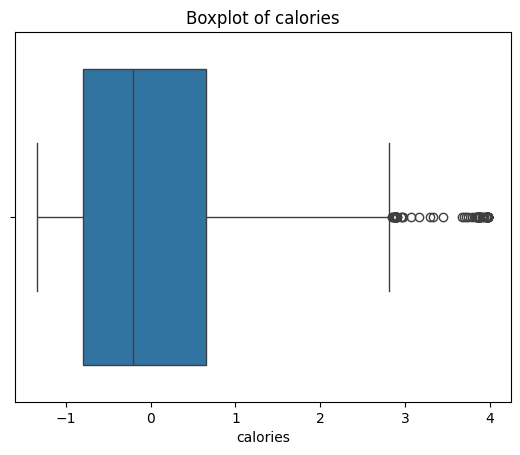

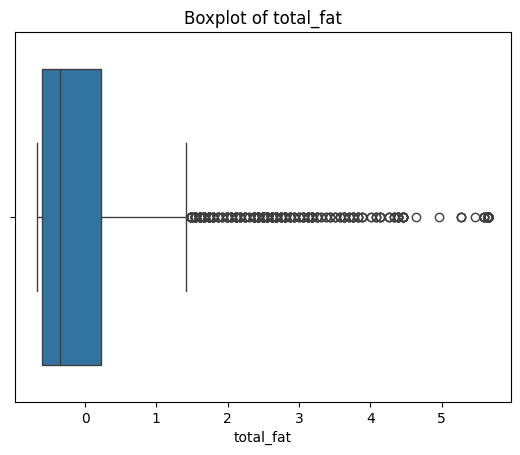

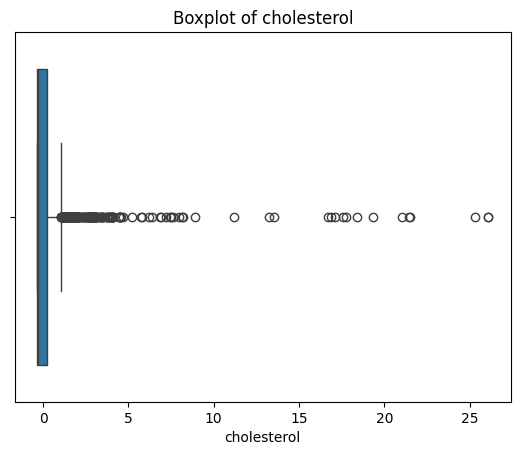

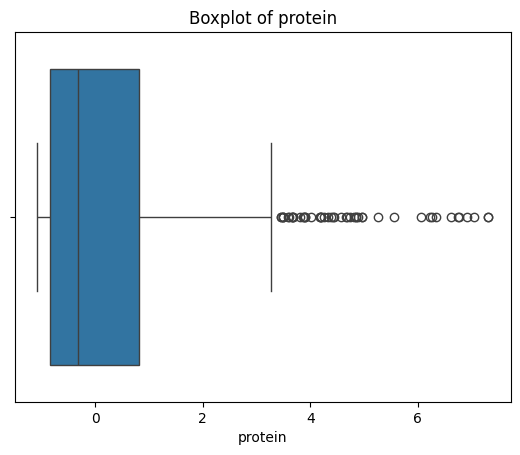

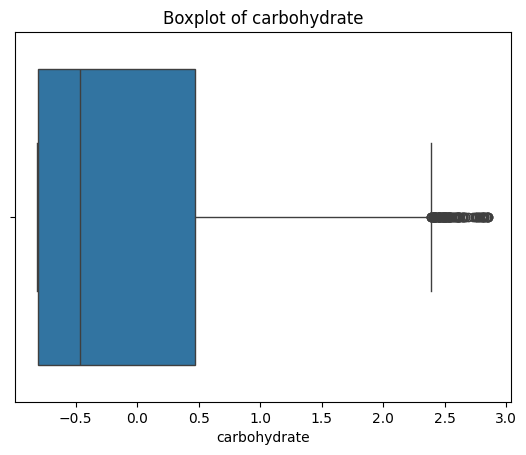

...

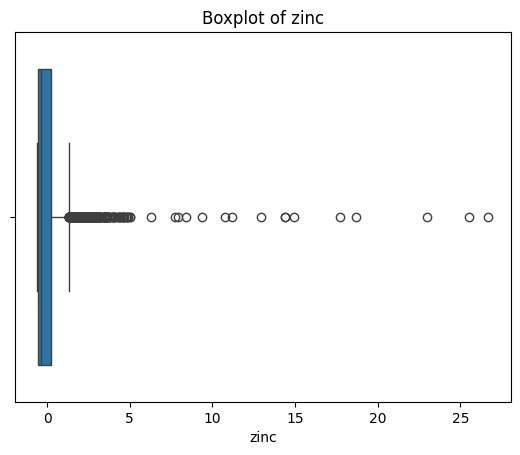

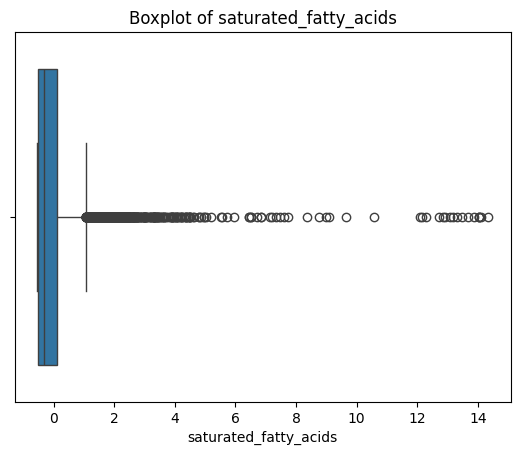

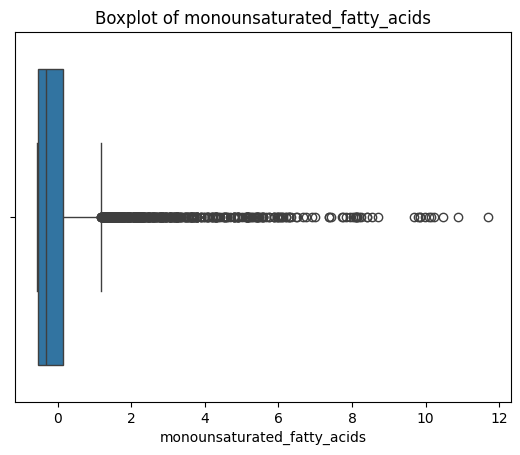

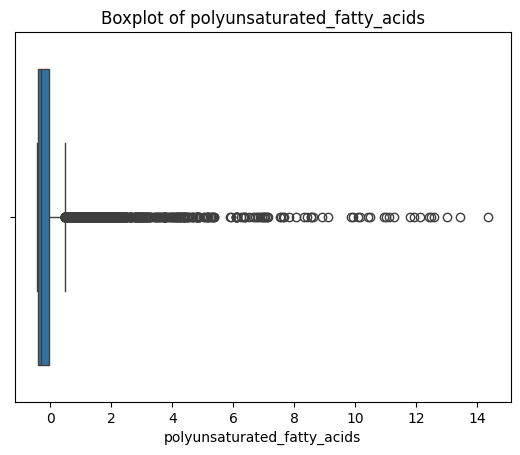

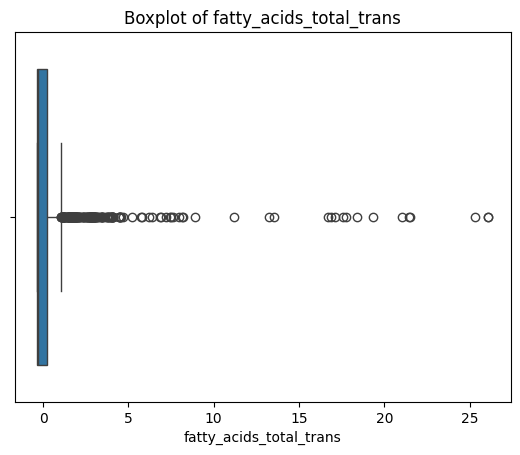

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for feature in features_to_scale:
    sns.boxplot(x=df[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()


In [ ]:
# If not using PCA
final_features = df[features_to_scale + ['vegetarian', 'halal']]

In [ ]:
assert final_features.isnull().sum().sum() == 0, "There are missing values in the final dataset."

In [ ]:
# Save the cleaned dataset
cleaned_file_path = '/content/cleaned_and_preprocessed_final_features.csv'
final_features.to_csv(cleaned_file_path, index=False)

print(f"Cleaned and preprocessed dataset saved at: {cleaned_file_path}")

Cleaned and preprocessed dataset saved at: /content/cleaned_and_preprocessed_final_features.csv


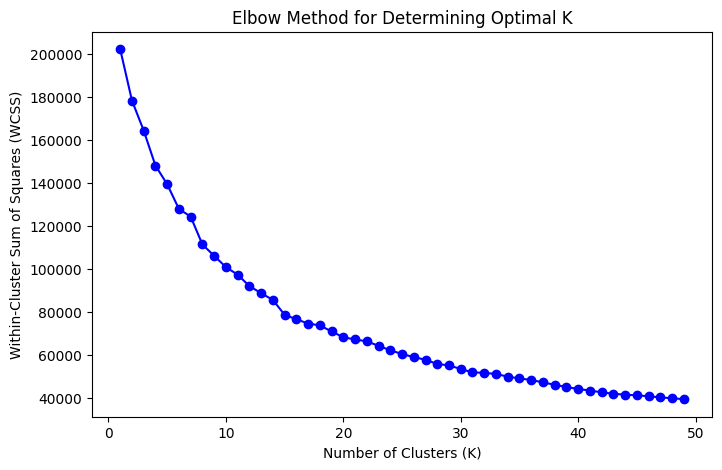

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

wcss = []
K_range = range(1, 50)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)  # Inertia: Sum of squared distances to nearest cluster centroid

# Plot the Elbow graph
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, 'bo-')
plt.title('Elbow Method for Determining Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.show()


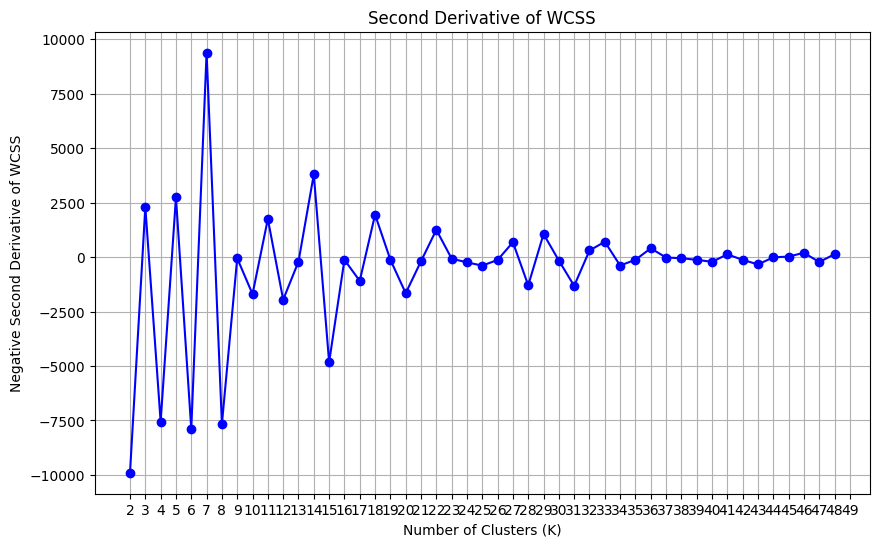

In [ ]:
import numpy as np

wcss_diff = np.diff(wcss)
wcss_diff2 = np.diff(wcss_diff)

plt.figure(figsize=(10, 6))
plt.plot(range(2, len(wcss)), -wcss_diff2, 'bo-')
plt.title('Second Derivative of WCSS')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Negative Second Derivative of WCSS')
plt.xticks(range(2, 50))
plt.grid(True)
plt.show()


For n_clusters = 2, the average silhouette_score is 0.3861
For n_clusters = 3, the average silhouette_score is 0.2224
For n_clusters = 4, the average silhouette_score is 0.2426
For n_clusters = 5, the average silhouette_score is 0.2479
For n_clusters = 6, the average silhouette_score is 0.2754
For n_clusters = 7, the average silhouette_score is 0.2778
For n_clusters = 8, the average silhouette_score is 0.2866
For n_clusters = 9, the average silhouette_score is 0.2913
For n_clusters = 10, the average silhouette_score is 0.2955
For n_clusters = 11, the average silhouette_score is 0.2987
For n_clusters = 12, the average silhouette_score is 0.3014
For n_clusters = 13, the average silhouette_score is 0.3060
For n_clusters = 14, the average silhouette_score is 0.3080
For n_clusters = 15, the average silhouette_score is 0.3085
For n_clusters = 16, the average silhouette_score is 0.3075
For n_clusters = 17, the average silhouette_score is 0.3143
For n_clusters = 18, the average silhouette_scor

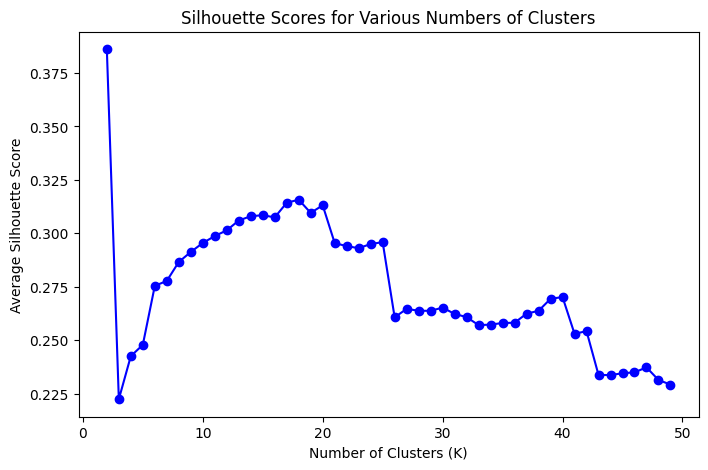

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []

for k in range(2, 50):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print(f'For n_clusters = {k}, the average silhouette_score is {silhouette_avg:.4f}')

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(range(2, 50), silhouette_scores, 'bo-')
plt.title('Silhouette Scores for Various Numbers of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Average Silhouette Score')
plt.show()


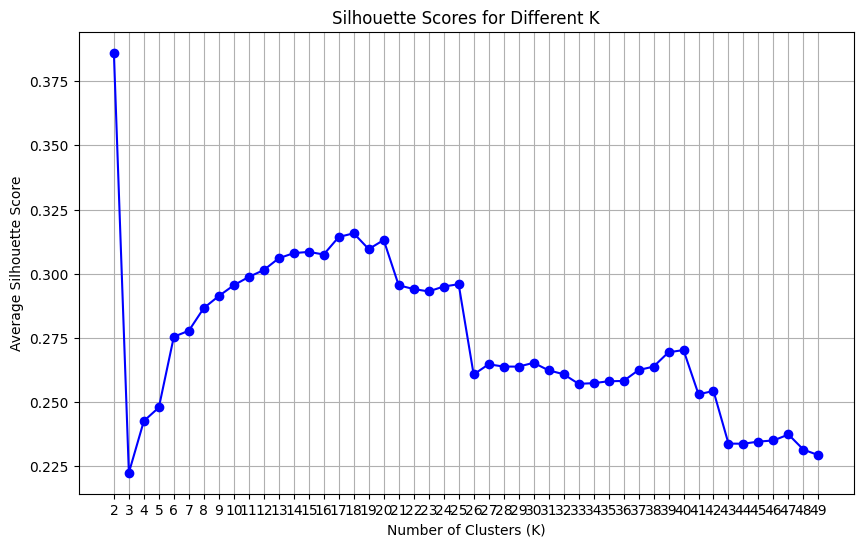

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(range(2, 50), silhouette_scores, 'bo-')
plt.title('Silhouette Scores for Different K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Average Silhouette Score')
plt.xticks(range(2, 50))
plt.grid(True)
plt.show()


Select K = 14

Rationale:

Provides a balance between statistical performance and practical usability.

The silhouette score at K = 14 (0.3080) is close to the maximum at K = 18 (0.3157).

The rate of improvement in silhouette score diminishes beyond K = 14, indicating that adding more clusters yields minimal benefits.

Benefits:

Interpretability: With 14 clusters, you can meaningfully differentiate between various food groups based on nutritional profiles.

Manageability: Allows for effective integration into your recommendation system without overwhelming complexity.

User Experience: Enhances diversity in meal plans while keeping recommendations coherent.


In [ ]:
df[features_to_scale].head()

,calories,total_fat,cholesterol,protein,carbohydrate,fiber,sugars,vitamin_a,vitamin_b6,vitamin_b12,...,vitamin_k,calcium,iron,magnesium,potassium,zinc,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids,fatty_acids_total_trans
0,0.910886,-0.661100,-0.329973,-1.052765,2.536175,-0.267062,-0.492509,-0.183060,-0.558759,-0.281323,...,-0.149638,-0.356874,-0.384361,-0.524084,-0.706073,-0.563544,-0.532995,-0.550307,-0.413749,-0.329973
1,2.736001,3.884542,-0.329973,-0.206611,-0.303026,1.770915,-0.203111,-0.167902,-0.109740,-0.281323,...,-0.093300,-0.016600,-0.020450,1.589300,0.389715,0.776554,0.427289,5.424776,3.861505,-0.329973
2,-1.185052,-0.654778,-0.329973,-0.984389,-0.595712,0.224863,-0.235185,-0.176835,-0.379151,-0.281323,...,-0.093300,-0.321846,-0.426759,-0.327074,-0.097601,-0.533565,-0.529105,-0.550307,-0.403650,-0.329973
3,0.828461,-0.515690,-0.329973,0.185601,1.870846,1.396115,-0.358380,-0.180624,0.471846,-0.281323,...,-0.119054,0.533843,0.880495,2.717632,0.435485,0.506736,-0.464526,-0.466362,-0.206610,-0.329973
4,-0.484444,-0.540979,-0.321452,-0.972993,0.303619,-0.173362,1.280330,-0.170609,-0.509580,-0.250889,...,-0.149638,-0.096664,-0.442658,-0.434534,-0.455684,-0.437629,-0.353886,-0.475005,-0.402857,-0.321452


In [ ]:
# Assuming you have applied K-Means and have your data in 'df'
from sklearn.cluster import KMeans

# The KMeans model you've trained
kmeans = KMeans(n_clusters=14, random_state=42)
kmeans.fit(df[features_to_scale])

# Retrieve cluster centers
cluster_centers = kmeans.cluster_centers_


In [ ]:
# Inverse transform to original scale
cluster_centers_unscaled = scaler.inverse_transform(cluster_centers)

# Create a DataFrame for cluster centers
cluster_centers_df = pd.DataFrame(cluster_centers, columns=features_to_scale)
cluster_centers_df['cluster'] = cluster_centers_df.index

In [ ]:
# Add cluster labels to your DataFrame
df['cluster'] = kmeans.labels_


In [ ]:
df['cluster_label'] = 'Cluster ' + df['cluster'].astype(str)

In [ ]:
# Group data by clusters
cluster_profiles = df.groupby('cluster')[features_to_scale].agg(['mean', 'median', 'std']).reset_index()

# Flatten MultiIndex columns
cluster_profiles.columns = ['_'.join(col).strip('_') if col[1] else col[0] for col in cluster_profiles.columns.values]

# Count the number of items in each cluster
cluster_counts = df['cluster'].value_counts().sort_index().reset_index()
cluster_counts.columns = ['cluster', 'count']

# Merge counts with cluster profiles
cluster_profiles = pd.merge(cluster_profiles, cluster_counts, on='cluster')

# Display the profiles
pd.set_option('display.max_columns', None)  # To display all columns
print(cluster_profiles)


    cluster  calories_mean  calories_median  calories_std  total_fat_mean  \
0         0      -0.871520        -0.943666      0.314858       -0.545978   
1         1      -0.104310        -0.178295      0.457684        0.075995   
2         2       1.210435         1.317121      0.499527        0.356808   
3         3       2.645292         2.370978      0.892612        3.780226   
4         4       0.757145         0.757812      0.546780        0.072808   
5         5      -0.264959        -0.507993      0.910827       -0.108543   
6         6       0.793608         0.834349      0.985510        0.203773   
7         7       0.106511        -0.460894      1.141065        0.506526   
8         8       0.759403         0.675387      0.594841        0.033382   
9         9       0.869006         0.893224      0.212725       -0.387892   
10       10      -0.177559        -0.025221      0.822510       -0.613684   
11       11       0.099257         0.292702      0.556995       -0.282673   

In [ ]:
# Iterate over each cluster to interpret
for index, row in cluster_profiles.iterrows():
    cluster_num = row['cluster']
    print(f"Cluster {cluster_num}")
    print(f"Number of Items: {row['count']}")
    print("Mean Values:")
    for feature in features_to_scale:
        mean_col = f"{feature}_mean"
        print(f"  {feature}: {row[mean_col]}")
    print("\n")


Cluster 0.0
Number of Items: 3081.0
Mean Values:
  calories: -0.8715201756151828
  total_fat: -0.5459777864371865
  cholesterol: -0.29243852683516797
  protein: -0.7810304769120314
  carbohydrate: -0.3625725871762468
  fiber: -0.14084398370847354
  sugars: -0.18207544457484412
  vitamin_a: 0.0017064710624831638
  vitamin_b6: -0.388718452598815
  vitamin_b12: -0.2484139827153252
  vitamin_c: 0.026273175563060594
  vitamin_d: -0.06924160632799185
  vitamin_e: -0.15740661657575045
  vitamin_k: -0.05786233485051518
  calcium: -0.15884364610877943
  iron: -0.32196256060811995
  magnesium: -0.31634855225370845
  potassium: -0.2577003558622656
  zinc: -0.4709251224624878
  saturated_fatty_acids: -0.43947663646737867
  monounsaturated_fatty_acids: -0.48049704748657485
  polyunsaturated_fatty_acids: -0.33667147276582565
  fatty_acids_total_trans: -0.29243852683516797


Cluster 1.0
Number of Items: 2829.0
Mean Values:
  calories: -0.10430969912175742
  total_fat: 0.07599472061247263
  cholestero

In [ ]:
from sklearn.decomposition import PCA
# Assuming X_scaled is your scaled feature data
pca = PCA(n_components=2)  # Reduce to 2 components for 2D visualization
principal_components = pca.fit_transform(X)


In [ ]:
import pandas as pd

pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['cluster'] = df['cluster']
pca_df['cluster_label'] = df['cluster_label']  # If you have assigned labels


In [ ]:
print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.17480157 0.14200749]


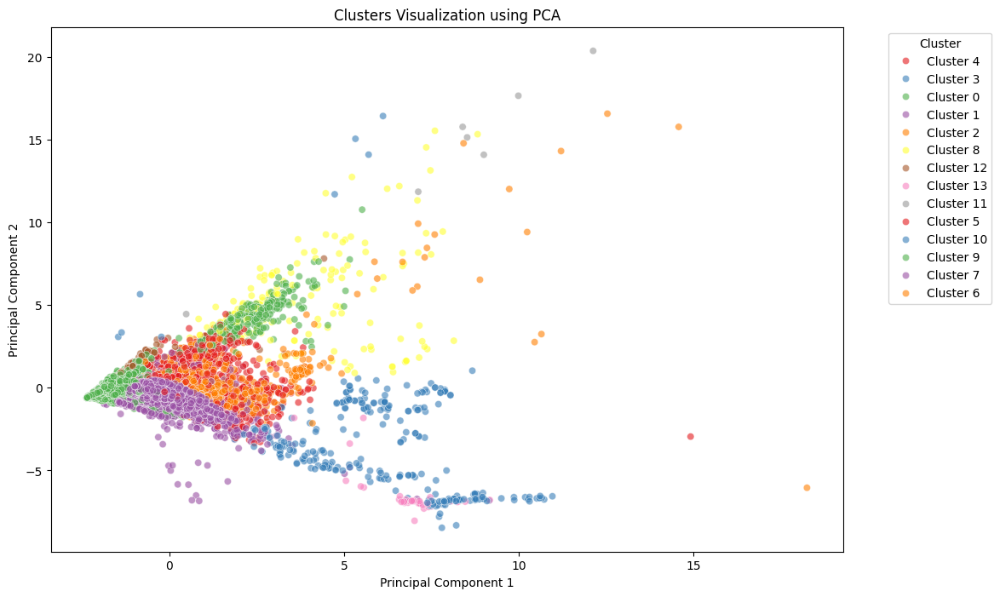

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette='Set1', legend='full', alpha=0.6)
plt.title('Clusters Visualization using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
from sklearn.manifold import TSNE
# For large datasets, you may need to set perplexity and other parameters carefully
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(X)
tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2'])
tsne_df['cluster'] = df['cluster']
tsne_df['cluster_label'] = df['cluster_label']


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


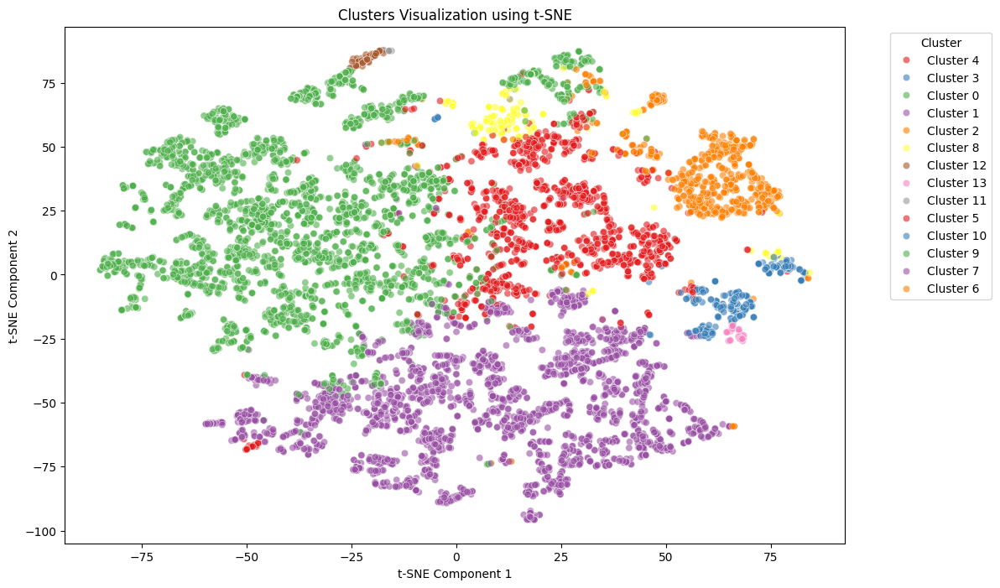

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='cluster_label', palette='Set1', legend='full', alpha=0.6)
plt.title('Clusters Visualization using t-SNE')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


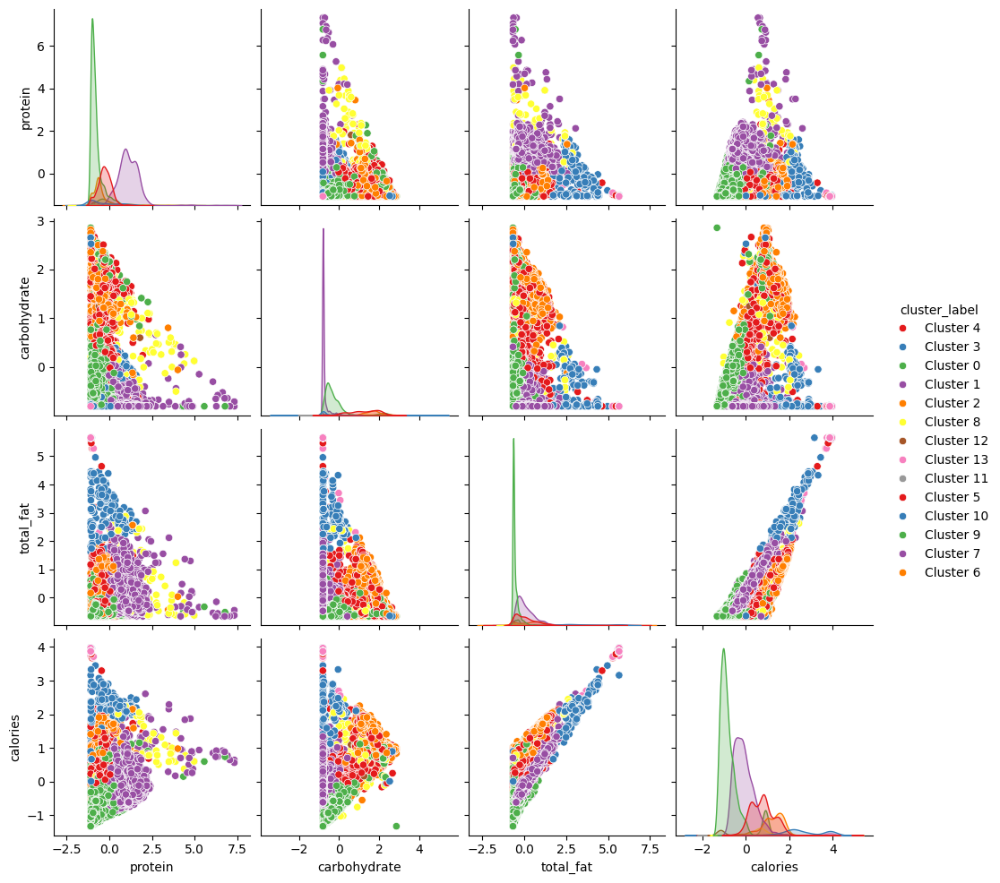

In [ ]:
sns.pairplot(df, vars=['protein', 'carbohydrate', 'total_fat', 'calories'], hue='cluster_label', palette='Set1')
plt.show()


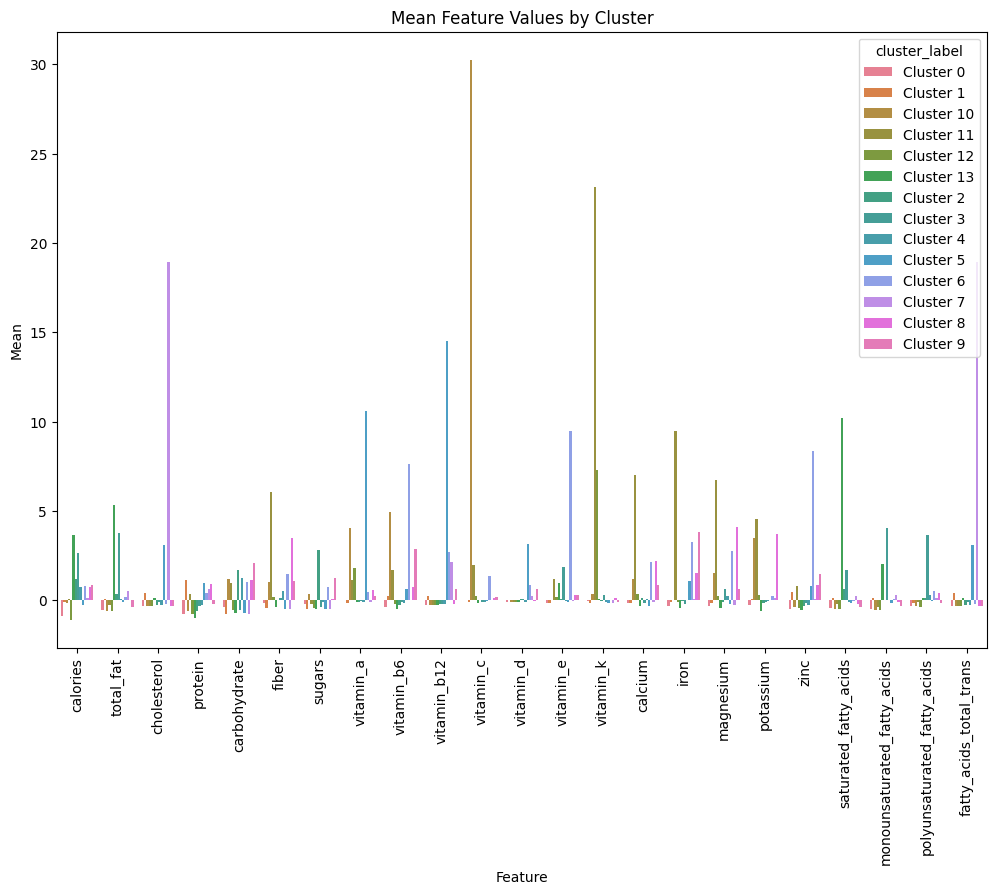

In [ ]:
cluster_means = df.groupby('cluster_label')[features_to_scale].mean().reset_index()

# Melt the DataFrame for easier plotting
melted = cluster_means.melt(id_vars='cluster_label', var_name='Feature', value_name='Mean')

plt.figure(figsize=(12, 8))
sns.barplot(data=melted, x='Feature', y='Mean', hue='cluster_label')
plt.xticks(rotation=90)
plt.title('Mean Feature Values by Cluster')
plt.show()


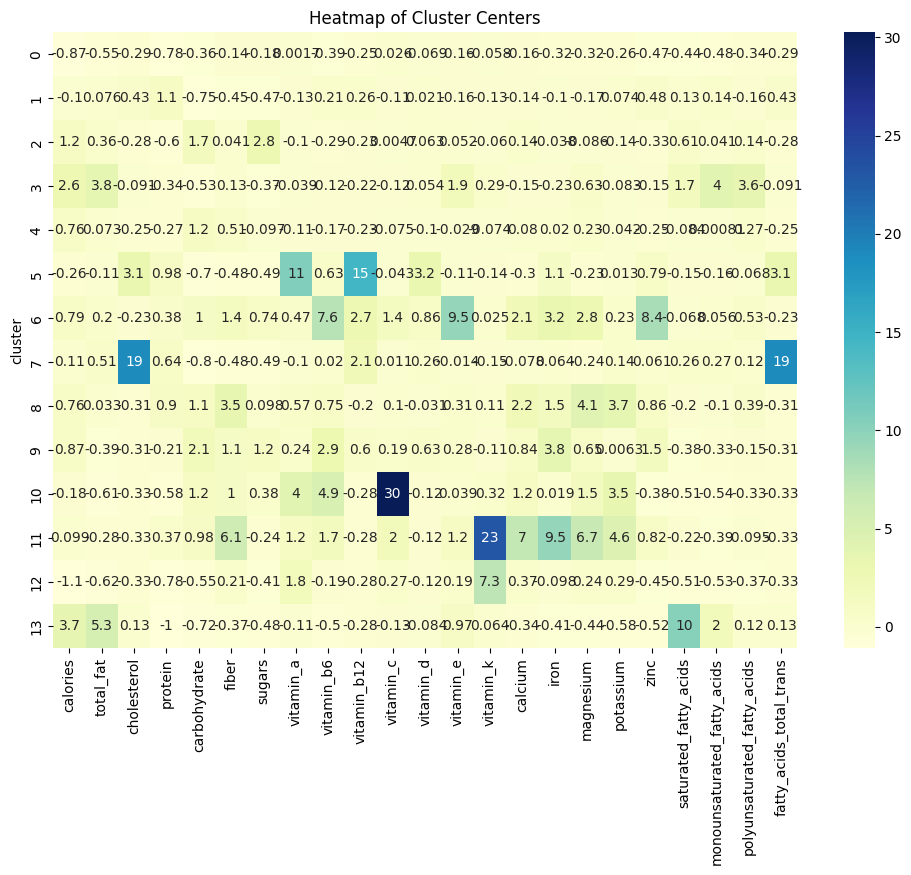

In [ ]:
# Assuming cluster_centers_df contains cluster centers in original scale
plt.figure(figsize=(12, 8))
sns.heatmap(cluster_centers_df.set_index('cluster'), cmap='YlGnBu', annot=True)
plt.title('Heatmap of Cluster Centers')
plt.show()


In [ ]:
# Assuming 'df' is your DataFrame and 'features' is your list of feature names
import pandas as pd

# Add cluster labels to your DataFrame (if not already added)
# df['cluster'] = kmeans.labels_

# Compute mean values for each feature within each cluster
cluster_profiles = df.groupby('cluster')[features_to_scale].mean().reset_index()

# Count the number of items in each cluster
cluster_counts = df['cluster'].value_counts().sort_index().reset_index()
cluster_counts.columns = ['cluster', 'count']

# Merge counts with cluster profiles
cluster_profiles = pd.merge(cluster_profiles, cluster_counts, on='cluster')

# Display the cluster profiles
print("Cluster Profiles:")
print(cluster_profiles)


Cluster Profiles:
    cluster  calories  total_fat  cholesterol   protein  carbohydrate  \
0         0 -0.871520  -0.545978    -0.292439 -0.781030     -0.362573   
1         1 -0.104310   0.075995     0.431141  1.124792     -0.751112   
2         2  1.210435   0.356808    -0.281715 -0.597406      1.679808   
3         3  2.645292   3.780226    -0.091284 -0.336068     -0.530096   
4         4  0.757145   0.072808    -0.247655 -0.269737      1.221571   
5         5 -0.264959  -0.108543     3.118789  0.975877     -0.703808   
6         6  0.793608   0.203773    -0.230103  0.381005      1.041907   
7         7  0.106511   0.506526    18.935739  0.637465     -0.796017   
8         8  0.759403   0.033382    -0.314819  0.904110      1.123227   
9         9  0.869006  -0.387892    -0.305089 -0.205638      2.065474   
10       10 -0.177559  -0.613684    -0.327843 -0.584223      1.187821   
11       11  0.099257  -0.282673    -0.329973  0.372957      0.980842   
12       12 -1.088423  -0.618551 

In [ ]:
# Function to generate cluster summaries
def generate_cluster_summaries(cluster_profiles, top_n_features=5):
    summaries = []
    for index, row in cluster_profiles.iterrows():
        cluster_num = row['cluster']
        count = row['count']
        print(f"\nCluster {cluster_num} Summary:")
        print(f"Number of Items: {int(count)}")

        # Extract feature means for the cluster
        feature_means = row.drop(['cluster', 'count'])

        # Identify top N features with the highest mean values
        top_features = feature_means.sort_values(ascending=False).head(top_n_features)

        print("Top Features (by mean value):")
        for feature, value in top_features.items():
            print(f"  {feature}: {value:.2f}")

        # Optionally, you can also display features with lowest values
        # bottom_features = feature_means.sort_values(ascending=True).head(top_n_features)
        # print("Lowest Features (by mean value):")
        # for feature, value in bottom_features.items():
        #     print(f"  {feature}: {value:.2f}")

        summaries.append({
            'cluster': cluster_num,
            'count': int(count),
            'top_features': top_features.to_dict()
        })
    return summaries

# Generate and display cluster summaries
cluster_summaries = generate_cluster_summaries(cluster_profiles)



Cluster 0.0 Summary:
Number of Items: 3081
Top Features (by mean value):
  vitamin_c: 0.03
  vitamin_a: 0.00
  vitamin_k: -0.06
  vitamin_d: -0.07
  fiber: -0.14

Cluster 1.0 Summary:
Number of Items: 2829
Top Features (by mean value):
  protein: 1.12
  zinc: 0.48
  fatty_acids_total_trans: 0.43
  cholesterol: 0.43
  vitamin_b12: 0.26

Cluster 2.0 Summary:
Number of Items: 662
Top Features (by mean value):
  sugars: 2.81
  carbohydrate: 1.68
  calories: 1.21
  saturated_fatty_acids: 0.61
  total_fat: 0.36

Cluster 3.0 Summary:
Number of Items: 280
Top Features (by mean value):
  monounsaturated_fatty_acids: 4.02
  total_fat: 3.78
  polyunsaturated_fatty_acids: 3.63
  calories: 2.65
  vitamin_e: 1.86

Cluster 4.0 Summary:
Number of Items: 1333
Top Features (by mean value):
  carbohydrate: 1.22
  calories: 0.76
  fiber: 0.51
  polyunsaturated_fatty_acids: 0.27
  magnesium: 0.23

Cluster 5.0 Summary:
Number of Items: 25
Top Features (by mean value):
  vitamin_b12: 14.50
  vitamin_a: 10.5

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# For clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# For dimensionality reduction (optional)
from sklearn.decomposition import PCA


In [ ]:
# Assuming your data is in a CSV file
df = pd.read_csv('/content/nutrition.csv')


In [ ]:
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0].sort_values(ascending=False)
print(missing_values)


saturated_fat    1590
dtype: int64


In [ ]:
df = df.drop(['Unnamed: 0'], axis=1)


In [ ]:
def extract_numeric(series):
    return series.replace('[a-zA-Z]', '', regex=True).astype(float)


In [ ]:
# List of columns to convert
cols_to_convert = [
    'serving_size', 'total_fat', 'saturated_fat', 'cholesterol', 'sodium',
    'choline', 'folate', 'folic_acid', 'niacin', 'pantothenic_acid',
    'riboflavin', 'thiamin', 'vitamin_a', 'vitamin_a_rae', 'carotene_alpha',
    'carotene_beta', 'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12',
    'vitamin_b6', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha',
    'vitamin_k', 'calcium', 'copper', 'irom', 'magnesium', 'manganese',
    'phosphorous', 'potassium', 'selenium', 'zink', 'protein', 'alanine',
    'arginine', 'aspartic_acid', 'cystine', 'glutamic_acid', 'glycine',
    'histidine', 'hydroxyproline', 'isoleucine', 'leucine', 'lysine',
    'methionine', 'phenylalanine', 'proline', 'serine', 'threonine',
    'tryptophan', 'tyrosine', 'valine', 'carbohydrate', 'fiber', 'sugars',
    'fructose', 'galactose', 'glucose', 'lactose', 'maltose', 'sucrose',
    'fat', 'saturated_fatty_acids', 'monounsaturated_fatty_acids',
    'polyunsaturated_fatty_acids', 'fatty_acids_total_trans', 'alcohol',
    'ash', 'caffeine', 'theobromine', 'water'
]

# Apply the extraction function
for col in cols_to_convert:
    df[col] = extract_numeric(df[col])


In [ ]:
df['vegetarian'] = df['vegetarian'].astype(int)
df['halal'] = df['halal'].astype(int)


In [ ]:
# Exclude identifiers and categorical flags if not relevant
features = df.drop(['name'], axis=1)


In [ ]:
features = df[cols_to_convert + ['calories', 'lucopene', 'vegetarian', 'halal']]


In [ ]:
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)


In [ ]:
# Check for missing values in the entire dataframe
missing_values_after = df.isnull().sum().sort_values(ascending=False)
print(missing_values_after[missing_values_after > 0])


saturated_fat    1590
dtype: int64


In [ ]:
import pandas as pd

# Display columns with missing values
missing_values = df.isnull().sum().sort_values(ascending=False)
missing_values = missing_values[missing_values > 0]
print(missing_values)


saturated_fat    1590
dtype: int64


In [ ]:
from sklearn.impute import SimpleImputer

# Initialize the imputer with median strategy
imputer = SimpleImputer(strategy='median')

# Reshape the data since SimpleImputer expects a 2D array
saturated_fat_values = df[['saturated_fat']]

# Fit and transform the data
df['saturated_fat'] = imputer.fit_transform(saturated_fat_values)


In [ ]:
# Check for missing values in 'saturated_fat'
missing_saturated_fat = df['saturated_fat'].isnull().sum()
print(f"Missing values in 'saturated_fat' after imputation: {missing_saturated_fat}")


Missing values in 'saturated_fat' after imputation: 0


In [ ]:
# Confirm no missing values remain in the entire dataframe
total_missing = df.isnull().sum().sum()
print(f"Total missing values in the dataset: {total_missing}")


Total missing values in the dataset: 0


In [ ]:
import re

# Function to extract numerical values from strings
def extract_numeric(series):
    # Replace non-numeric characters (except decimal point) with empty string
    return series.replace('[^0-9.]', '', regex=True).astype(float)

# List of columns to convert (excluding 'lucopene' which is already numeric)
cols_to_convert = [
    'serving_size', 'total_fat', 'saturated_fat', 'cholesterol', 'sodium',
    'choline', 'folate', 'folic_acid', 'niacin', 'pantothenic_acid',
    'riboflavin', 'thiamin', 'vitamin_a', 'vitamin_a_rae', 'carotene_alpha',
    'carotene_beta', 'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12',
    'vitamin_b6', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha',
    'vitamin_k', 'calcium', 'copper', 'irom', 'magnesium', 'manganese',
    'phosphorous', 'potassium', 'selenium', 'zink', 'protein', 'alanine',
    'arginine', 'aspartic_acid', 'cystine', 'glutamic_acid', 'glycine',
    'histidine', 'hydroxyproline', 'isoleucine', 'leucine', 'lysine',
    'methionine', 'phenylalanine', 'proline', 'serine', 'threonine',
    'tryptophan', 'tyrosine', 'valine', 'carbohydrate', 'fiber', 'sugars',
    'fructose', 'galactose', 'glucose', 'lactose', 'maltose', 'sucrose',
    'fat', 'saturated_fatty_acids', 'monounsaturated_fatty_acids',
    'polyunsaturated_fatty_acids', 'fatty_acids_total_trans', 'alcohol',
    'ash', 'caffeine', 'theobromine', 'water'
]

# Apply the extraction function to each column
for col in cols_to_convert:
    try:
        df[col] = extract_numeric(df[col])
    except Exception as e:
        print(f"Error converting column {col}: {e}")
        # Handle or log the error as needed


In [ ]:
df['vegetarian'] = df['vegetarian'].astype(int)
df['halal'] = df['halal'].astype(int)


In [ ]:
# List all column names in the DataFrame
print("Current Columns in DataFrame:")
print(df.columns.tolist())


Current Columns in DataFrame:
['name', 'serving_size', 'calories', 'total_fat', 'saturated_fat', 'cholesterol', 'sodium', 'choline', 'folate', 'folic_acid', 'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a', 'vitamin_a_rae', 'carotene_alpha', 'carotene_beta', 'cryptoxanthin_beta', 'lutein_zeaxanthin', 'lucopene', 'vitamin_b12', 'vitamin_b6', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k', 'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous', 'potassium', 'selenium', 'zink', 'protein', 'alanine', 'arginine', 'aspartic_acid', 'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline', 'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine', 'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine', 'carbohydrate', 'fiber', 'sugars', 'fructose', 'galactose', 'glucose', 'lactose', 'maltose', 'sucrose', 'fat', 'saturated_fatty_acids', 'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids', 'fatty_ac

In [ ]:
# Check if 'Unnamed: 0' exists
if 'Unnamed: 0' in df.columns:
    print("'Unnamed: 0' column is present.")
else:
    print("'Unnamed: 0' column is NOT present.")

# Check if 'name' exists
if 'name' in df.columns:
    print("'name' column is present.")
else:
    print("'name' column is NOT present.")


'Unnamed: 0' column is NOT present.
'name' column is present.


In [ ]:
# Define columns you want to drop
columns_to_drop = ['Unnamed: 0', 'name']  # Add other non-informative columns if needed

# Identify which of these columns are actually present in the DataFrame
existing_columns_to_drop = [col for col in columns_to_drop if col in df.columns]

# Drop the existing columns
df = df.drop(existing_columns_to_drop, axis=1)

print(f"Dropped columns: {existing_columns_to_drop}")


Dropped columns: ['name']


In [ ]:
# Select features for clustering
# Exclude any remaining non-informative or identifier columns if necessary
# For example, if 'serving_size' is now numerical and relevant, include it

# Define the list of columns to include in clustering
# You can include all columns or select specific ones based on your feature engineering
features = df.copy()

# Optionally, remove 'serving_size' if it's not needed or convert it to a numerical value
# If 'serving_size' is still an object, ensure it's converted to numerical

# Example: If 'serving_size' is in grams as a float, keep it; otherwise, convert if necessary
# Assuming it's already converted as per previous steps


In [ ]:
# Verify no missing values remain
total_missing = df.isnull().sum().sum()
print(f"Total missing values in the dataset: {total_missing}")

if total_missing > 0:
    print("Handling remaining missing values...")
    # Depending on the columns with missing values, decide to impute or drop
    # For demonstration, we'll impute numerical columns with median and categorical with mode

    from sklearn.impute import SimpleImputer

    # Separate numerical and categorical columns
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Initialize imputers
    imputer_num = SimpleImputer(strategy='median')
    imputer_cat = SimpleImputer(strategy='most_frequent')

    # Impute numerical columns
    df[numerical_cols] = imputer_num.fit_transform(df[numerical_cols])

    # Impute categorical columns
    df[categorical_cols] = imputer_cat.fit_transform(df[categorical_cols])

    # Verify again
    total_missing = df.isnull().sum().sum()
    print(f"Total missing values after imputation: {total_missing}")
else:
    print("No missing values detected.")


Total missing values in the dataset: 0
No missing values detected.


In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the features
features_scaled = scaler.fit_transform(features)

# Optional: Convert scaled features back to DataFrame for easier handling
# Note: This step is optional and depends on your preference
# feature_names = features.columns.tolist()
# features_scaled_df = pd.DataFrame(features_scaled, columns=feature_names)


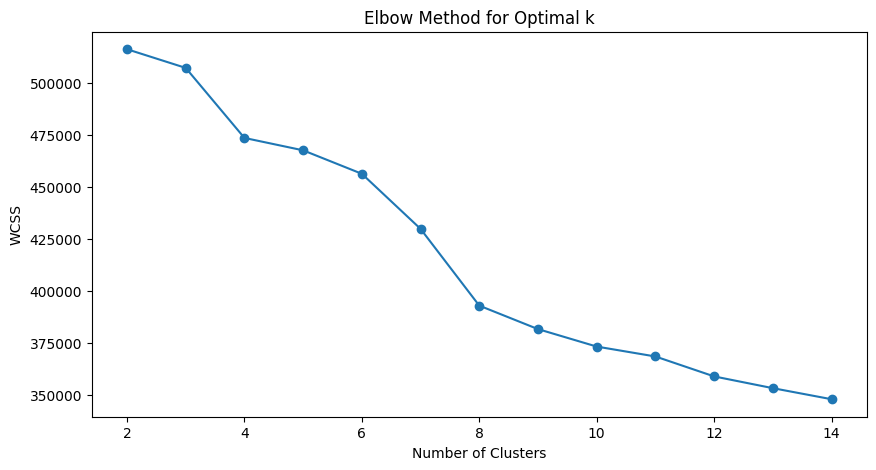

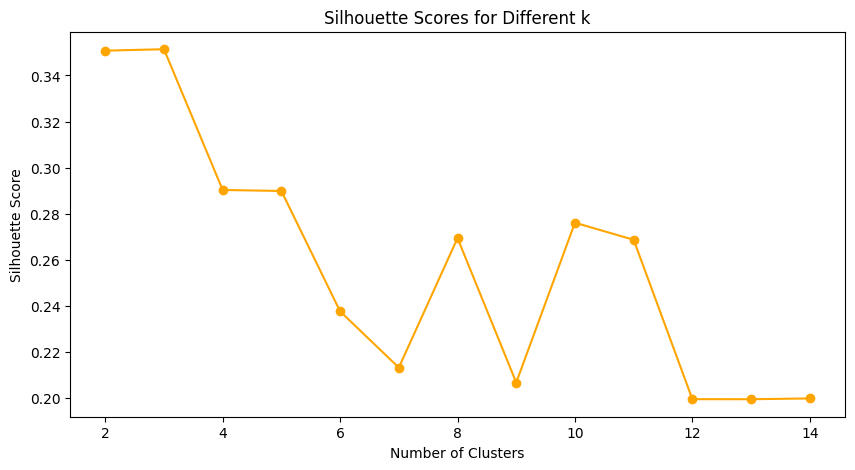

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

wcss = []
silhouette_scores = []
k_range = range(2, 15)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    wcss.append(kmeans.inertia_)

    # Compute Silhouette Score
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(features_scaled, labels)
    silhouette_scores.append(silhouette_avg)

# Plot Elbow Method
plt.figure(figsize=(10,5))
plt.plot(k_range, wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Plot Silhouette Scores
plt.figure(figsize=(10,5))
plt.plot(k_range, silhouette_scores, marker='o', color='orange')
plt.title('Silhouette Scores for Different k')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


In [ ]:
# Define the optimal number of clusters
optimal_k = 5  # Replace with your determined k

# Initialize and fit K-Means
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df['cluster'] = kmeans.fit_predict(features_scaled)

print("Cluster labels assigned to the DataFrame.")


Cluster labels assigned to the DataFrame.


In [ ]:
# Group by cluster and calculate mean for each feature
cluster_summary = df.groupby('cluster').mean()
print("Cluster Summary (Mean Values):")
print(cluster_summary)


Cluster Summary (Mean Values):
         serving_size    calories   total_fat  saturated_fat  cholesterol  \
cluster                                                                     
0               100.0  112.862740    3.229859       1.799565     9.776184   
1               100.0  217.879273   12.096836       4.148509    99.739636   
2               100.0  902.000000  100.000000      23.000000   570.000000   
3               100.0  444.570826   21.953283       7.139306    12.808161   
4               100.0  185.000000    0.900000       2.200000     0.000000   

              sodium    choline       folate   folic_acid      niacin  ...  \
cluster                                                                ...   
0         234.928553   8.850218    20.930858     3.637644    1.129678  ...   
1         225.852364  51.127382    23.753091     0.612000    5.367002  ...   
2           0.000000   0.000000     0.000000     0.000000    0.000000  ...   
3         539.715760  15.435741   110.9

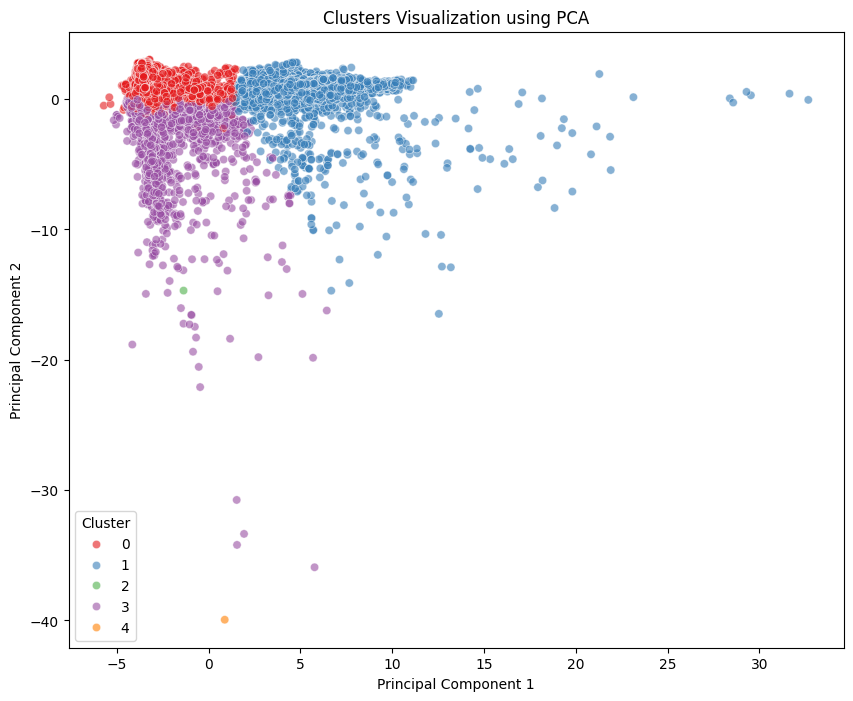

In [ ]:
from sklearn.decomposition import PCA
import seaborn as sns

# Initialize PCA
pca = PCA(n_components=2, random_state=42)
principal_components = pca.fit_transform(features_scaled)

# Create a DataFrame with principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['cluster'] = df['cluster']

# Plot the clusters
plt.figure(figsize=(10,8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster', palette='Set1', alpha=0.6)
plt.title('Clusters Visualization using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()


In [ ]:
def generate_meal_plan(user_profile, df, top_n=14):
    """
    Generates a weekly meal plan for a user based on their profile.

    Parameters:
    - user_profile: dict containing user data (Height, Weight, etc.)
    - df: DataFrame containing food items with cluster labels
    - top_n: Total number of meals to generate (e.g., 14 for two meals/day over a week)

    Returns:
    - meal_plan: DataFrame of selected food items
    """
    # Step 1: Calculate TDEE (Implement this based on your formula)
    tdee = calculate_tdee(user_profile)  # Define this function accordingly

    # Step 2: Classify user segment (Use your classification model)
    user_segment = classify_user(user_profile)  # Define this function accordingly

    # Step 3: Filter food items based on dietary flags
    filtered_food = df[
        (df['vegetarian'] == user_profile.get('vegetarian', 1)) &
        (df['halal'] == user_profile.get('halal', 1))
    ]

    # Step 4: Ensure there are enough clusters
    clusters = filtered_food['cluster'].unique()
    num_clusters = len(clusters)

    # Calculate meals per cluster
    meals_per_cluster = top_n // num_clusters
    extra_meals = top_n % num_clusters

    selected_meals = []

    for cluster in clusters:
        cluster_items = filtered_food[filtered_food['cluster'] == cluster]
        if len(cluster_items) < meals_per_cluster:
            # If not enough items in the cluster, sample with replacement
            sampled = cluster_items.sample(n=meals_per_cluster, replace=True)
        else:
            sampled = cluster_items.sample(n=meals_per_cluster, replace=False)
        selected_meals.append(sampled)

    # Handle any remaining meals
    if extra_meals > 0:
        remaining_clusters = clusters[:extra_meals]
        for cluster in remaining_clusters:
            cluster_items = filtered_food[filtered_food['cluster'] == cluster]
            sampled = cluster_items.sample(n=1, replace=True)
            selected_meals.append(sampled)

    # Concatenate selected meals and shuffle
    meal_plan_df = pd.concat(selected_meals).sample(frac=1).reset_index(drop=True)

    # Select top_n meals
    meal_plan = meal_plan_df.head(top_n)

    return meal_plan


In [ ]:
def calculate_tdee(user_profile):
    """
    Calculates the Total Daily Energy Expenditure (TDEE) for a user.

    Parameters:
    - user_profile: dict containing user data

    Returns:
    - tdee: float representing TDEE in calories
    """
    # Extract user details
    weight = user_profile['Weight']  # in kg
    height = user_profile['Height']  # in cm
    dob = pd.to_datetime(user_profile['DOB'])
    current_year = 2024  # Update based on current date
    age = current_year - dob.year - ((pd.Timestamp(current_year, 12, 3) < dob.replace(year=current_year)).astype(int))
    gender = user_profile['Gender'].lower()
    activity_level = user_profile['Exercise Level'].lower()

    # Basal Metabolic Rate (BMR) using Mifflin-St Jeor Equation
    if gender == 'male':
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 'female':
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        # Default or handle other genders appropriately
        bmr = 10 * weight + 6.25 * height - 5 * age + 5  # Assuming male as default

    # Activity factor mapping
    activity_factors = {
        'sedentary': 1.2,
        'light': 1.375,
        'moderate': 1.55,
        'active': 1.725,
        'very active': 1.9
    }

    factor = activity_factors.get(activity_level, 1.2)  # Default to sedentary if not found
    tdee = bmr * factor

    return tdee


In [ ]:
def classify_user(user_profile, classifier, scaler, feature_columns):
    """
    Classifies the user into a segment based on their profile.

    Parameters:
    - user_profile: dict containing user data
    - classifier: trained classification model
    - scaler: fitted scaler object
    - feature_columns: list of feature names used in the classifier

    Returns:
    - user_segment: predicted segment label
    """
    import pandas as pd

    # Convert user_profile to DataFrame
    user_df = pd.DataFrame([user_profile])

    # Feature Engineering
    user_df['age'] = calculate_age(user_profile['DOB'], current_year=2024)  # Implement calculate_age if needed
    user_df['BMI'] = user_profile['Weight'] / (user_profile['Height']/100)**2
    user_df['TDEE'] = calculate_tdee(user_profile)

    # Select relevant features
    X = user_df[feature_columns]

    # Handle missing or extra columns
    X = X.reindex(columns=feature_columns, fill_value=0)

    # Scale features
    X_scaled = scaler.transform(X)

    # Predict segment
    user_segment = classifier.predict(X_scaled)[0]

    return user_segment


In [ ]:
def calculate_tdee(user_profile):
    """
    Calculates the Total Daily Energy Expenditure (TDEE) for a user.

    Parameters:
    - user_profile: dict containing user data

    Returns:
    - tdee: float representing TDEE in calories
    """
    import pandas as pd

    # Extract user details
    weight = user_profile['Weight']  # in kg
    height = user_profile['Height']  # in cm
    dob = pd.to_datetime(user_profile['DOB'])  # Convert DOB to datetime
    current_date = pd.Timestamp.now()  # Current date

    # Calculate age
    age = current_date.year - dob.year
    if current_date < dob.replace(year=current_date.year):  # Adjust for upcoming birthday
        age -= 1

    # Gender
    gender = user_profile['Gender'].lower()

    # Activity level
    activity_level = user_profile['Exercise Level'].lower()

    # Basal Metabolic Rate (BMR) using Mifflin-St Jeor Equation
    if gender == 'male':
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 'female':
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        # Default or handle other genders appropriately
        bmr = 10 * weight + 6.25 * height - 5 * age + 5  # Assuming male as default

    # Activity factor mapping
    activity_factors = {
        'sedentary': 1.2,
        'light': 1.375,
        'moderate': 1.55,
        'active': 1.725,
        'very active': 1.9
    }

    factor = activity_factors.get(activity_level, 1.2)  # Default to sedentary if not found
    tdee = bmr * factor

    return tdee


In [ ]:
# Example user profile
user_profile = {
    'Height': 175,  # in cm
    'DOB': '1990-05-15',  # Birthdate in YYYY-MM-DD format
    'Weight': 70,  # in kg
    'Gender': 'Male',
    'Exercise Level': 'Moderate'
}

# Calculate TDEE
tdee = calculate_tdee(user_profile)
print(f"TDEE for the user: {tdee} calories")


TDEE for the user: 2524.5625 calories


In [ ]:
def generate_meal_plan(user_profile, df, classifier, scaler, feature_columns, top_n=14):
    """
    Generates a weekly meal plan for a user based on their profile.

    Parameters:
    - user_profile: dict containing user data
    - df: DataFrame containing food items with cluster labels
    - classifier: Trained classification model
    - scaler: Fitted scaler for feature scaling
    - feature_columns: List of feature names used in the classifier
    - top_n: Total number of meals to generate (e.g., 14 for two meals/day over a week)

    Returns:
    - meal_plan: DataFrame of selected food items
    """
    # Step 1: Calculate TDEE
    tdee = calculate_tdee(user_profile)
    print(f"TDEE for user: {tdee}")

    # Step 2: Classify user segment
    user_segment = classify_user(user_profile, classifier, scaler, feature_columns)
    print(f"User classified into segment: {user_segment}")

    # Step 3: Filter food items based on dietary flags
    filtered_food = df[
        (df['vegetarian'] == user_profile.get('vegetarian', 1)) &
        (df['halal'] == user_profile.get('halal', 1))
    ]

    # Step 4: Ensure there are enough clusters
    clusters = filtered_food['cluster'].unique()
    num_clusters = len(clusters)

    # Calculate meals per cluster
    meals_per_cluster = top_n // num_clusters
    extra_meals = top_n % num_clusters

    selected_meals = []

    for cluster in clusters:
        cluster_items = filtered_food[filtered_food['cluster'] == cluster]
        sampled = cluster_items.sample(n=meals_per_cluster, replace=True if len(cluster_items) < meals_per_cluster else False)
        selected_meals.append(sampled)

    # Handle any remaining meals
    if extra_meals > 0:
        remaining_clusters = clusters[:extra_meals]
        for cluster in remaining_clusters:
            cluster_items = filtered_food[filtered_food['cluster'] == cluster]
            sampled = cluster_items.sample(n=1, replace=True)
            selected_meals.append(sampled)

    # Concatenate selected meals and shuffle
    meal_plan_df = pd.concat(selected_meals).sample(frac=1).reset_index(drop=True)

    # Select top_n meals
    meal_plan = meal_plan_df.head(top_n)

    return meal_plan


In [ ]:
# Example user profile
user_profile = {
    'Height': 175,          # in cm
    'DOB': '1990-05-15',    # Birthdate in YYYY-MM-DD format
    'Weight': 70,           # in kg
    'Gender': 'Male',       # 'Male' or 'Female'
    'Exercise Level': 'Moderate',  # Activity level
    'vegetarian': 0,        # 0 for non-vegetarian, 1 for vegetarian
    'halal': 1              # 0 for non-halal, 1 for halal
}


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# Define calculate_tdee function
def calculate_tdee(user_profile):
    """
    Calculates the Total Daily Energy Expenditure (TDEE) for a user.
    """
    # Extract user details
    weight = user_profile['Weight']  # in kg
    height = user_profile['Height']  # in cm
    dob = pd.to_datetime(user_profile['DOB'])  # Convert DOB to datetime
    current_date = pd.Timestamp.now()  # Current date

    # Calculate age
    age = current_date.year - dob.year
    if current_date < dob.replace(year=current_date.year):  # Adjust for upcoming birthday
        age -= 1

    # Gender
    gender = user_profile['Gender'].lower()

    # Activity level
    activity_level = user_profile['Exercise Level'].lower()

    # Basal Metabolic Rate (BMR) using Mifflin-St Jeor Equation
    if gender == 'male':
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 'female':
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        # Default or handle other genders appropriately
        bmr = 10 * weight + 6.25 * height - 5 * age + 5  # Assuming male as default

    # Activity factor mapping
    activity_factors = {
        'sedentary': 1.2,
        'light': 1.375,
        'moderate': 1.55,
        'active': 1.725,
        'very active': 1.9
    }

    factor = activity_factors.get(activity_level, 1.2)  # Default to sedentary if not found
    tdee = bmr * factor

    return tdee

# Define classify_user function
def classify_user(user_profile, classifier, scaler, feature_columns):
    """
    Classifies the user into a segment based on their profile.
    """
    # Convert user_profile to DataFrame
    user_df = pd.DataFrame([user_profile])

    # Feature Engineering
    user_df['age'] = pd.Timestamp.now().year - pd.to_datetime(user_profile['DOB']).year
    user_df['BMI'] = user_profile['Weight'] / ((user_profile['Height'] / 100) ** 2)
    user_df['TDEE'] = calculate_tdee(user_profile)

    # Select relevant features
    X = user_df[feature_columns]

    # Handle missing or extra columns
    X = X.reindex(columns=feature_columns, fill_value=0)

    # Scale features
    X_scaled = scaler.transform(X)

    # Predict segment
    user_segment = classifier.predict(X_scaled)[0]

    return user_segment

# Define generate_meal_plan function
def generate_meal_plan(user_profile, df, classifier, scaler, feature_columns, top_n=14):
    """
    Generates a weekly meal plan for a user based on their profile.
    """
    # Step 1: Calculate TDEE
    tdee = calculate_tdee(user_profile)
    print(f"TDEE for user: {tdee}")

    # Step 2: Classify user segment
    user_segment = classify_user(user_profile, classifier, scaler, feature_columns)
    print(f"User classified into segment: {user_segment}")

    # Step 3: Filter food items based on dietary flags
    filtered_food = df[
        (df['vegetarian'] == user_profile.get('vegetarian', 1)) &
        (df['halal'] == user_profile.get('halal', 1))
    ]

    # Step 4: Ensure there are enough clusters
    clusters = filtered_food['cluster'].unique()
    num_clusters = len(clusters)

    # Calculate meals per cluster
    meals_per_cluster = top_n // num_clusters
    extra_meals = top_n % num_clusters

    selected_meals = []

    for cluster in clusters:
        cluster_items = filtered_food[filtered_food['cluster'] == cluster]
        sampled = cluster_items.sample(n=meals_per_cluster, replace=True if len(cluster_items) < meals_per_cluster else False)
        selected_meals.append(sampled)

    # Handle any remaining meals
    if extra_meals > 0:
        remaining_clusters = clusters[:extra_meals]
        for cluster in remaining_clusters:
            cluster_items = filtered_food[filtered_food['cluster'] == cluster]
            sampled = cluster_items.sample(n=1, replace=True)
            selected_meals.append(sampled)

    # Concatenate selected meals and shuffle
    meal_plan_df = pd.concat(selected_meals).sample(frac=1).reset_index(drop=True)

    # Select top_n meals
    meal_plan = meal_plan_df.head(top_n)

    return meal_plan

# Simulated data for fitting scaler and training classifier
training_data = pd.DataFrame({
    'Height': [160, 170, 180, 150],
    'Weight': [60, 70, 80, 55],
    'TDEE': [2000, 2500, 3000, 1800],
    'BMI': [23.4, 24.2, 25.6, 24.4],
    'age': [25, 35, 45, 30],
    'segment': [1, 2, 2, 1]  # User segments (example)
})

# Fit the scaler
scaler = StandardScaler()
scaler.fit(training_data[['Height', 'Weight', 'TDEE', 'BMI', 'age']])

# Fit the classifier
classifier = RandomForestClassifier()
classifier.fit(training_data[['Height', 'Weight', 'TDEE', 'BMI', 'age']], training_data['segment'])

# Simulated food dataset
df = pd.DataFrame({
    'name': ['Chicken Breast', 'Broccoli', 'Almonds', 'Salmon', 'Tofu'],
    'calories': [165, 55, 575, 208, 76],
    'cluster': [1, 2, 3, 1, 4],
    'vegetarian': [0, 1, 1, 0, 1],
    'halal': [1, 1, 1, 1, 1]
})

# Define feature columns
feature_columns = ['Height', 'Weight', 'TDEE', 'BMI', 'age']

# Example user profile
user_profile = {
    'Height': 175,  # in cm
    'DOB': '1990-05-15',  # Birthdate in YYYY-MM-DD format
    'Weight': 70,  # in kg
    'Gender': 'Male',  # Gender
    'Exercise Level': 'Moderate',  # Activity level
    'vegetarian': 0,  # 0 for non-vegetarian
    'halal': 1       # 1 for halal
}

# Generate a meal plan
meal_plan = generate_meal_plan(user_profile, df, classifier, scaler, feature_columns, top_n=14)
print(meal_plan[['name', 'calories', 'cluster']])


TDEE for user: 2524.5625
User classified into segment: 1
              name  calories  cluster
0           Salmon       208        1
1           Salmon       208        1
2           Salmon       208        1
3   Chicken Breast       165        1
4           Salmon       208        1
5   Chicken Breast       165        1
6           Salmon       208        1
7   Chicken Breast       165        1
8           Salmon       208        1
9           Salmon       208        1
10          Salmon       208        1
11          Salmon       208        1
12          Salmon       208        1
13          Salmon       208        1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# Function definitions: calculate_tdee, classify_user, and generate_meal_plan
def calculate_tdee(user_profile):
    weight = user_profile['Weight']
    height = user_profile['Height']
    dob = pd.to_datetime(user_profile['DOB'])
    current_date = pd.Timestamp.now()
    age = current_date.year - dob.year
    if current_date < dob.replace(year=current_date.year):
        age -= 1
    gender = user_profile['Gender'].lower()
    activity_level = user_profile['Exercise Level'].lower()
    bmr = (
        10 * weight + 6.25 * height - 5 * age + (5 if gender == 'male' else -161)
    )
    activity_factors = {
        'sedentary': 1.2,
        'light': 1.375,
        'moderate': 1.55,
        'active': 1.725,
        'very active': 1.9
    }
    return bmr * activity_factors.get(activity_level, 1.2)

def classify_user(user_profile, classifier, scaler, feature_columns):
    user_df = pd.DataFrame([user_profile])
    user_df['age'] = pd.Timestamp.now().year - pd.to_datetime(user_profile['DOB']).year
    user_df['BMI'] = user_profile['Weight'] / ((user_profile['Height'] / 100) ** 2)
    user_df['TDEE'] = calculate_tdee(user_profile)
    X = user_df.reindex(columns=feature_columns, fill_value=0)
    X_scaled = scaler.transform(X)
    return classifier.predict(X_scaled)[0]

def generate_meal_plan(user_profile, df, classifier, scaler, feature_columns, top_n=14):
    tdee = calculate_tdee(user_profile)
    print(f"TDEE for user: {tdee}")
    user_segment = classify_user(user_profile, classifier, scaler, feature_columns)
    print(f"User classified into segment: {user_segment}")
    filtered_food = df[
        (df['vegetarian'] == user_profile.get('vegetarian', 1)) &
        (df['halal'] == user_profile.get('halal', 1))
    ]
    clusters = filtered_food['cluster'].unique()
    meals_per_cluster = top_n // len(clusters)
    selected_meals = [
        filtered_food[filtered_food['cluster'] == cluster].sample(
            n=min(meals_per_cluster, len(filtered_food[filtered_food['cluster'] == cluster])),
            replace=False
        ) for cluster in clusters
    ]
    all_meals = pd.concat(selected_meals, axis=0).sample(frac=1).reset_index(drop=True)
    return all_meals.head(top_n)

# Simulated training data and food dataset
training_data = pd.DataFrame({
    'Height': [160, 170, 180, 150],
    'Weight': [60, 70, 80, 55],
    'TDEE': [2000, 2500, 3000, 1800],
    'BMI': [23.4, 24.2, 25.6, 24.4],
    'age': [25, 35, 45, 30],
    'segment': [1, 2, 2, 1]
})
scaler = StandardScaler()
scaler.fit(training_data[['Height', 'Weight', 'TDEE', 'BMI', 'age']])
classifier = RandomForestClassifier()
classifier.fit(training_data[['Height', 'Weight', 'TDEE', 'BMI', 'age']], training_data['segment'])

df = pd.DataFrame({
    'name': ['Chicken Breast', 'Broccoli', 'Almonds', 'Salmon', 'Tofu'],
    'calories': [165, 55, 575, 208, 76],
    'cluster': [1, 2, 3, 1, 4],
    'vegetarian': [0, 1, 1, 0, 1],
    'halal': [1, 1, 1, 1, 1]
})
feature_columns = ['Height', 'Weight', 'TDEE', 'BMI', 'age']
user_profile = {
    'Height': 175, 'DOB': '1990-05-15', 'Weight': 70, 'Gender': 'Male',
    'Exercise Level': 'Moderate', 'vegetarian': 0, 'halal': 1
}
meal_plan = generate_meal_plan(user_profile, df, classifier, scaler, feature_columns, top_n=14)
print(meal_plan[['name', 'calories', 'cluster']])


TDEE for user: 2524.5625
User classified into segment: 1
             name  calories  cluster
0  Chicken Breast       165        1
1          Salmon       208        1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# Function to calculate TDEE
def calculate_tdee(user_profile):
    weight = user_profile['Weight']
    height = user_profile['Height']
    dob = pd.to_datetime(user_profile['DOB'])
    current_date = pd.Timestamp.now()
    age = current_date.year - dob.year
    if current_date < dob.replace(year=current_date.year):
        age -= 1
    gender = user_profile['Gender'].lower()
    activity_level = user_profile['Exercise Level'].lower()
    bmr = (
        10 * weight + 6.25 * height - 5 * age + (5 if gender == 'male' else -161)
    )
    activity_factors = {
        'sedentary': 1.2,
        'light': 1.375,
        'moderate': 1.55,
        'active': 1.725,
        'very active': 1.9
    }
    return bmr * activity_factors.get(activity_level, 1.2)

# Function to classify user
def classify_user(user_profile, classifier, scaler, feature_columns):
    user_df = pd.DataFrame([user_profile])
    user_df['age'] = pd.Timestamp.now().year - pd.to_datetime(user_profile['DOB']).year
    user_df['BMI'] = user_profile['Weight'] / ((user_profile['Height'] / 100) ** 2)
    user_df['TDEE'] = calculate_tdee(user_profile)
    X = user_df.reindex(columns=feature_columns, fill_value=0)
    X_scaled = scaler.transform(X)
    return classifier.predict(X_scaled)[0]

# Function to generate a meal plan
def generate_meal_plan(user_profile, df, classifier, scaler, feature_columns, top_n=14):
    tdee = calculate_tdee(user_profile)
    print(f"TDEE for user: {tdee}")
    user_segment = classify_user(user_profile, classifier, scaler, feature_columns)
    print(f"User classified into segment: {user_segment}")

    # Filter food items based on user preferences
    filtered_food = df[
        (df['vegetarian'] == user_profile.get('vegetarian', 1)) &
        (df['halal'] == user_profile.get('halal', 1))
    ]

    # Ensure diversity by sampling unique meals from clusters
    clusters = filtered_food['cluster'].unique()
    meals_per_cluster = top_n // len(clusters)
    selected_meals = []
    for cluster in clusters:
        cluster_items = filtered_food[filtered_food['cluster'] == cluster]
        sampled = cluster_items.sample(
            n=min(meals_per_cluster, len(cluster_items)), replace=False
        )
        selected_meals.append(sampled)

    # Combine and shuffle the selected meals
    all_meals = pd.concat(selected_meals, axis=0).sample(frac=1).reset_index(drop=True)
    return all_meals.head(top_n)

# Simulated training data and scaler/classifier setup
training_data = pd.DataFrame({
    'Height': [160, 170, 180, 150],
    'Weight': [60, 70, 80, 55],
    'TDEE': [2000, 2500, 3000, 1800],
    'BMI': [23.4, 24.2, 25.6, 24.4],
    'age': [25, 35, 45, 30],
    'segment': [1, 2, 2, 1]
})
scaler = StandardScaler()
scaler.fit(training_data[['Height', 'Weight', 'TDEE', 'BMI', 'age']])
classifier = RandomForestClassifier()
classifier.fit(training_data[['Height', 'Weight', 'TDEE', 'BMI', 'age']], training_data['segment'])

# Simulated food dataset
df = pd.DataFrame({
    'name': ['Chicken Breast', 'Broccoli', 'Almonds', 'Salmon', 'Tofu'],
    'calories': [165, 55, 575, 208, 76],
    'cluster': [1, 2, 3, 1, 4],
    'vegetarian': [0, 1, 1, 0, 1],
    'halal': [1, 1, 1, 1, 1]
})

# Define feature columns
feature_columns = ['Height', 'Weight', 'TDEE', 'BMI', 'age']

# Example user profile
user_profile = {
    'Height': 175,  # in cm
    'DOB': '1990-05-15',  # Birthdate in YYYY-MM-DD format
    'Weight': 70,  # in kg
    'Gender': 'Male',  # Gender
    'Exercise Level': 'Moderate',  # Activity level
    'vegetarian': 0,  # 0 for non-vegetarian
    'halal': 1       # 1 for halal
}

# Generate the meal plan
meal_plan = generate_meal_plan(user_profile, df, classifier, scaler, feature_columns, top_n=14)
print(meal_plan[['name', 'calories', 'cluster']])


TDEE for user: 2524.5625
User classified into segment: 1
             name  calories  cluster
0          Salmon       208        1
1  Chicken Breast       165        1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, silhouette_score

# --- DATA LOADING ---

# Load food dataset from CSV
food_csv_path = '/content/nutrition.csv'  # Replace with your actual file path
food_data = pd.read_csv(food_csv_path)

# --- HARD-CODED USER DATA ---
user_data = pd.DataFrame({
    'Height': [160, 170, 180, 150, 165],
    'Weight': [60, 70, 80, 50, 68],
    'DOB': ['1990-01-01', '1985-05-20', '2000-10-15', '1975-12-05', '1995-07-07'],
    'Gender': ['Male', 'Female', 'Male', 'Female', 'Male'],
    'Exercise_Level': ['Moderate', 'Active', 'Sedentary', 'Light', 'Moderate'],
    'Preference': ['High Protein', 'Low Carb', 'Balanced', 'Vegetarian', 'High Protein']
})

# --- DATA PREPROCESSING ---

# Preprocess food dataset
food_data = food_data.drop(['Unnamed: 0', 'serving_size'], axis=1, errors='ignore')  # Drop irrelevant columns

# Identify numeric columns
numeric_columns = [
    'calories', 'total_fat', 'protein', 'carbohydrate', 'fiber',
    'sugars', 'sodium'
]

# Remove units and convert columns to numeric
for column in numeric_columns:
    if column in food_data.columns:  # Ensure the column exists
        food_data[column] = (
            food_data[column]
            .astype(str)                     # Ensure all values are strings
            .str.replace(r'[^\d.]', '', regex=True)  # Remove non-numeric characters (e.g., "g", "mg")
        )
        food_data[column] = pd.to_numeric(food_data[column], errors='coerce')  # Convert to numeric

# Handle missing values by replacing NaN with 0
food_data = food_data.fillna(0)

# Prepare food features for clustering
food_features = food_data.drop(['name', 'vegetarian', 'halal'], axis=1, errors='ignore')  # Exclude non-numeric columns

# Scale features for clustering
scaler = StandardScaler()
food_features_scaled = scaler.fit_transform(food_features)

# Preprocess user dataset
user_data['DOB'] = pd.to_datetime(user_data['DOB'])
user_data['Age'] = pd.Timestamp.now().year - user_data['DOB'].dt.year
user_data['BMI'] = user_data['Weight'] / ((user_data['Height'] / 100) ** 2)

# Label encode categorical data
label_encoder = LabelEncoder()
user_data['Gender'] = label_encoder.fit_transform(user_data['Gender'])
user_data['Exercise_Level'] = label_encoder.fit_transform(user_data['Exercise_Level'])
user_data['Preference'] = label_encoder.fit_transform(user_data['Preference'])

# Select classification features
user_features = user_data[['Height', 'Weight', 'Age', 'BMI', 'Gender', 'Exercise_Level']]
user_labels = user_data['Preference']

# --- CLUSTERING FOOD ITEMS ---

# Fit KMeans clustering
optimal_k = 3  # Set optimal number of clusters based on Elbow Method
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
food_data['cluster'] = kmeans.fit_predict(food_features_scaled)

# Evaluate clustering quality
silhouette_avg = silhouette_score(food_features_scaled, food_data['cluster'])
print(f'Silhouette Score for Clustering: {silhouette_avg}')

# --- CLASSIFICATION MODEL TRAINING ---

# Split user data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(user_features, user_labels, test_size=0.2, random_state=42)

# Train a Random Forest classifier
classifier = RandomForestClassifier(random_state=42, n_estimators=100)
classifier.fit(X_train, y_train)

# Evaluate the classifier
y_pred = classifier.predict(X_test)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# --- OUTPUT RESULTS ---

# Display clustered food data
print("\nClustered Food Data:")
print(food_data[['name', 'calories', 'cluster']])

# Display feature importance from the classification model
feature_importances = pd.DataFrame({
    'Feature': user_features.columns,
    'Importance': classifier.feature_importances_
}).sort_values(by='Importance', ascending=False)
print("\nFeature Importances:\n", feature_importances)


ValueError: could not convert string to float: '6.2g'

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report


class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")

        # Preprocessing configurations
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

    def clean_numeric_data(self, data, columns):
        """Clean numeric columns by removing non-numeric characters"""
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")  # Debug: Show progress
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]', '', regex=True)
                    # Convert cleaned strings to numeric
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Fill NaN values with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """Preprocess food dataset for clustering"""
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop unnecessary columns
            columns_to_drop = ['name', 'vegetarian', 'halal']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Debugging: Check for any remaining non-numeric values
            non_numeric = food_features.applymap(lambda x: isinstance(x, str) and not x.isdigit())
            if non_numeric.any().any():
                print("Warning: Non-numeric values found after cleaning.")
                print(food_features[non_numeric.any(axis=1)])
                # Optionally, handle these rows or drop them
                food_features = food_features.apply(pd.to_numeric, errors='coerce').fillna(0)

            # Scale features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """Perform K-Means clustering on food data"""
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate silhouette score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg}")

            # Add cluster labels to original dataset
            self.food_data = self.food_data.reset_index(drop=True)  # Ensure alignment
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """Preprocess user data for classification"""
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            self.user_data['BMI'] = self.user_data['Weight'] / ((self.user_data['Height'] / 100) ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            label_encoder = LabelEncoder()
            categorical_columns = ['Gender', 'Exercise_Level']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    self.user_data[col] = self.user_data[col].astype(str)  # Ensure all are strings
                    self.user_data[col] = label_encoder.fit_transform(self.user_data[col])

            # Encode target variable if it's categorical
            if self.user_data['Preference'].dtype == object:
                self.user_data['Preference'] = label_encoder.fit_transform(self.user_data['Preference'])

            # Select features for classification
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Assuming 'Preference' is the target

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """Train Random Forest Classifier"""
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate model
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """Generate personalized meal recommendations"""
        try:
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in user_profile for feature in features):
                missing = [feature for feature in features if feature not in user_profile]
                raise KeyError(f"Missing features in user profile: {missing}")

            user_features = np.array([user_profile[feature] for feature in features]).reshape(1, -1)
            predicted_cluster = self.classifier.predict(user_features)[0]

            # Select meals from predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            recommended_meals = cluster_meals.sample(n=min(num_meals, len(cluster_meals)), random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except KeyError as e:
            raise KeyError(f"Error in generating meal recommendation: {e}")
        except ValueError as e:
            raise ValueError(f"Error in user profile features: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in meal recommendation: {e}")


# Example Usage
def main():
    # Paths to your datasets
    food_data_path = '/content/nutrition.csv'  # Replace with your actual file path

    # Initialize recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (hardcoded)
    user_data = pd.DataFrame({
        'Height': [170, 160, 180],
        'Weight': [70, 60, 80],
        'DOB': ['1990-01-01', '1985-05-20', 'Invalid Date'],
        'Gender': ['Male', 'Female', 'Male'],
        'Exercise_Level': ['Moderate', 'Active', 'Sedentary'],
        'Preference': ['High Protein', 'Low Carb', 'Balanced']
    })

    # Preprocess and train classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # Generate meal recommendations for a sample user
    try:
        sample_user = user_data.iloc[0].to_dict()
        recommendations = recommender.generate_meal_recommendation(sample_user)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")


if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium


<ipython-input-62-d3cb3d2fe886>:56: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  non_numeric = food_features.applymap(lambda x: isinstance(x, str) and not x.isdigit())


      Unnamed: 0 serving_size  calories  total_fat saturated_fat cholesterol  \
0              0        100 g       381        0.1             0           0   
1              1        100 g       691       72.0          6.2g           0   
2              2        100 g        25        0.2             0           0   
3              3        100 g       367        2.4          0.4g           0   
4              4        100 g       144        2.0          1.2g         1mg   
...          ...          ...       ...        ...           ...         ...   
8784        8784        100 g       125        3.5          1.4g        62mg   
8785        8785        100 g       206        8.9          3.9g       109mg   
8786        8786        100 g       277       23.0           12g        78mg   
8787        8787        100 g       121        3.0          1.1g        60mg   
8788        8788        100 g       121        3.0          1.1g        60mg   

      sodium  choline     folate folic_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

In [ ]:
import pickle
import os

class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            self.classifier = None  # Placeholder for classification model
            self.kmeans = None  # Placeholder for clustering model
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")

    def save_model(self, model, file_path):
        """Save a model to a file."""
        try:
            with open(file_path, 'wb') as file:
                pickle.dump(model, file)
            print(f"Model saved successfully to {file_path}")
        except Exception as e:
            print(f"Error saving model: {e}")

    def load_model(self, file_path):
        """Load a model from a file."""
        try:
            with open(file_path, 'rb') as file:
                model = pickle.load(file)
            print(f"Model loaded successfully from {file_path}")
            return model
        except FileNotFoundError:
            print(f"Error: {file_path} does not exist.")
        except Exception as e:
            print(f"Error loading model: {e}")
        return None

    def perform_food_clustering(self, n_clusters=5):
        """Perform K-Means clustering on food data and save the model."""
        try:
            # Preprocess food data (code as before)
            food_features_scaled, _ = self.preprocess_food_data()
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            self.food_data['cluster'] = kmeans.fit_predict(food_features_scaled)
            self.kmeans = kmeans  # Store the clustering model

            # Save clustering model
            self.save_model(kmeans, 'kmeans_model.pkl')
            return self.food_data
        except Exception as e:
            print(f"Error in clustering: {e}")

    def train_classification_model(self, X, y):
        """Train Random Forest Classifier and save the model."""
        try:
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)
            self.classifier = classifier  # Store the trained model

            # Save classification model
            self.save_model(classifier, 'classifier_model.pkl')
            return classifier
        except Exception as e:
            print(f"Error training classification model: {e}")


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report


class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")

        # Preprocessing configurations
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

    def clean_numeric_data(self, data, columns):
        """Clean numeric columns by removing non-numeric characters"""
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")  # Debug: Show progress
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]+', '', regex=True)
                    # Convert cleaned strings to numeric
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Fill NaN values with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """Preprocess food dataset for clustering"""
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop unnecessary columns
            columns_to_drop = ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            print(f"Dropping columns: {existing_columns_to_drop}")
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Debugging: Check for any remaining non-numeric values
            # Since we've cleaned all numeric columns and dropped 'serving_size', likely no non-numeric data remains
            # But if other columns have non-numeric data, they need to be handled appropriately

            # Ensure all remaining columns are numeric
            non_numeric_cols = food_features.select_dtypes(include=['object']).columns
            if len(non_numeric_cols) > 0:
                print(f"Warning: Non-numeric columns detected: {non_numeric_cols}. Dropping these columns.")
                food_features = food_features.drop(non_numeric_cols, axis=1)

            # Scale features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """Perform K-Means clustering on food data"""
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate silhouette score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg}")

            # Add cluster labels to original dataset
            self.food_data = self.food_data.reset_index(drop=True)  # Ensure alignment
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """Preprocess user data for classification"""
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            self.user_data['BMI'] = self.user_data['Weight'] / ((self.user_data['Height'] / 100) ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            label_encoder = LabelEncoder()
            categorical_columns = ['Gender', 'Exercise_Level']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    self.user_data[col] = self.user_data[col].astype(str)  # Ensure all are strings
                    self.user_data[col] = label_encoder.fit_transform(self.user_data[col])

            # Encode target variable if it's categorical
            if self.user_data['Preference'].dtype == object:
                self.user_data['Preference'] = label_encoder.fit_transform(self.user_data['Preference'])

            # Select features for classification
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Assuming 'Preference' is the target

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """Train Random Forest Classifier"""
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            # Check if y has at least two classes
            if y.nunique() < 2:
                raise ValueError("Need at least two classes for classification.")

            # Use stratify to ensure class distribution in train/test sets
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.2, random_state=42, stratify=y)

            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate model
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except ValueError as e:
            raise ValueError(f"Error training classification model: {e}")
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """Generate personalized meal recommendations"""
        try:
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in user_profile for feature in features):
                missing = [feature for feature in features if feature not in user_profile]
                raise KeyError(f"Missing features in user profile: {missing}")

            # Create DataFrame with feature names
            user_features = pd.DataFrame([user_profile[feature] for feature in features], index=[0], columns=features)
            predicted_cluster = self.classifier.predict(user_features)[0]

            # Select meals from predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            # If num_meals > available meals, adjust
            num_meals = min(num_meals, len(cluster_meals))
            recommended_meals = cluster_meals.sample(n=num_meals, random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except KeyError as e:
            raise KeyError(f"Error in generating meal recommendation: {e}")
        except ValueError as e:
            raise ValueError(f"Error in user profile features: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in meal recommendation: {e}")


# Example Usage
def main():
    # Paths to your datasets
    food_data_path = '/content/nutrition.csv'  # Replace with your actual file path

    # Initialize recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (hardcoded)
    user_data = pd.DataFrame({
        'Height': [170, 160, 180],
        'Weight': [70, 60, 80],
        'DOB': ['1990-01-01', '1985-05-20', '2000-10-15'],
        'Gender': ['Male', 'Female', 'Male'],
        'Exercise_Level': ['Moderate', 'Active', 'Sedentary'],
        'Preference': ['High Protein', 'Low Carb', 'Balanced']
    })

    # Preprocess and train classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # Generate meal recommendations for a sample user
    try:
        sample_user = user_data.iloc[0].to_dict()
        recommendations = recommender.generate_meal_recommendation(sample_user)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")


if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium
Dropping columns: ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
       'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12', 'vitamin_b6',
       'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k',
       'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous',
       'potassium', 'selenium', 'zink', 'alanine', 'arginine', 'aspartic_acid',
       'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline',
       'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine',
       'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine',
       'fructose', 'galactose', 'gl

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report


class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")

        # Preprocessing configurations
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

    def clean_numeric_data(self, data, columns):
        """Clean numeric columns by removing non-numeric characters"""
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")  # Debug: Show progress
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]+', '', regex=True)
                    # Convert cleaned strings to numeric
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Fill NaN values with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """Preprocess food dataset for clustering"""
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop unnecessary columns
            columns_to_drop = ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            print(f"Dropping columns: {existing_columns_to_drop}")
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Debugging: Check for any remaining non-numeric values
            # Since we've cleaned all numeric columns and dropped 'serving_size', likely no non-numeric data remains
            # But if other columns have non-numeric data, they need to be handled appropriately

            # Ensure all remaining columns are numeric
            non_numeric_cols = food_features.select_dtypes(include=['object']).columns
            if len(non_numeric_cols) > 0:
                print(f"Warning: Non-numeric columns detected: {non_numeric_cols}. Dropping these columns.")
                food_features = food_features.drop(non_numeric_cols, axis=1)

            # Scale features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """Perform K-Means clustering on food data"""
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate silhouette score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg}")

            # Add cluster labels to original dataset
            self.food_data = self.food_data.reset_index(drop=True)  # Ensure alignment
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """Preprocess user data for classification"""
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            self.user_data['BMI'] = self.user_data['Weight'] / ((self.user_data['Height'] / 100) ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            label_encoder = LabelEncoder()
            categorical_columns = ['Gender', 'Exercise_Level']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    self.user_data[col] = self.user_data[col].astype(str)  # Ensure all are strings
                    self.user_data[col] = label_encoder.fit_transform(self.user_data[col])

            # Encode target variable if it's categorical
            if self.user_data['Preference'].dtype == object:
                self.user_data['Preference'] = label_encoder.fit_transform(self.user_data['Preference'])

            # Select features for classification
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Assuming 'Preference' is the target

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """Train Random Forest Classifier"""
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            # Check if y has at least two classes
            if y.nunique() < 2:
                raise ValueError("Need at least two classes for classification.")

            # Check if each class has at least two samples
            class_counts = y.value_counts()
            if any(class_counts < 2):
                insufficient = class_counts[class_counts < 2].index.tolist()
                raise ValueError(f"Classes {insufficient} have fewer than 2 samples. Need at least two samples per class.")

            # Use stratify to ensure class distribution in train/test sets
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.2, random_state=42, stratify=y)

            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate model
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except ValueError as e:
            raise ValueError(f"Error training classification model: {e}")
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """Generate personalized meal recommendations"""
        try:
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in user_profile for feature in features):
                missing = [feature for feature in features if feature not in user_profile]
                raise KeyError(f"Missing features in user profile: {missing}")

            # Create DataFrame with feature names
            user_features = pd.DataFrame([user_profile[feature] for feature in features], index=[0], columns=features)
            predicted_cluster = self.classifier.predict(user_features)[0]

            # Select meals from predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            # If num_meals > available meals, adjust
            num_meals = min(num_meals, len(cluster_meals))
            recommended_meals = cluster_meals.sample(n=num_meals, random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except KeyError as e:
            raise KeyError(f"Error in generating meal recommendation: {e}")
        except ValueError as e:
            raise ValueError(f"Error in user profile features: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in meal recommendation: {e}")


# Example Usage
def main():
    # Paths to your datasets
    food_data_path = '/content/nutrition.csv'  # Replace with your actual file path

    # Initialize recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (ensure at least two samples per class)
    user_data = pd.DataFrame({
        'Height': [170, 160, 180, 175, 165, 155],
        'Weight': [70, 60, 80, 75, 65, 55],
        'DOB': ['1990-01-01', '1985-05-20', '2000-10-15', '1992-03-22', '1988-07-30', '1995-11-12'],
        'Gender': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
        'Exercise_Level': ['Moderate', 'Active', 'Sedentary', 'Light', 'Active', 'Moderate'],
        'Preference': ['High Protein', 'Low Carb', 'Balanced', 'High Protein', 'Low Carb', 'Balanced']
    })

    # Preprocess and train classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # Generate meal recommendations for a sample user
    try:
        sample_user = user_data.iloc[0].to_dict()
        recommendations = recommender.generate_meal_recommendation(sample_user)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")


if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium
Dropping columns: ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
       'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12', 'vitamin_b6',
       'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k',
       'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous',
       'potassium', 'selenium', 'zink', 'alanine', 'arginine', 'aspartic_acid',
       'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline',
       'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine',
       'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine',
       'fructose', 'galactose', 'gl

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report

class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")

        # Preprocessing configurations
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

    def clean_numeric_data(self, data, columns):
        """Clean numeric columns by removing non-numeric characters"""
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")  # Debug: Show progress
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]+', '', regex=True)
                    # Convert cleaned strings to numeric
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Fill NaN values with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """Preprocess food dataset for clustering"""
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop unnecessary columns
            columns_to_drop = ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            print(f"Dropping columns: {existing_columns_to_drop}")
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Ensure all remaining columns are numeric
            non_numeric_cols = food_features.select_dtypes(include=['object']).columns
            if len(non_numeric_cols) > 0:
                print(f"Warning: Non-numeric columns detected: {non_numeric_cols}. Dropping these columns.")
                food_features = food_features.drop(non_numeric_cols, axis=1)

            # Scale features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """Perform K-Means clustering on food data"""
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate silhouette score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg}")

            # Add cluster labels to original dataset
            self.food_data = self.food_data.reset_index(drop=True)  # Ensure alignment
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """Preprocess user data for classification"""
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            self.user_data['BMI'] = self.user_data['Weight'] / ((self.user_data['Height'] / 100) ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            label_encoder = LabelEncoder()
            categorical_columns = ['Gender', 'Exercise_Level']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    self.user_data[col] = self.user_data[col].astype(str)  # Ensure all are strings
                    self.user_data[col] = label_encoder.fit_transform(self.user_data[col])

            # Encode target variable if it's categorical
            if self.user_data['Preference'].dtype == object:
                self.user_data['Preference'] = label_encoder.fit_transform(self.user_data['Preference'])

            # Select features for classification
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Assuming 'Preference' is the target

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """Train Random Forest Classifier"""
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            # Check if y has at least two classes
            if y.nunique() < 2:
                raise ValueError("Need at least two classes for classification.")

            # Check if each class has at least two samples
            class_counts = y.value_counts()
            if any(class_counts < 2):
                insufficient = class_counts[class_counts < 2].index.tolist()
                raise ValueError(f"Classes {insufficient} have fewer than 2 samples. Need at least two samples per class.")

            # Use stratify to ensure class distribution in train/test sets
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.5, random_state=42, stratify=y)

            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate model
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except ValueError as e:
            raise ValueError(f"Error training classification model: {e}")
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """Generate personalized meal recommendations"""
        try:
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in user_profile for feature in features):
                missing = [feature for feature in features if feature not in user_profile]
                raise KeyError(f"Missing features in user profile: {missing}")

            # Create DataFrame with feature names
            user_features = pd.DataFrame([user_profile[feature] for feature in features], index=[0], columns=features)
            predicted_cluster = self.classifier.predict(user_features)[0]

            # Select meals from predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            # If num_meals > available meals, adjust
            num_meals = min(num_meals, len(cluster_meals))
            recommended_meals = cluster_meals.sample(n=num_meals, random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except KeyError as e:
            raise KeyError(f"Error in generating meal recommendation: {e}")
        except ValueError as e:
            raise ValueError(f"Error in user profile features: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in meal recommendation: {e}")


# Example Usage
def main():
    # Paths to your datasets
    food_data_path = '/content/nutrition.csv'  # Replace with your actual file path

    # Initialize recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (expanded to have at least two samples per class)
    user_data = pd.DataFrame({
        'Height': [170, 160, 180, 175, 165, 155],
        'Weight': [70, 60, 80, 75, 65, 55],
        'DOB': ['1990-01-01', '1985-05-20', '2000-10-15', '1992-03-22', '1988-07-30', '1995-11-12'],
        'Gender': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
        'Exercise_Level': ['Moderate', 'Active', 'Sedentary', 'Light', 'Active', 'Moderate'],
        'Preference': ['High Protein', 'Low Carb', 'Balanced', 'High Protein', 'Low Carb', 'Balanced']
    })

    # Preprocess and train classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # Generate meal recommendations for a sample user
    try:
        sample_user = user_data.iloc[0].to_dict()
        recommendations = recommender.generate_meal_recommendation(sample_user)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium
Dropping columns: ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
       'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12', 'vitamin_b6',
       'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k',
       'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous',
       'potassium', 'selenium', 'zink', 'alanine', 'arginine', 'aspartic_acid',
       'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline',
       'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine',
       'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine',
       'fructose', 'galactose', 'gl

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report

class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")

        # Preprocessing configurations
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

    def clean_numeric_data(self, data, columns):
        """Clean numeric columns by removing non-numeric characters"""
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")  # Debug: Show progress
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]+', '', regex=True)
                    # Convert cleaned strings to numeric
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Fill NaN values with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """Preprocess food dataset for clustering"""
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop unnecessary columns
            columns_to_drop = ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            print(f"Dropping columns: {existing_columns_to_drop}")
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Ensure all remaining columns are numeric
            non_numeric_cols = food_features.select_dtypes(include=['object']).columns
            if len(non_numeric_cols) > 0:
                print(f"Warning: Non-numeric columns detected: {non_numeric_cols}. Dropping these columns.")
                food_features = food_features.drop(non_numeric_cols, axis=1)

            # Scale features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """Perform K-Means clustering on food data"""
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate silhouette score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg}")

            # Add cluster labels to original dataset
            self.food_data = self.food_data.reset_index(drop=True)  # Ensure alignment
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """Preprocess user data for classification"""
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            self.user_data['BMI'] = self.user_data['Weight'] / ((self.user_data['Height'] / 100) ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            label_encoder = LabelEncoder()
            categorical_columns = ['Gender', 'Exercise_Level']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    self.user_data[col] = self.user_data[col].astype(str)  # Ensure all are strings
                    self.user_data[col] = label_encoder.fit_transform(self.user_data[col])

            # Encode target variable if it's categorical
            if self.user_data['Preference'].dtype == object:
                self.user_data['Preference'] = label_encoder.fit_transform(self.user_data['Preference'])

            # Select features for classification
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Assuming 'Preference' is the target

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """Train Random Forest Classifier"""
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            # Check if y has at least two classes
            if y.nunique() < 2:
                raise ValueError("Need at least two classes for classification.")

            # Check if each class has at least two samples
            class_counts = y.value_counts()
            if any(class_counts < 2):
                insufficient = class_counts[class_counts < 2].index.tolist()
                raise ValueError(f"Classes {insufficient} have fewer than 2 samples. Need at least two samples per class.")

            # Use stratify to ensure class distribution in train/test sets
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.25, random_state=42, stratify=y)

            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate model
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except ValueError as e:
            raise ValueError(f"Error training classification model: {e}")
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """Generate personalized meal recommendations"""
        try:
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Exercise_Level']
            if not all(feature in user_profile for feature in features):
                missing = [feature for feature in features if feature not in user_profile]
                raise KeyError(f"Missing features in user profile: {missing}")

            # Corrected DataFrame construction
            user_features = pd.DataFrame([user_profile], columns=features)
            predicted_cluster = self.classifier.predict(user_features)[0]

            # Select meals from predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            # If num_meals > available meals, adjust
            num_meals = min(num_meals, len(cluster_meals))
            recommended_meals = cluster_meals.sample(n=num_meals, random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except KeyError as e:
            raise KeyError(f"Error in generating meal recommendation: {e}")
        except ValueError as e:
            raise ValueError(f"Error in user profile features: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in meal recommendation: {e}")


# Example Usage
def main():
    # Paths to your datasets
    food_data_path = '/content/nutrition.csv'  # Replace with your actual file path

    # Initialize recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (expanded to have at least two samples per class)
    user_data = pd.DataFrame({
        'Height': [170, 160, 180, 175, 165, 155, 172, 168, 182, 158, 178, 162],
        'Weight': [70, 60, 80, 75, 65, 55, 72, 68, 82, 58, 76, 62],
        'DOB': [
            '1990-01-01', '1985-05-20', '2000-10-15',
            '1992-03-22', '1988-07-30', '1995-11-12',
            '1991-04-18', '1987-09-05', '1993-12-25', '1989-02-14',
            '1994-06-17', '1986-08-23'
        ],
        'Gender': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
        'Exercise_Level': ['Moderate', 'Active', 'Sedentary', 'Light', 'Active', 'Moderate', 'Active', 'Sedentary', 'Light', 'Moderate', 'Active', 'Sedentary'],
        'Preference': [
            'High Protein', 'Low Carb', 'Balanced', 'High Protein', 'Low Carb',
            'Balanced', 'High Protein', 'Low Carb', 'Balanced', 'High Protein',
            'Low Carb', 'Balanced'
        ]
    })

    # Preprocess and train classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # Generate meal recommendations for a sample user
    try:
        sample_user = user_data.iloc[0].to_dict()
        recommendations = recommender.generate_meal_recommendation(sample_user)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")


if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium
Dropping columns: ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
       'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12', 'vitamin_b6',
       'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k',
       'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous',
       'potassium', 'selenium', 'zink', 'alanine', 'arginine', 'aspartic_acid',
       'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline',
       'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine',
       'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine',
       'fructose', 'galactose', 'gl

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report

class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        """
        Initialize the Food Recommendation System with food and user data paths.
        """
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")
        except Exception as e:
            raise RuntimeError(f"Unexpected error loading datasets: {e}")

        # Define numeric columns in food data that need cleaning
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

        # Initialize LabelEncoders for each categorical feature
        self.label_encoders = {}

    def clean_numeric_data(self, data, columns):
        """
        Clean numeric columns by removing non-numeric characters and converting to floats.
        """
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]+', '', regex=True)
                    # Convert to numeric, coercing errors to NaN
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Replace NaN with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """
        Preprocess the food data by cleaning, dropping irrelevant columns, and scaling.
        """
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop irrelevant or non-numeric columns
            columns_to_drop = ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            print(f"Dropping columns: {existing_columns_to_drop}")
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Identify and drop any remaining non-numeric columns
            non_numeric_cols = food_features.select_dtypes(include=['object']).columns
            if len(non_numeric_cols) > 0:
                print(f"Warning: Non-numeric columns detected: {non_numeric_cols}. Dropping these columns.")
                food_features = food_features.drop(non_numeric_cols, axis=1)

            # Scale the features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """
        Perform K-Means clustering on the preprocessed food data.
        """
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform K-Means clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate Silhouette Score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg:.4f}")

            # Assign cluster labels to the original food data
            self.food_data = self.food_data.reset_index(drop=True)
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """
        Preprocess the user data by calculating age and BMI, encoding categorical variables, and preparing features and target.
        """
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age from DOB
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            # Assuming Height is in feet (5 - 6.5), convert to meters
            self.user_data['Height_m'] = self.user_data['Height'] * 0.3048  # 1 foot = 0.3048 meters
            self.user_data['BMI'] = self.user_data['Weight'] / (self.user_data['Height_m'] ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            categorical_columns = ['Gender', 'Occupation', 'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    # Initialize LabelEncoder for the column if not already done
                    if col not in self.label_encoders:
                        self.label_encoders[col] = LabelEncoder()
                        self.user_data[col] = self.label_encoders[col].fit_transform(self.user_data[col].astype(str))
                    else:
                        # Use existing encoder
                        self.user_data[col] = self.label_encoders[col].transform(self.user_data[col].astype(str))

            # Encode target variable if it's categorical
            if 'Preference' in self.user_data.columns and self.user_data['Preference'].dtype == object:
                if 'Preference' not in self.label_encoders:
                    self.label_encoders['Preference'] = LabelEncoder()
                    self.user_data['Preference'] = self.label_encoders['Preference'].fit_transform(self.user_data['Preference'].astype(str))
                else:
                    self.user_data['Preference'] = self.label_encoders['Preference'].transform(self.user_data['Preference'].astype(str))

            # Define features and target
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Occupation',
                        'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Target variable

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """
        Train a Random Forest Classifier on the user data.
        """
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            # Check if there are at least two classes
            if y.nunique() < 2:
                raise ValueError("Need at least two classes for classification.")

            # Check if each class has at least two samples
            class_counts = y.value_counts()
            if any(class_counts < 2):
                insufficient = class_counts[class_counts < 2].index.tolist()
                raise ValueError(f"Classes {insufficient} have fewer than 2 samples. Need at least two samples per class.")

            # Split the data into training and testing sets with stratification
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.25, random_state=42, stratify=y)

            # Initialize and train the classifier
            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate the classifier
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except ValueError as e:
            raise ValueError(f"Error training classification model: {e}")
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """
        Generate meal recommendations based on the user's profile.
        """
        try:
            # Define the required features
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Occupation',
                        'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']

            # Check if all required features are present in the user profile
            if not all(feature in user_profile for feature in features):
                missing = [feature for feature in features if feature not in user_profile]
                raise KeyError(f"Missing features in user profile: {missing}")

            # Exclude 'Preference' if present
            user_profile_clean = {key: value for key, value in user_profile.items() if key in features}

            # Encode categorical features using the same encoders used during training
            for col in ['Gender', 'Occupation', 'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']:
                if col in user_profile_clean:
                    if col in self.label_encoders:
                        try:
                            user_profile_clean[col] = self.label_encoders[col].transform([user_profile_clean[col]])[0]
                        except ValueError:
                            # Handle unseen labels by assigning a default value or raising an error
                            raise ValueError(f"Unseen label '{user_profile_clean[col]}' in column '{col}'. Please ensure consistent data.")
                    else:
                        raise ValueError(f"Label encoder for column '{col}' not found.")

            # Create a DataFrame for prediction
            user_features = pd.DataFrame([user_profile_clean], columns=features)

            # Predict the user's preference cluster
            predicted_cluster = self.classifier.predict(user_features)[0]
            print(f"Predicted Cluster: {predicted_cluster}")

            # Recommend meals from the predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            # Adjust the number of meals if necessary
            num_meals = min(num_meals, len(cluster_meals))
            recommended_meals = cluster_meals.sample(n=num_meals, random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except KeyError as e:
            raise KeyError(f"Error in generating meal recommendation: {e}")
        except ValueError as e:
            raise ValueError(f"Error in user profile features: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in meal recommendation: {e}")

# Example Usage
def main():
    # Paths to your datasets
    food_data_path = 'nutrition.csv'  # Replace with your actual file path

    # Initialize the recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (ensure at least two samples per class)
    # Sample user data with 'Preference' as the target
    user_data = pd.DataFrame({
        'Height': [5.8, 5.5, 6.0, 5.9, 5.7, 5.6, 5.8, 5.5, 6.0, 5.9],
        'Weight': [160, 140, 180, 170, 150, 145, 165, 135, 185, 175],
        'DOB': [
            '1990-01-01', '1985-05-20', '2000-10-15', '1992-03-22',
            '1988-07-30', '1995-11-12', '1991-04-18', '1987-09-05',
            '1993-12-25', '1989-02-14'
        ],
        'Gender': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
        'Occupation': ['Software Engineer', 'Teacher', 'Cricketer', 'Student',
                       'Software Engineer', 'Teacher', 'Cricketer', 'Student',
                       'Software Engineer', 'Teacher'],
        'Religion': ['Muslim', 'Non-Muslim', 'Muslim', 'Non-Muslim',
                     'Muslim', 'Non-Muslim', 'Muslim', 'Non-Muslim',
                     'Muslim', 'Non-Muslim'],
        'Exercise_Level': ['5 days a week', 'no exercise', '4 days a week', '3 days a week',
                           '6 days a week', 'no exercise', '7 days a week', '5 days a week',
                           '4 days a week', '3 days a week'],
        'Sleep_Hours': ['6-7 hours', '5-6 hours', '7-8 hours', '4-5 hours',
                        '6-7 hours', '5-6 hours', '7-8 hours', '6-7 hours',
                        '5-6 hours', '4-5 hours'],
        'Medical_History': ['heart problem', 'diabetes problem', 'heart problem', 'diabetes problem',
                            'heart problem', 'diabetes problem', 'heart problem', 'diabetes problem',
                            'heart problem', 'diabetes problem'],
        'Preference': [
            'High Protein', 'Low Carb', 'Balanced', 'High Protein', 'Low Carb',
            'Balanced', 'High Protein', 'Low Carb', 'Balanced', 'High Protein'
        ]
    })

    # Preprocess and train the classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # Generate meal recommendations for a new user
    try:
        # Sample new user profile (excluding 'Preference')
        new_user = {
            'Height': 5.7,
            'Weight': 155,
            'DOB': '1991-06-15',
            'Gender': 'Female',
            'Occupation': 'Teacher',
            'Religion': 'Non-Muslim',
            'Exercise_Level': '4 days a week',
            'Sleep_Hours': '6-7 hours',
            'Medical_History': 'heart problem'
        }

        recommendations = recommender.generate_meal_recommendation(new_user, num_meals=3)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium
Dropping columns: ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
       'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12', 'vitamin_b6',
       'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k',
       'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous',
       'potassium', 'selenium', 'zink', 'alanine', 'arginine', 'aspartic_acid',
       'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline',
       'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine',
       'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine',
       'fructose', 'galactose', 'gl

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report

class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        """
        Initialize the Food Recommendation System with food and user data paths.
        """
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")
        except Exception as e:
            raise RuntimeError(f"Unexpected error loading datasets: {e}")

        # Define numeric columns in food data that need cleaning
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

        # Initialize LabelEncoders for each categorical feature
        self.label_encoders = {}

    def clean_numeric_data(self, data, columns):
        """
        Clean numeric columns by removing non-numeric characters and converting to floats.
        """
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]+', '', regex=True)
                    # Convert to numeric, coercing errors to NaN
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Replace NaN with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """
        Preprocess the food data by cleaning, dropping irrelevant columns, and scaling.
        """
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop irrelevant or non-numeric columns
            columns_to_drop = ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            print(f"Dropping columns: {existing_columns_to_drop}")
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Identify and drop any remaining non-numeric columns
            non_numeric_cols = food_features.select_dtypes(include=['object']).columns
            if len(non_numeric_cols) > 0:
                print(f"Warning: Non-numeric columns detected: {non_numeric_cols}. Dropping these columns.")
                food_features = food_features.drop(non_numeric_cols, axis=1)

            # Scale the features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """
        Perform K-Means clustering on the preprocessed food data.
        """
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform K-Means clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate Silhouette Score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg:.4f}")

            # Assign cluster labels to the original food data
            self.food_data = self.food_data.reset_index(drop=True)
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """
        Preprocess the user data by calculating age and BMI, encoding categorical variables, and preparing features and target.
        """
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age from DOB
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            # Assuming Height is in feet (5 - 6.5), convert to meters
            self.user_data['Height_m'] = self.user_data['Height'] * 0.3048  # 1 foot = 0.3048 meters
            self.user_data['BMI'] = self.user_data['Weight'] / (self.user_data['Height_m'] ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            categorical_columns = ['Gender', 'Occupation', 'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    # Initialize LabelEncoder for the column if not already done
                    if col not in self.label_encoders:
                        self.label_encoders[col] = LabelEncoder()
                        self.user_data[col] = self.label_encoders[col].fit_transform(self.user_data[col].astype(str))
                    else:
                        # Handle unseen labels
                        self.user_data[col] = self.user_data[col].astype(str)
                        # Check for unseen labels
                        new_labels = set(self.user_data[col]) - set(self.label_encoders[col].classes_)
                        if new_labels:
                            print(f"Unseen labels detected in column '{col}': {new_labels}. Assigning 'Unknown'.")
                            # Add 'Unknown' to classes if not already present
                            if 'Unknown' not in self.label_encoders[col].classes_:
                                self.label_encoders[col].classes_ = np.append(self.label_encoders[col].classes_, 'Unknown')
                            # Replace unseen labels with 'Unknown'
                            self.user_data[col] = self.user_data[col].replace(new_labels, 'Unknown')
                        self.user_data[col] = self.label_encoders[col].transform(self.user_data[col])

            # Encode target variable if it's categorical
            if 'Preference' in self.user_data.columns and self.user_data['Preference'].dtype == object:
                if 'Preference' not in self.label_encoders:
                    self.label_encoders['Preference'] = LabelEncoder()
                    self.user_data['Preference'] = self.label_encoders['Preference'].fit_transform(self.user_data['Preference'].astype(str))
                else:
                    self.user_data['Preference'] = self.label_encoders['Preference'].transform(self.user_data['Preference'].astype(str))

            # Define features and target
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Occupation',
                        'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Target variable

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """
        Train a Random Forest Classifier on the user data.
        """
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            # Check if there are at least two classes
            if y.nunique() < 2:
                raise ValueError("Need at least two classes for classification.")

            # Check if each class has at least two samples
            class_counts = y.value_counts()
            if any(class_counts < 2):
                insufficient = class_counts[class_counts < 2].index.tolist()
                raise ValueError(f"Classes {insufficient} have fewer than 2 samples. Need at least two samples per class.")

            # Split the data into training and testing sets with stratification
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.25, random_state=42, stratify=y)

            # Initialize and train the classifier
            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate the classifier
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except ValueError as e:
            raise ValueError(f"Error training classification model: {e}")
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def preprocess_single_user_profile(self, user_profile):
        """
        Preprocess a single user profile dictionary to calculate age and BMI, and encode categorical variables.
        """
        try:
            # Create a DataFrame from the user_profile dictionary
            user_df = pd.DataFrame([user_profile])

            # Calculate age from DOB
            user_df['DOB'] = pd.to_datetime(user_df['DOB'], errors='coerce')
            user_df['age'] = datetime.now().year - user_df['DOB'].dt.year
            user_df['age'] = user_df['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            # Assuming Height is in feet (5 - 6.5), convert to meters
            user_df['Height_m'] = user_df['Height'] * 0.3048  # 1 foot = 0.3048 meters
            user_df['BMI'] = user_df['Weight'] / (user_df['Height_m'] ** 2)
            user_df['BMI'] = user_df['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            categorical_columns = ['Gender', 'Occupation', 'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            for col in categorical_columns:
                if col in user_df.columns:
                    if col in self.label_encoders:
                        # Handle unseen labels by assigning 'Unknown' if necessary
                        user_df[col] = user_df[col].astype(str)
                        if user_df[col].iloc[0] not in self.label_encoders[col].classes_:
                            print(f"Unseen label '{user_df[col].iloc[0]}' in column '{col}'. Assigning 'Unknown'.")
                            # Append 'Unknown' to classes if not already present
                            if 'Unknown' not in self.label_encoders[col].classes_:
                                self.label_encoders[col].classes_ = np.append(self.label_encoders[col].classes_, 'Unknown')
                            # Replace unseen labels with 'Unknown'
                            user_df[col] = user_df[col].replace(user_df[col].iloc[0], 'Unknown')
                        # Transform using the existing encoder
                        user_df[col] = self.label_encoders[col].transform(user_df[col])
                    else:
                        raise ValueError(f"Label encoder for column '{col}' not found.")

            # Define features
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Occupation',
                        'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            if not all(feature in user_df.columns for feature in features):
                missing = [feature for feature in features if feature not in user_df.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = user_df[features]

            return X
        except KeyError as e:
            raise KeyError(f"Missing required feature: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in preprocessing single user profile: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """
        Generate meal recommendations based on the user's profile.
        """
        try:
            # Preprocess the single user profile
            X_new = self.preprocess_single_user_profile(user_profile)

            # Predict the user's preference cluster
            predicted_cluster = self.classifier.predict(X_new)[0]
            print(f"Predicted Cluster: {predicted_cluster}")

            # Recommend meals from the predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            # Adjust the number of meals if necessary
            num_meals = min(num_meals, len(cluster_meals))
            recommended_meals = cluster_meals.sample(n=num_meals, random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except Exception as e:
            raise RuntimeError(f"Error in generating meal recommendation: {e}")

# Example Usage
def main():
    # Paths to your datasets
    food_data_path = 'nutrition.csv'  # Replace with your actual file path

    # Initialize the recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (ensure at least two samples per class)
    # Sample user data with 'Preference' as the target
    user_data = pd.DataFrame({
        'Height': [5.8, 5.5, 6.0, 5.9, 5.7, 5.6, 5.8, 5.5, 6.0, 5.9],
        'Weight': [160, 140, 180, 170, 150, 145, 165, 135, 185, 175],
        'DOB': [
            '1990-01-01', '1985-05-20', '2000-10-15', '1992-03-22',
            '1988-07-30', '1995-11-12', '1991-04-18', '1987-09-05',
            '1993-12-25', '1989-02-14'
        ],
        'Gender': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
        'Occupation': ['Software Engineer', 'Teacher', 'Cricketer', 'Student',
                       'Software Engineer', 'Teacher', 'Cricketer', 'Student',
                       'Software Engineer', 'Teacher'],
        'Religion': ['Muslim', 'Non-Muslim', 'Muslim', 'Non-Muslim',
                     'Muslim', 'Non-Muslim', 'Muslim', 'Non-Muslim',
                     'Muslim', 'Non-Muslim'],
        'Exercise_Level': ['5 days a week', 'no exercise', '4 days a week', '3 days a week',
                           '6 days a week', 'no exercise', '7 days a week', '5 days a week',
                           '4 days a week', '3 days a week'],
        'Sleep_Hours': ['6-7 hours', '5-6 hours', '7-8 hours', '4-5 hours',
                        '6-7 hours', '5-6 hours', '7-8 hours', '6-7 hours',
                        '5-6 hours', '4-5 hours'],
        'Medical_History': ['heart problem', 'diabetes problem', 'heart problem', 'diabetes problem',
                            'heart problem', 'diabetes problem', 'heart problem', 'diabetes problem',
                            'heart problem', 'diabetes problem'],
        'Preference': [
            'High Protein', 'Low Carb', 'Balanced', 'High Protein', 'Low Carb',
            'Balanced', 'High Protein', 'Low Carb', 'Balanced', 'High Protein'
        ]
    })

    # Preprocess and train the classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # Generate meal recommendations for a new user
    try:
        # Sample new user profile (excluding 'Preference')
        new_user = {
            'Height': 5.7,
            'Weight': 155,
            'DOB': '1991-06-15',
            'Gender': 'Female',
            'Occupation': 'Teacher',
            'Religion': 'Non-Muslim',
            'Exercise_Level': '4 days a week',
            'Sleep_Hours': '6-7 hours',
            'Medical_History': 'heart problem'
        }

        recommendations = recommender.generate_meal_recommendation(new_user, num_meals=3)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium
Dropping columns: ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
       'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12', 'vitamin_b6',
       'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k',
       'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous',
       'potassium', 'selenium', 'zink', 'alanine', 'arginine', 'aspartic_acid',
       'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline',
       'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine',
       'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine',
       'fructose', 'galactose', 'gl

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, classification_report
import joblib  # For serialization

class FoodRecommendationSystem:
    def __init__(self, food_data_path, user_data_path=None):
        """
        Initialize the Food Recommendation System with food and user data paths.
        """
        try:
            # Load datasets
            self.food_data = pd.read_csv(food_data_path)
            self.user_data = pd.DataFrame() if user_data_path is None else pd.read_csv(user_data_path)
            print("Datasets loaded successfully.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure the file path is correct.")
        except Exception as e:
            raise RuntimeError(f"Unexpected error loading datasets: {e}")

        # Define numeric columns in food data that need cleaning
        self.numeric_food_columns = [
            'calories', 'total_fat', 'protein', 'carbohydrate',
            'fiber', 'sugars', 'sodium'
        ]

        # Initialize LabelEncoders for each categorical feature
        self.label_encoders = {}

        # Initialize classifier
        self.classifier = None

    def clean_numeric_data(self, data, columns):
        """
        Clean numeric columns by removing non-numeric characters and converting to floats.
        """
        for col in columns:
            if col in data.columns:
                try:
                    print(f"Cleaning column: {col}")
                    # Remove all characters except numbers and decimals
                    cleaned_col = data[col].astype(str).str.replace(r'[^\d.]+', '', regex=True)
                    # Convert to numeric, coercing errors to NaN
                    data[col] = pd.to_numeric(cleaned_col, errors='coerce')
                    # Replace NaN with 0
                    data[col] = data[col].fillna(0)
                except Exception as e:
                    print(f"Error cleaning column {col}: {e}")
        return data

    def preprocess_food_data(self):
        """
        Preprocess the food data by cleaning, dropping irrelevant columns, and scaling.
        """
        try:
            # Clean numeric columns
            self.food_data = self.clean_numeric_data(self.food_data, self.numeric_food_columns)

            # Drop irrelevant or non-numeric columns
            columns_to_drop = ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
            existing_columns_to_drop = [col for col in columns_to_drop if col in self.food_data.columns]
            print(f"Dropping columns: {existing_columns_to_drop}")
            food_features = self.food_data.drop(existing_columns_to_drop, axis=1)
            food_features = food_features.fillna(0)  # Ensure no NaNs

            # Identify and drop any remaining non-numeric columns
            non_numeric_cols = food_features.select_dtypes(include=['object']).columns
            if len(non_numeric_cols) > 0:
                print(f"Warning: Non-numeric columns detected: {non_numeric_cols}. Dropping these columns.")
                food_features = food_features.drop(non_numeric_cols, axis=1)

            # Scale the features
            scaler = StandardScaler()
            food_features_scaled = scaler.fit_transform(food_features)

            print("Food data preprocessing completed successfully.")
            return food_features_scaled, food_features
        except Exception as e:
            raise RuntimeError(f"Error in food data preprocessing: {e}")

    def perform_food_clustering(self, n_clusters=5):
        """
        Perform K-Means clustering on the preprocessed food data.
        """
        try:
            food_features_scaled, food_features = self.preprocess_food_data()

            # Perform K-Means clustering
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            clusters = kmeans.fit_predict(food_features_scaled)

            # Calculate Silhouette Score
            silhouette_avg = silhouette_score(food_features_scaled, clusters)
            print(f"Silhouette Score: {silhouette_avg:.4f}")

            # Assign cluster labels to the original food data
            self.food_data = self.food_data.reset_index(drop=True)
            self.food_data['cluster'] = clusters

            print("Food clustering completed successfully.")
            return self.food_data
        except ValueError as e:
            raise ValueError(f"Error in clustering: {e}")
        except Exception as e:
            raise RuntimeError(f"Unexpected error in food clustering: {e}")

    def preprocess_user_data(self, user_data=None):
        """
        Preprocess the user data by calculating age and BMI, encoding categorical variables, and preparing features and target.
        """
        try:
            if user_data is not None:
                self.user_data = user_data

            # Calculate age from DOB
            self.user_data['DOB'] = pd.to_datetime(self.user_data['DOB'], errors='coerce')
            self.user_data['age'] = datetime.now().year - self.user_data['DOB'].dt.year
            self.user_data['age'] = self.user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            # Assuming Height is in feet (5 - 6.5), convert to meters
            self.user_data['Height_m'] = self.user_data['Height'] * 0.3048  # 1 foot = 0.3048 meters
            self.user_data['BMI'] = self.user_data['Weight'] / (self.user_data['Height_m'] ** 2)
            self.user_data['BMI'] = self.user_data['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            categorical_columns = ['Gender', 'Occupation', 'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            for col in categorical_columns:
                if col in self.user_data.columns:
                    # Initialize LabelEncoder for the column if not already done
                    if col not in self.label_encoders:
                        self.label_encoders[col] = LabelEncoder()
                        self.user_data[col] = self.label_encoders[col].fit_transform(self.user_data[col].astype(str))
                    else:
                        # Handle unseen labels
                        self.user_data[col] = self.user_data[col].astype(str)
                        # Check for unseen labels
                        new_labels = set(self.user_data[col]) - set(self.label_encoders[col].classes_)
                        if new_labels:
                            print(f"Unseen labels detected in column '{col}': {new_labels}. Assigning 'Unknown'.")
                            # Add 'Unknown' to classes if not already present
                            if 'Unknown' not in self.label_encoders[col].classes_:
                                self.label_encoders[col].classes_ = np.append(self.label_encoders[col].classes_, 'Unknown')
                            # Replace unseen labels with 'Unknown'
                            self.user_data[col] = self.user_data[col].replace(new_labels, 'Unknown')
                        self.user_data[col] = self.label_encoders[col].transform(self.user_data[col])

            # Encode target variable if it's categorical
            if 'Preference' in self.user_data.columns and self.user_data['Preference'].dtype == object:
                if 'Preference' not in self.label_encoders:
                    self.label_encoders['Preference'] = LabelEncoder()
                    self.user_data['Preference'] = self.label_encoders['Preference'].fit_transform(self.user_data['Preference'].astype(str))
                else:
                    self.user_data['Preference'] = self.label_encoders['Preference'].transform(self.user_data['Preference'].astype(str))

            # Define features and target
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Occupation',
                        'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            if not all(feature in self.user_data.columns for feature in features):
                missing = [feature for feature in features if feature not in self.user_data.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = self.user_data[features]
            y = self.user_data['Preference']  # Target variable

            print("User data preprocessing completed successfully.")
            return X, y
        except KeyError as e:
            raise KeyError(f"Missing required column: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in user data preprocessing: {e}")

    def train_classification_model(self, X, y):
        """
        Train a Random Forest Classifier on the user data.
        """
        try:
            if len(X) == 0 or len(y) == 0:
                raise ValueError("Training data is empty.")

            # Check if there are at least two classes
            if y.nunique() < 2:
                raise ValueError("Need at least two classes for classification.")

            # Check if each class has at least two samples
            class_counts = y.value_counts()
            if any(class_counts < 2):
                insufficient = class_counts[class_counts < 2].index.tolist()
                raise ValueError(f"Classes {insufficient} have fewer than 2 samples. Need at least two samples per class.")

            # Split the data into training and testing sets with stratification
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.25, random_state=42, stratify=y)

            # Initialize and train the classifier
            classifier = RandomForestClassifier(n_estimators=100, random_state=42)
            classifier.fit(X_train, y_train)

            # Evaluate the classifier
            y_pred = classifier.predict(X_test)
            print("\nClassification Report:")
            print(classification_report(y_test, y_pred))

            print("Classification model training completed successfully.")
            return classifier
        except ValueError as e:
            raise ValueError(f"Error training classification model: {e}")
        except Exception as e:
            raise RuntimeError(f"Error training classification model: {e}")

    def preprocess_single_user_profile(self, user_profile):
        """
        Preprocess a single user profile dictionary to calculate age and BMI, and encode categorical variables.
        """
        try:
            # Create a DataFrame from the user_profile dictionary
            user_df = pd.DataFrame([user_profile])

            # Calculate age from DOB
            user_df['DOB'] = pd.to_datetime(user_df['DOB'], errors='coerce')
            user_df['age'] = datetime.now().year - user_df['DOB'].dt.year
            user_df['age'] = user_df['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI
            # Assuming Height is in feet (5 - 6.5), convert to meters
            user_df['Height_m'] = user_df['Height'] * 0.3048  # 1 foot = 0.3048 meters
            user_df['BMI'] = user_df['Weight'] / (user_df['Height_m'] ** 2)
            user_df['BMI'] = user_df['BMI'].replace([np.inf, -np.inf], 0).fillna(0)

            # Encode categorical variables
            categorical_columns = ['Gender', 'Occupation', 'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            for col in categorical_columns:
                if col in user_df.columns:
                    if col in self.label_encoders:
                        # Handle unseen labels by assigning 'Unknown' if necessary
                        user_df[col] = user_df[col].astype(str)
                        if user_df[col].iloc[0] not in self.label_encoders[col].classes_:
                            print(f"Unseen label '{user_df[col].iloc[0]}' in column '{col}'. Assigning 'Unknown'.")
                            # Append 'Unknown' to classes if not already present
                            if 'Unknown' not in self.label_encoders[col].classes_:
                                self.label_encoders[col].classes_ = np.append(self.label_encoders[col].classes_, 'Unknown')
                            # Replace unseen labels with 'Unknown'
                            user_df[col] = user_df[col].replace(user_df[col].iloc[0], 'Unknown')
                        # Transform using the existing encoder
                        user_df[col] = self.label_encoders[col].transform(user_df[col])
                    else:
                        raise ValueError(f"Label encoder for column '{col}' not found.")

            # Define features
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Occupation',
                        'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            if not all(feature in user_df.columns for feature in features):
                missing = [feature for feature in features if feature not in user_df.columns]
                raise KeyError(f"Missing required feature columns: {missing}")

            X = user_df[features]

            return X
        except KeyError as e:
            raise KeyError(f"Missing required feature: {e}")
        except Exception as e:
            raise RuntimeError(f"Error in preprocessing single user profile: {e}")

    def generate_meal_recommendation(self, user_profile, num_meals=2):
        """
        Generate meal recommendations based on the user's profile.
        """
        try:
            # Preprocess the single user profile
            X_new = self.preprocess_single_user_profile(user_profile)

            # Predict the user's preference cluster
            predicted_cluster = self.classifier.predict(X_new)[0]
            print(f"Predicted Cluster: {predicted_cluster}")

            # Recommend meals from the predicted cluster
            cluster_meals = self.food_data[self.food_data['cluster'] == predicted_cluster]
            if cluster_meals.empty:
                print("No meals found in the predicted cluster.")
                return pd.DataFrame()

            # Adjust the number of meals if necessary
            num_meals = min(num_meals, len(cluster_meals))
            recommended_meals = cluster_meals.sample(n=num_meals, random_state=42)

            return recommended_meals[['name', 'calories', 'protein', 'cluster']]
        except Exception as e:
            raise RuntimeError(f"Error in generating meal recommendation: {e}")

    def save_model(self, filepath):
        """
        Save the trained model and label encoders to a pickle file.
        """
        try:
            with open(filepath, 'wb') as file:
                # Create a dictionary of objects to save
                model_data = {
                    'classifier': self.classifier,
                    'label_encoders': self.label_encoders
                }
                joblib.dump(model_data, file)
            print(f"Model and encoders saved successfully to {filepath}.")
        except Exception as e:
            print(f"Error saving model: {e}")

    def load_model(self, filepath):
        """
        Load the trained model and label encoders from a pickle file.
        """
        try:
            with open(filepath, 'rb') as file:
                model_data = joblib.load(file)
                self.classifier = model_data['classifier']
                self.label_encoders = model_data['label_encoders']
            print(f"Model and encoders loaded successfully from {filepath}.")
        except FileNotFoundError:
            print(f"File {filepath} not found.")
        except Exception as e:
            print(f"Error loading model: {e}")

# Example Usage
def main():
    # Paths to your datasets
    food_data_path = 'nutrition.csv'  # Replace with your actual file path

    # Initialize the recommendation system
    recommender = FoodRecommendationSystem(food_data_path)

    # Perform food clustering
    try:
        clustered_data = recommender.perform_food_clustering()
    except Exception as e:
        print(f"Error in food clustering: {e}")
        return

    # Prepare user data for classification (ensure at least two samples per class)
    # Sample user data with 'Preference' as the target
    user_data = pd.DataFrame({
        'Height': [5.8, 5.5, 6.0, 5.9, 5.7, 5.6, 5.8, 5.5, 6.0, 5.9],
        'Weight': [160, 140, 180, 170, 150, 145, 165, 135, 185, 175],
        'DOB': [
            '1990-01-01', '1985-05-20', '2000-10-15', '1992-03-22',
            '1988-07-30', '1995-11-12', '1991-04-18', '1987-09-05',
            '1993-12-25', '1989-02-14'
        ],
        'Gender': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
        'Occupation': ['Software Engineer', 'Teacher', 'Cricketer', 'Student',
                       'Software Engineer', 'Teacher', 'Cricketer', 'Student',
                       'Software Engineer', 'Teacher'],
        'Religion': ['Muslim', 'Non-Muslim', 'Muslim', 'Non-Muslim',
                     'Muslim', 'Non-Muslim', 'Muslim', 'Non-Muslim',
                     'Muslim', 'Non-Muslim'],
        'Exercise_Level': ['5 days a week', 'no exercise', '4 days a week', '3 days a week',
                           '6 days a week', 'no exercise', '7 days a week', '5 days a week',
                           '4 days a week', '3 days a week'],
        'Sleep_Hours': ['6-7 hours', '5-6 hours', '7-8 hours', '4-5 hours',
                        '6-7 hours', '5-6 hours', '7-8 hours', '6-7 hours',
                        '5-6 hours', '4-5 hours'],
        'Medical_History': ['heart problem', 'diabetes problem', 'heart problem', 'diabetes problem',
                            'heart problem', 'diabetes problem', 'heart problem', 'diabetes problem',
                            'heart problem', 'diabetes problem'],
        'Preference': [
            'High Protein', 'Low Carb', 'Balanced', 'High Protein', 'Low Carb',
            'Balanced', 'High Protein', 'Low Carb', 'Balanced', 'High Protein'
        ]
    })

    # Preprocess and train the classification model
    try:
        X, y = recommender.preprocess_user_data(user_data)
        recommender.classifier = recommender.train_classification_model(X, y)

        # Save the trained model and label encoders
        recommender.save_model('food_recommender_model.pkl')
    except Exception as e:
        print(f"Error in user data processing or model training: {e}")
        return

    # To generate recommendations without retraining, you can load the model
    # Uncomment the following lines if you want to load the model instead of training

    # recommender = FoodRecommendationSystem(food_data_path='nutrition.csv')
    # recommender.load_model('food_recommender_model.pkl')

    # Generate meal recommendations for a new user
    try:
        # Sample new user profile (excluding 'Preference')
        new_user = {
            'Height': 5.7,
            'Weight': 155,
            'DOB': '1991-06-15',
            'Gender': 'Female',
            'Occupation': 'Teacher',
            'Religion': 'Non-Muslim',
            'Exercise_Level': '4 days a week',
            'Sleep_Hours': '6-7 hours',
            'Medical_History': 'heart problem'
        }

        recommendations = recommender.generate_meal_recommendation(new_user, num_meals=3)
        print("\nRecommended Meals:")
        print(recommendations)
    except Exception as e:
        print(f"Error in generating recommendations: {e}")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Fatal error: {e}")


Datasets loaded successfully.
Cleaning column: calories
Cleaning column: total_fat
Cleaning column: protein
Cleaning column: carbohydrate
Cleaning column: fiber
Cleaning column: sugars
Cleaning column: sodium
Dropping columns: ['name', 'vegetarian', 'halal', 'serving_size', 'Unnamed: 0']
       'niacin', 'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'vitamin_b12', 'vitamin_b6',
       'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha', 'vitamin_k',
       'calcium', 'copper', 'irom', 'magnesium', 'manganese', 'phosphorous',
       'potassium', 'selenium', 'zink', 'alanine', 'arginine', 'aspartic_acid',
       'cystine', 'glutamic_acid', 'glycine', 'histidine', 'hydroxyproline',
       'isoleucine', 'leucine', 'lysine', 'methionine', 'phenylalanine',
       'proline', 'serine', 'threonine', 'tryptophan', 'tyrosine', 'valine',
       'fructose', 'galactose', 'gl

In [ ]:
import pandas as pd
from datetime import datetime
import joblib

class FoodRecommendationPredictor:
    def __init__(self, model_path, food_data_path):
        """
        Initialize the prediction pipeline with the trained model and food data.
        """
        try:
            # Load the trained model and food data
            with open(model_path, 'rb') as file:
                model_data = joblib.load(file)
                self.classifier = model_data['classifier']
                self.label_encoders = model_data['label_encoders']
                print(f"Model loaded successfully from {model_path}.")

            self.food_data = pd.read_csv(food_data_path)
            print(f"Food data loaded successfully from {food_data_path}.")
        except FileNotFoundError as e:
            raise FileNotFoundError(f"Error: {e}. Ensure file paths are correct.")
        except Exception as e:
            raise RuntimeError(f"Error initializing predictor: {e}")

    def preprocess_user_data(self, user_data):
        """
        Preprocess user data from the CSV file.
        """
        try:
            # Check for missing required columns
            required_columns = [
                'Height', 'Weight', 'DOB', 'Gender', 'Occupation',
                'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History'
            ]
            missing_columns = [col for col in required_columns if col not in user_data.columns]
            if missing_columns:
                raise KeyError(f"Missing required columns in user data: {missing_columns}")

            # Calculate age from DOB
            user_data['DOB'] = pd.to_datetime(user_data['DOB'], errors='coerce')
            user_data['age'] = datetime.now().year - user_data['DOB'].dt.year
            user_data['age'] = user_data['age'].fillna(0)  # Handle invalid DOBs

            # Calculate BMI (convert Height from feet to meters)
            user_data['Height_m'] = user_data['Height'] * 0.3048  # 1 foot = 0.3048 meters
            user_data['BMI'] = user_data['Weight'] / (user_data['Height_m'] ** 2)
            user_data['BMI'] = user_data['BMI'].replace([float('inf'), -float('inf')], 0).fillna(0)

            # Encode categorical variables
            categorical_columns = ['Gender', 'Occupation', 'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            for col in categorical_columns:
                if col in user_data.columns:
                    if col in self.label_encoders:
                        user_data[col] = user_data[col].astype(str)
                        new_labels = set(user_data[col]) - set(self.label_encoders[col].classes_)
                        if new_labels:
                            print(f"Warning: Unseen labels in column '{col}': {new_labels}. Assigning 'Unknown'.")
                            if 'Unknown' not in self.label_encoders[col].classes_:
                                self.label_encoders[col].classes_ = list(self.label_encoders[col].classes_) + ['Unknown']
                            user_data[col] = user_data[col].replace(new_labels, 'Unknown')
                        user_data[col] = self.label_encoders[col].transform(user_data[col])
                    else:
                        raise ValueError(f"Label encoder for column '{col}' not found.")

            # Define required features
            features = ['Height', 'Weight', 'age', 'BMI', 'Gender', 'Occupation',
                        'Religion', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']
            return user_data[features]
        except Exception as e:
            raise RuntimeError(f"Error in preprocessing user data: {e}")

    def generate_recommendations(self, preprocessed_data, num_meals=2):
        """
        Generate meal recommendations for each user based on their predicted cluster.
        """
        try:
            # Predict clusters for users
            predicted_clusters = self.classifier.predict(preprocessed_data)

            # Generate meal recommendations for each user
            recommendations = []
            for cluster in predicted_clusters:
                cluster_meals = self.food_data[self.food_data['cluster'] == cluster]
                if cluster_meals.empty:
                    recommendations.append("No meals found for this cluster.")
                else:
                    recommended_meals = cluster_meals.sample(n=min(num_meals, len(cluster_meals)), random_state=42)
                    recommendations.append(recommended_meals[['name', 'calories', 'protein', 'cluster']].to_dict('records'))

            return recommendations
        except Exception as e:
            raise RuntimeError(f"Error in generating recommendations: {e}")

# Main function to read user data, preprocess, and generate predictions
def main():
    # File paths
    user_data_path = '/content/user_dataset_3000.csv'  # Replace with your user input CSV file
    model_path = '/content/food_recommender_model.pkl'  # Path to the saved model
    food_data_path = '/content/nutrition.csv'  # Path to the food data CSV

    # Initialize the predictor
    predictor = FoodRecommendationPredictor(model_path, food_data_path)

    # Load and preprocess user data
    try:
        user_data = pd.read_csv(user_data_path)
        print("User data loaded successfully.")
        preprocessed_data = predictor.preprocess_user_data(user_data)
    except Exception as e:
        print(f"Error loading or preprocessing user data: {e}")
        return

    # Generate meal recommendations
    try:
        recommendations = predictor.generate_recommendations(preprocessed_data, num_meals=3)
        # Save recommendations to a new CSV file
        recommendations_df = pd.DataFrame({'user_index': range(len(recommendations)), 'recommendations': recommendations})
        recommendations_df.to_csv('user_recommendations.csv', index=False)
        print("Recommendations generated and saved to 'user_recommendations.csv'.")
    except Exception as e:
        print(f"Error in generating recommendations: {e}")

if __name__ == "__main__":
    main()


Model loaded successfully from /content/food_recommender_model.pkl.
Food data loaded successfully from /content/nutrition.csv.
User data loaded successfully.
Error loading or preprocessing user data: Error in preprocessing user data: "Missing required columns in user data: ['Height', 'Weight', 'Exercise_Level', 'Sleep_Hours', 'Medical_History']"


In [ ]:
import pandas as pd

# Load the CSV file
csv_file_path = '/content/user_dataset_3000.csv'  # Replace with your file path
df = pd.read_csv(csv_file_path)

# Remove the "Target Clusters" column
df = df.drop(columns=["Target Clusters"])

# Save the updated DataFrame back to a CSV file
updated_csv_file_path = 'updated_csv_file.csv'  # Replace with the desired output file path
df.to_csv(updated_csv_file_path, index=False)

print("The 'Target Clusters' column has been removed.")


KeyError: "['Target Clusters'] not found in axis"

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pickle

# Load the data
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your data file path
data = pd.read_csv(file_path)

# Features for clustering
features = [
    'calories', 'total_fat', 'cholesterol', 'protein', 'carbohydrate', 'fiber', 'sugars',
    'vitamin_a', 'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'vitamin_k',
    'calcium', 'iron', 'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
    'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids'
]

# Ensure only the relevant columns are used and handle missing values
data = data[features].dropna()

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

# Determine the number of clusters (you can use the Elbow method from the previous step)
optimal_k = 3  # Replace with the chosen number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

# Train the KMeans model
kmeans.fit(scaled_data)

# Add cluster labels to the original data
data['Cluster'] = kmeans.labels_

# Save the clustered data to a new file
output_file = "clustered_data.csv"
data.to_csv(output_file, index=False)

print(f"Model training completed! Clustered data saved to {output_file}")

# Save the trained model for later use
model_file = "/content/kmeans_model.pkl"
with open(model_file, "wb") as file:
    pickle.dump(kmeans, file)
print(f"Trained model saved as {model_file}")


Model training completed! Clustered data saved to clustered_data.csv
Trained model saved as /content/kmeans_model.pkl


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import pickle

# Load the trained KMeans model
model_file = "kmeans_model.pkl"  # Path to the saved model file
with open(model_file, "rb") as file:
    kmeans = pickle.load(file)

# Example new food item data
# Replace these values with actual features for a new food item
new_food_items = pd.DataFrame([
    {
        'calories': 0.8,
        'total_fat': -0.6,
        'cholesterol': -0.3,
        'protein': -1.0,
        'carbohydrate': 2.5,
        'fiber': -0.2,
        'sugars': -0.4,
        'vitamin_a': -0.1,
        'vitamin_b6': -0.5,
        'vitamin_b12': -0.2,
        'vitamin_c': -0.1,
        'vitamin_d': -0.1,
        'vitamin_e': -0.2,
        'vitamin_k': -0.1,
        'calcium': -0.3,
        'iron': -0.3,
        'magnesium': -0.5,
        'potassium': -0.7,
        'zinc': -0.5,
        'saturated_fatty_acids': -0.5,
        'monounsaturated_fatty_acids': -0.5,
        'polyunsaturated_fatty_acids': -0.4
    }
])

# Standardize the new data (use the same scaler used for training)
scaler = StandardScaler()

# Load original training data to fit the scaler
original_data_file = "/content/cleaned_and_preprocessed_final_features.csv"  # Path to the original dataset
original_data = pd.read_csv(original_data_file)

# Extract the same features for scaling
features = [
    'calories', 'total_fat', 'cholesterol', 'protein', 'carbohydrate', 'fiber', 'sugars',
    'vitamin_a', 'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'vitamin_k',
    'calcium', 'iron', 'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
    'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids'
]

scaler.fit(original_data[features])  # Fit the scaler on the original training data

# Scale the new food item data
scaled_new_data = scaler.transform(new_food_items)

# Predict cluster for the new food items
predicted_clusters = kmeans.predict(scaled_new_data)

# Add predictions to the new data
new_food_items['Predicted_Cluster'] = predicted_clusters

# Display predictions
print("Predictions for new food items:")
print(new_food_items)


Predictions for new food items:
   calories  total_fat  cholesterol  protein  carbohydrate  fiber  sugars  \
0       0.8       -0.6         -0.3     -1.0           2.5   -0.2    -0.4   

   vitamin_a  vitamin_b6  vitamin_b12  ...  vitamin_k  calcium  iron  \
0       -0.1        -0.5         -0.2  ...       -0.1     -0.3  -0.3   

   magnesium  potassium  zinc  saturated_fatty_acids  \
0       -0.5       -0.7  -0.5                   -0.5   

   monounsaturated_fatty_acids  polyunsaturated_fatty_acids  Predicted_Cluster  
0                         -0.5                         -0.4                  2  

[1 rows x 23 columns]


Original Dataset:
   calories total_fat cholesterol  protein carbohydrate  fiber   sugars  \
0       381      0.1g           0   0.26 g      91.27 g  0.9 g   0.00 g   
1       691       72g           0   9.17 g      13.86 g  9.6 g   3.97 g   
2        25      0.2g           0   0.98 g       5.88 g  3.0 g   3.53 g   
3       367      2.4g           0  13.30 g      73.13 g  8.0 g   1.84 g   
4       144        2g         1mg   1.10 g      30.40 g  1.3 g  24.32 g   

  vitamin_a vitamin_b6 vitamin_b12  ...     iron  magnesium  potassium  \
0   0.00 IU   0.000 mg    0.00 mcg  ...  0.47 mg    3.00 mg    3.00 mg   
1  56.00 IU   0.210 mg    0.00 mcg  ...  2.53 mg  121.00 mg  410.00 mg   
2  23.00 IU   0.084 mg    0.00 mcg  ...  0.23 mg   14.00 mg  229.00 mg   
3   9.00 IU   0.482 mg           0  ...  7.63 mg  184.00 mg  427.00 mg   
4  46.00 IU   0.023 mg    0.13 mcg  ...  0.14 mg    8.00 mg   96.00 mg   

      zinc saturated_fatty_acids monounsaturated_fatty_acids  \
0  0.06 mg            

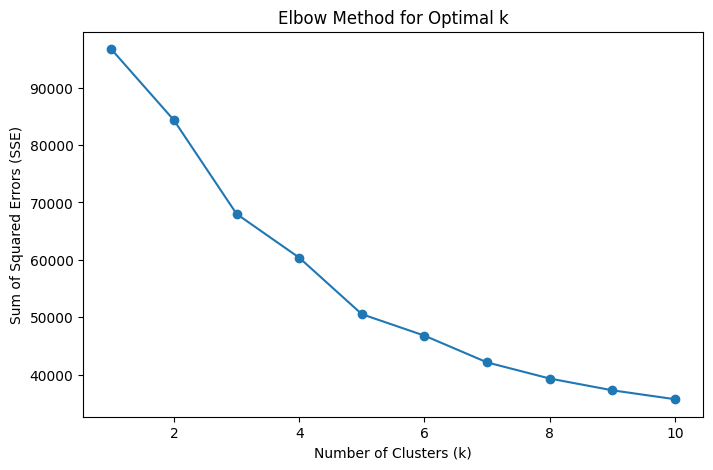

Clustered data saved to clustered_food_data.csv


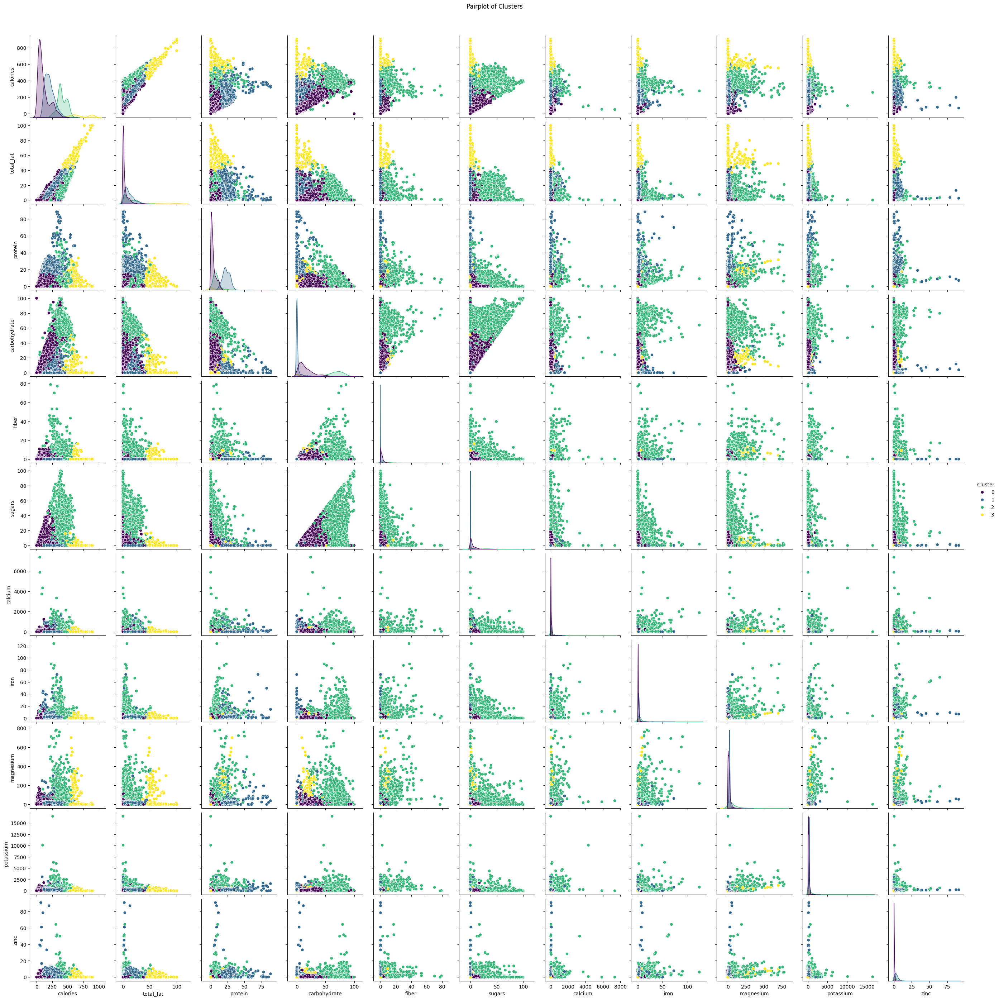

Silhouette Score for k=4: 0.31


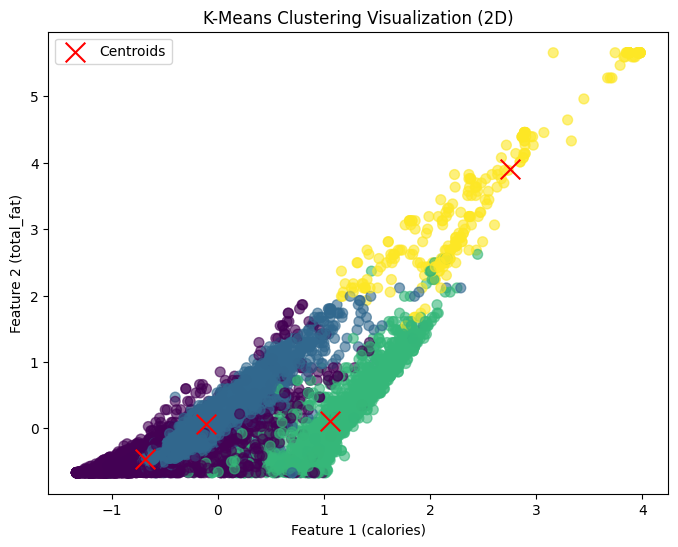

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/essential_features_nutrition_data.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows
print("Original Dataset:")
print(df.head())

# Preprocessing: Remove units and convert columns to numeric
columns_to_clean = ['total_fat', 'protein', 'carbohydrate', 'fiber', 'sugars',
                    'vitamin_a', 'vitamin_b6', 'vitamin_b12', 'vitamin_c',
                    'vitamin_d', 'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                    'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                    'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                    'fatty_acids_total_trans']

def clean_column(column):
    # Remove non-numeric characters (e.g., units like 'g', 'mg', 'mcg', 'IU')
    return pd.to_numeric(df[column].replace(r'[^\d.]+', '', regex=True), errors='coerce')

for column in columns_to_clean:
    df[column] = clean_column(column)

# Convert boolean columns (vegetarian and halal) to numeric
df['vegetarian'] = df['vegetarian'].astype(int)  # True -> 1, False -> 0
df['halal'] = df['halal'].astype(int)

# Handle missing values (drop or impute)
df = df.dropna()  # Drop rows with missing values for simplicity

# Select columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'protein', 'carbohydrate',
                      'fiber', 'sugars', 'calcium', 'iron', 'magnesium',
                      'potassium', 'zinc']  # Select relevant numeric columns
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Determine the optimal number of clusters using the Elbow Method
sse = []  # Sum of Squared Errors
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

# Choose the optimal k based on the elbow and fit the K-Means model
optimal_k = 4  # Update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Add the cluster labels to the original DataFrame
df['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = "clustered_food_data.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# Visualize Clusters (Pairplot)
sns.pairplot(df[columns_to_cluster + ['Cluster']], hue='Cluster', palette='viridis')
plt.suptitle('Pairplot of Clusters', y=1.02)
plt.show()

# Silhouette Score
silhouette_avg = silhouette_score(scaled_data, cluster_labels)
print(f"Silhouette Score for k={optimal_k}: {silhouette_avg:.2f}")

# Visualize the Clusters in 2D (First Two Features)
plt.figure(figsize=(8, 6))
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], c=cluster_labels, cmap='viridis', s=50, alpha=0.6)
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=200, label='Centroids')
plt.title('K-Means Clustering Visualization (2D)')
plt.xlabel(f"Feature 1 ({columns_to_cluster[0]})")
plt.ylabel(f"Feature 2 ({columns_to_cluster[1]})")
plt.legend()
plt.show()


Original Dataset:
   calories total_fat cholesterol  protein carbohydrate  fiber   sugars  \
0       381      0.1g           0   0.26 g      91.27 g  0.9 g   0.00 g   
1       691       72g           0   9.17 g      13.86 g  9.6 g   3.97 g   
2        25      0.2g           0   0.98 g       5.88 g  3.0 g   3.53 g   
3       367      2.4g           0  13.30 g      73.13 g  8.0 g   1.84 g   
4       144        2g         1mg   1.10 g      30.40 g  1.3 g  24.32 g   

  vitamin_a vitamin_b6 vitamin_b12  ...     iron  magnesium  potassium  \
0   0.00 IU   0.000 mg    0.00 mcg  ...  0.47 mg    3.00 mg    3.00 mg   
1  56.00 IU   0.210 mg    0.00 mcg  ...  2.53 mg  121.00 mg  410.00 mg   
2  23.00 IU   0.084 mg    0.00 mcg  ...  0.23 mg   14.00 mg  229.00 mg   
3   9.00 IU   0.482 mg           0  ...  7.63 mg  184.00 mg  427.00 mg   
4  46.00 IU   0.023 mg    0.13 mcg  ...  0.14 mg    8.00 mg   96.00 mg   

      zinc saturated_fatty_acids monounsaturated_fatty_acids  \
0  0.06 mg            

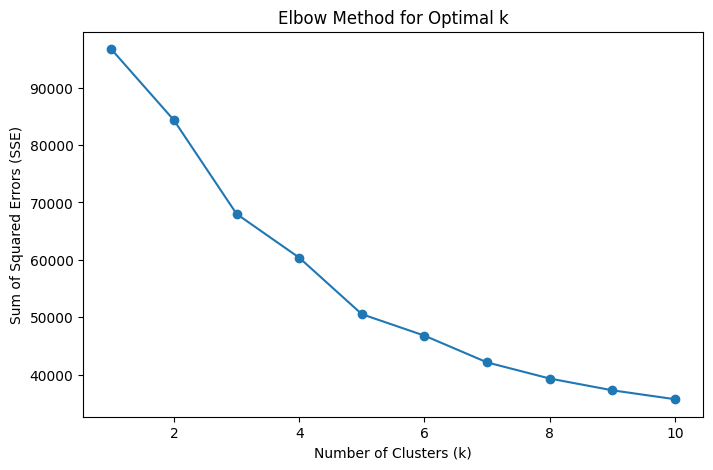

K-Means model saved to kmeans_model.joblib
Scaler saved to scaler.joblib
Clustered data saved to clustered_food_data.csv


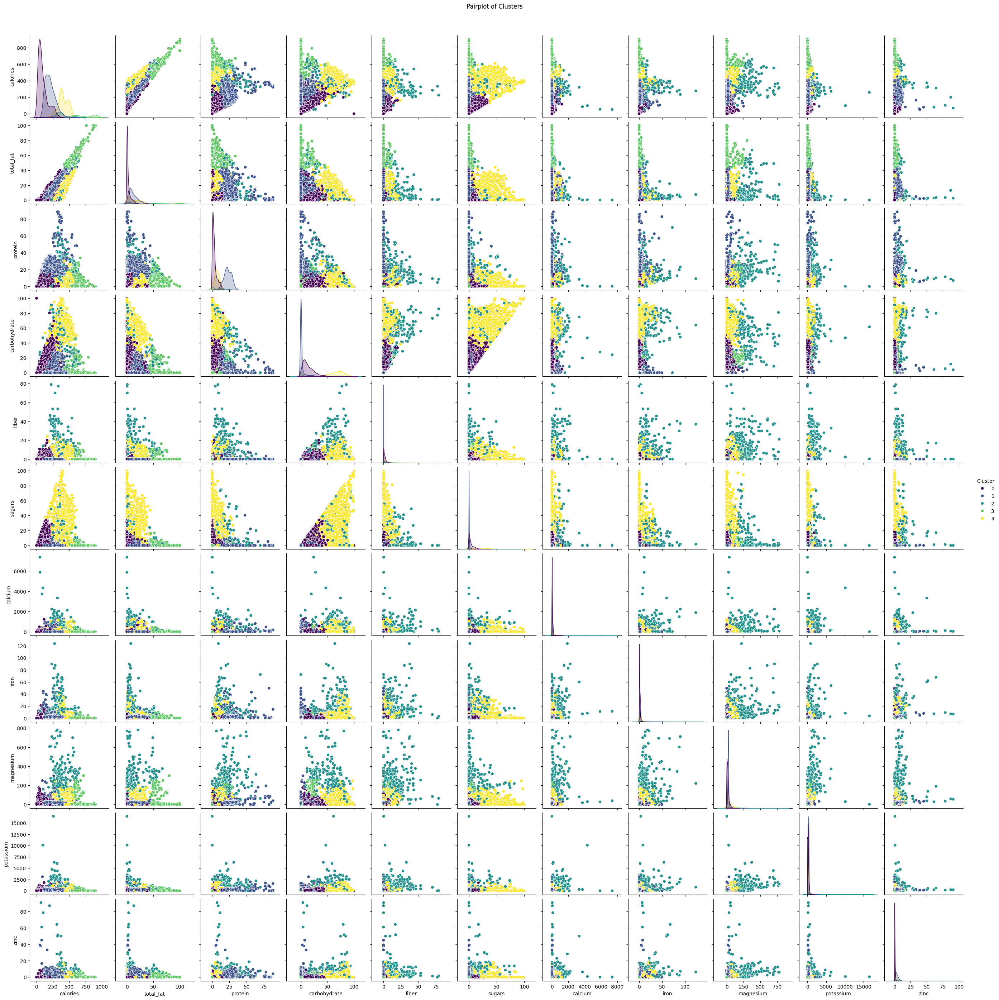

Silhouette Score for k=5: 0.34


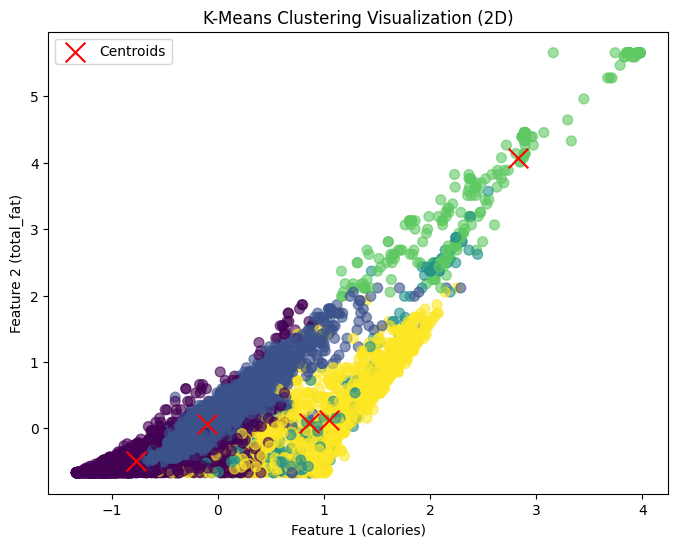

Model and Scaler successfully loaded!
The new data point belongs to cluster: 0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib  # For saving and loading models

# Load dataset
file_path = "/content/essential_features_nutrition_data.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows
print("Original Dataset:")
print(df.head())

# Preprocessing: Remove units and convert columns to numeric
columns_to_clean = ['total_fat', 'protein', 'carbohydrate', 'fiber', 'sugars',
                    'vitamin_a', 'vitamin_b6', 'vitamin_b12', 'vitamin_c',
                    'vitamin_d', 'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                    'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                    'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                    'fatty_acids_total_trans']

def clean_column(column):
    # Remove non-numeric characters (e.g., units like 'g', 'mg', 'mcg', 'IU')
    return pd.to_numeric(df[column].replace(r'[^\d.]+', '', regex=True), errors='coerce')

for column in columns_to_clean:
    df[column] = clean_column(column)

# Convert boolean columns (vegetarian and halal) to numeric
df['vegetarian'] = df['vegetarian'].astype(int)  # True -> 1, False -> 0
df['halal'] = df['halal'].astype(int)

# Handle missing values (drop or impute)
df = df.dropna()  # Drop rows with missing values for simplicity

# Select columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'protein', 'carbohydrate',
                      'fiber', 'sugars', 'calcium', 'iron', 'magnesium',
                      'potassium', 'zinc']  # Select relevant numeric columns
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Determine the optimal number of clusters using the Elbow Method
sse = []  # Sum of Squared Errors
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

# Choose the optimal k based on the elbow and fit the K-Means model
optimal_k = 5  # Update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Save the trained K-Means model to a file
model_file = "kmeans_model.joblib"
joblib.dump(kmeans, model_file)
print(f"K-Means model saved to {model_file}")

# Save the scaler to a file
scaler_file = "scaler.joblib"
joblib.dump(scaler, scaler_file)
print(f"Scaler saved to {scaler_file}")

# Add the cluster labels to the original DataFrame
df['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = "clustered_food_data.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# Visualize Clusters (Pairplot)
sns.pairplot(df[columns_to_cluster + ['Cluster']], hue='Cluster', palette='viridis')
plt.suptitle('Pairplot of Clusters', y=1.02)
plt.show()

# Silhouette Score
silhouette_avg = silhouette_score(scaled_data, cluster_labels)
print(f"Silhouette Score for k={optimal_k}: {silhouette_avg:.2f}")

# Visualize the Clusters in 2D (First Two Features)
plt.figure(figsize=(8, 6))
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], c=cluster_labels, cmap='viridis', s=50, alpha=0.6)
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=200, label='Centroids')
plt.title('K-Means Clustering Visualization (2D)')
plt.xlabel(f"Feature 1 ({columns_to_cluster[0]})")
plt.ylabel(f"Feature 2 ({columns_to_cluster[1]})")
plt.legend()
plt.show()

# Load the saved model and scaler (for demonstration purposes)
loaded_kmeans = joblib.load(model_file)
loaded_scaler = joblib.load(scaler_file)
print("Model and Scaler successfully loaded!")

# Example of using the loaded model for prediction
new_data = [[200, 0.1, 10, 30, 5, 10, 50, 2, 10, 400, 5]]  # Example data
new_data_scaled = loaded_scaler.transform(new_data)
new_cluster = loaded_kmeans.predict(new_data_scaled)
print(f"The new data point belongs to cluster: {new_cluster[0]}")


Original Dataset:
   calories total_fat cholesterol  protein carbohydrate  fiber   sugars  \
0       381      0.1g           0   0.26 g      91.27 g  0.9 g   0.00 g   
1       691       72g           0   9.17 g      13.86 g  9.6 g   3.97 g   
2        25      0.2g           0   0.98 g       5.88 g  3.0 g   3.53 g   
3       367      2.4g           0  13.30 g      73.13 g  8.0 g   1.84 g   
4       144        2g         1mg   1.10 g      30.40 g  1.3 g  24.32 g   

  vitamin_a vitamin_b6 vitamin_b12  ...     iron  magnesium  potassium  \
0   0.00 IU   0.000 mg    0.00 mcg  ...  0.47 mg    3.00 mg    3.00 mg   
1  56.00 IU   0.210 mg    0.00 mcg  ...  2.53 mg  121.00 mg  410.00 mg   
2  23.00 IU   0.084 mg    0.00 mcg  ...  0.23 mg   14.00 mg  229.00 mg   
3   9.00 IU   0.482 mg           0  ...  7.63 mg  184.00 mg  427.00 mg   
4  46.00 IU   0.023 mg    0.13 mcg  ...  0.14 mg    8.00 mg   96.00 mg   

      zinc saturated_fatty_acids monounsaturated_fatty_acids  \
0  0.06 mg            

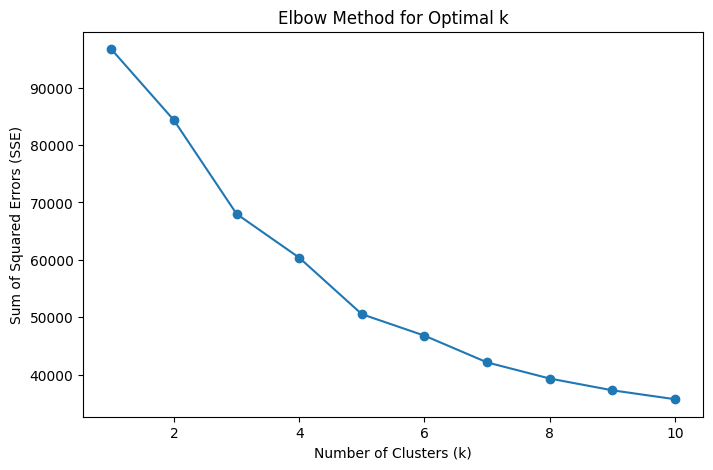

K-Means model saved to kmeans_model.joblib
Scaler saved to scaler.joblib
Clustered data saved to clustered_food_data.csv
Input data belongs to cluster: 0
Recommended Items:
      calories  total_fat cholesterol  protein  carbohydrate  fiber  sugars  \
4199        74        1.0         4mg    12.40          3.20    0.6    2.60   
6722       266        3.3           0     8.85         49.42    2.7    5.67   
3668        71        0.3           0     1.32         17.01    3.6    4.80   
6966        94        0.7           0     3.11         22.33    2.1    0.00   
4195       105        0.2           0     0.87         27.80    3.8    0.00   

      vitamin_a  vitamin_b6  vitamin_b12  ...  magnesium  potassium  zinc  \
4199       40.0       0.070         0.63  ...        5.0       86.0  0.38   
6722        1.0       0.087         0.00  ...       23.0      126.0  0.74   
3668        0.0       0.093         0.00  ...       29.0      367.0  0.26   
6966        4.0       0.224         0.00  ..

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


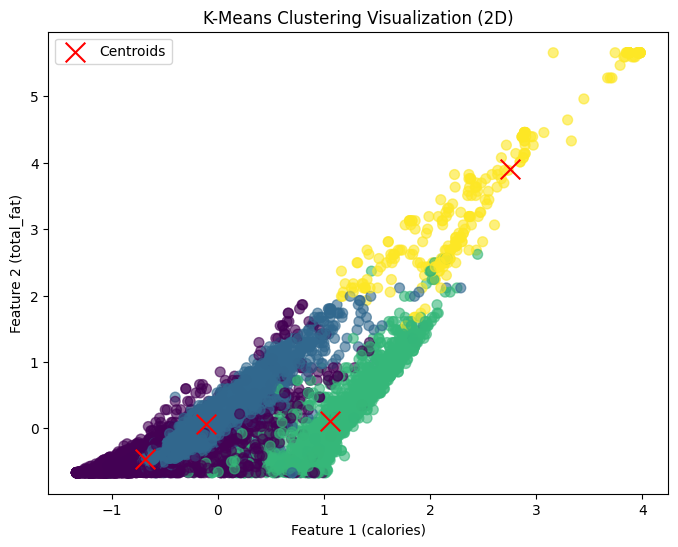

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import joblib  # For saving and loading models
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/essential_features_nutrition_data.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows
print("Original Dataset:")
print(df.head())

# Preprocessing: Remove units and convert columns to numeric
columns_to_clean = ['total_fat', 'protein', 'carbohydrate', 'fiber', 'sugars',
                    'vitamin_a', 'vitamin_b6', 'vitamin_b12', 'vitamin_c',
                    'vitamin_d', 'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                    'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                    'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                    'fatty_acids_total_trans']

def clean_column(column):
    # Remove non-numeric characters (e.g., units like 'g', 'mg', 'mcg', 'IU')
    return pd.to_numeric(df[column].replace(r'[^\d.]+', '', regex=True), errors='coerce')

for column in columns_to_clean:
    df[column] = clean_column(column)

# Convert boolean columns (vegetarian and halal) to numeric
df['vegetarian'] = df['vegetarian'].astype(int)  # True -> 1, False -> 0
df['halal'] = df['halal'].astype(int)

# Handle missing values (drop or impute)
df = df.dropna()  # Drop rows with missing values for simplicity

# Select columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'protein', 'carbohydrate',
                      'fiber', 'sugars', 'calcium', 'iron', 'magnesium',
                      'potassium', 'zinc']  # Select relevant numeric columns
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Determine the optimal number of clusters using the Elbow Method
sse = []  # Sum of Squared Errors
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

# Choose the optimal k based on the elbow and fit the K-Means model
optimal_k = 4  # Update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Save the trained K-Means model and scaler to files
model_file = "kmeans_model.joblib"
scaler_file = "scaler.joblib"
joblib.dump(kmeans, model_file)
joblib.dump(scaler, scaler_file)
print(f"K-Means model saved to {model_file}")
print(f"Scaler saved to {scaler_file}")

# Add the cluster labels to the original DataFrame
df['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = "clustered_food_data.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# Create a recommendation system
def recommend_items(input_data, model, scaler, data_df, cluster_column='Cluster', num_recommendations=3):
    # Scale the input data using the loaded scaler
    input_data_scaled = scaler.transform([input_data])

    # Predict the cluster for the input data
    predicted_cluster = model.predict(input_data_scaled)[0]
    print(f"Input data belongs to cluster: {predicted_cluster}")

    # Find items in the same cluster
    recommendations = data_df[data_df[cluster_column] == predicted_cluster].sample(n=num_recommendations, random_state=42)
    return recommendations

# Test the recommendation system on hardcoded input
test_input = [200, 0.1, 10, 30, 5, 10, 50, 2, 10, 400, 5]  # Example input (calories, total_fat, etc.)
recommendations = recommend_items(
    input_data=test_input,
    model=kmeans,
    scaler=scaler,
    data_df=df,
    num_recommendations=5
)

print("Recommended Items:")
print(recommendations)

# Visualize Clusters in 2D (First Two Features)
plt.figure(figsize=(8, 6))
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], c=cluster_labels, cmap='viridis', s=50, alpha=0.6)
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=200, label='Centroids')
plt.title('K-Means Clustering Visualization (2D)')
plt.xlabel(f"Feature 1 ({columns_to_cluster[0]})")
plt.ylabel(f"Feature 2 ({columns_to_cluster[1]})")
plt.legend()
plt.show()


Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

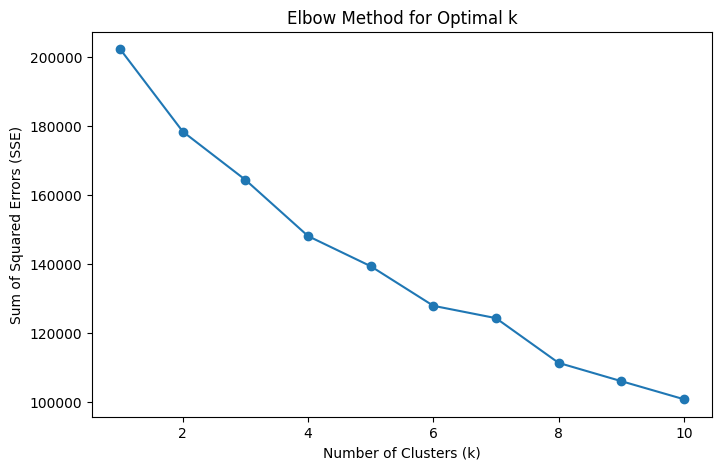

K-Means model saved to kmeans_model.pkl
Scaler saved to scaler.pkl
Clustered data saved to clustered_data.csv


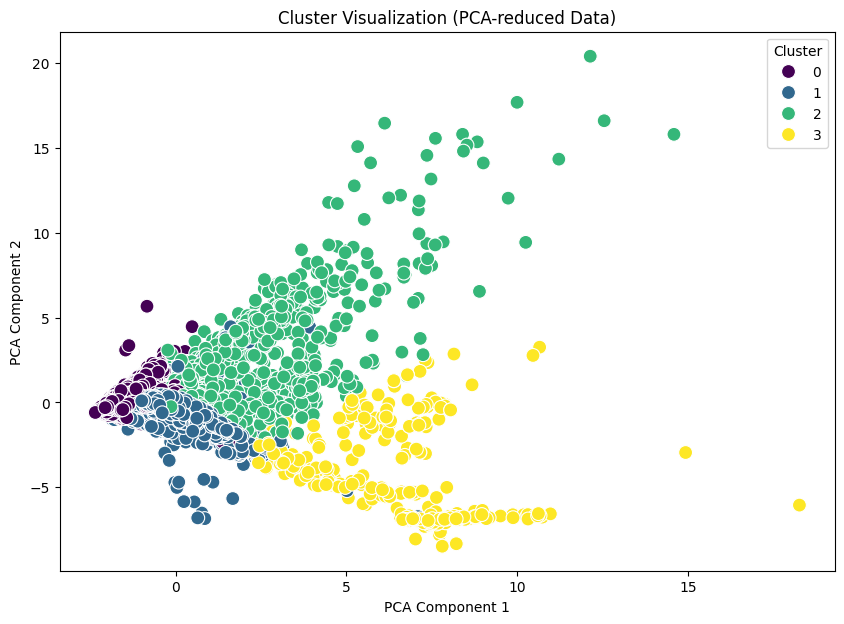

Hardcoded data belongs to cluster: 0

Recommended Items:
      calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
4149 -1.208602  -0.654778    -0.329973 -0.819147     -0.687039  0.154588   
2993  0.027766   0.533790    -0.125460 -1.048966     -0.224536 -0.477888   
4440 -0.584531  -0.648456    -0.329973 -0.991036      0.428689  1.021314   
2398 -0.449119  -0.667423    -0.329973 -1.051815      0.590437 -0.454463   
7511 -1.043753  -0.661100    -0.329973 -1.074607     -0.363544 -0.477888   

        sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      zinc  \
4149 -0.442211   0.250013   -0.139675    -0.281323  ... -0.521573   
2993 -0.186344  -0.183060   -0.558759    -0.267277  ... -0.548554   
4440  1.505580  -0.171692   -0.483922    -0.281323  ... -0.524571   
2398  0.874297  -0.180353   -0.445435    -0.281323  ... -0.554550   
7511  0.375686  -0.183060   -0.558759    -0.281323  ... -0.575536   

      saturated_fatty_acids  monounsaturated_fatty_acids  \
4149       

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pickle  # For saving and loading models
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# Select the clustering data
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Determine the optimal number of clusters using the Elbow Method
sse = []  # Sum of Squared Errors
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

# Choose the optimal k based on the elbow and fit the K-Means model
optimal_k = 4  # Update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Save the trained K-Means model and scaler to `.pkl` files
with open("kmeans_model.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

print(f"K-Means model saved to kmeans_model.pkl")
print(f"Scaler saved to scaler.pkl")

# Add the cluster labels to the original DataFrame
df['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = "clustered_data.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Visualization of Clusters**
# Reduce dimensions to 2D for visualization using PCA
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data)
df['PCA1'] = reduced_data[:, 0]
df['PCA2'] = reduced_data[:, 1]

# Plot the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='PCA1', y='PCA2', hue='Cluster', palette='viridis', s=100)
plt.title('Cluster Visualization (PCA-reduced Data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

# **Prediction on Hardcoded Data**
# Load the saved model and scaler
with open("kmeans_model.pkl", "rb") as model_file:
    loaded_kmeans = pickle.load(model_file)

with open("scaler.pkl", "rb") as scaler_file:
    loaded_scaler = pickle.load(scaler_file)

# Example hardcoded input data (same features as clustering columns)
hardcoded_data = [[0.9108860342376982, -0.6611004235657405, -0.32997285675391497, -1.0527648073521718,
                   2.5361753294679477, -0.2670623894524138, -0.49250904080303715, -0.1830599920087928,
                   -0.5587585229401815, -0.2813225773439214, -0.12734540203157746, -0.11777082401649043,
                   -0.23224923955261173, -0.14963759428088586, -0.35687382638912263, -0.38436147083179334,
                   -0.5240840393952197, -0.7060727313354654, -0.563544408430441, -0.5329954865894522,
                   -0.5503072646164747, -0.4137490228810855, -0.32997285675391497]]  # Example normalized input

# Standardize the input data using the loaded scaler
scaled_input = loaded_scaler.transform(hardcoded_data)

# Predict the cluster for the hardcoded input
predicted_cluster = loaded_kmeans.predict(scaled_input)[0]
print(f"Hardcoded data belongs to cluster: {predicted_cluster}")

# Filter and recommend items from the same cluster
recommendations = df[df['Cluster'] == predicted_cluster].sample(5)  # Randomly sample 5 items
print("\nRecommended Items:")
print(recommendations)


After Handle Outliers

Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

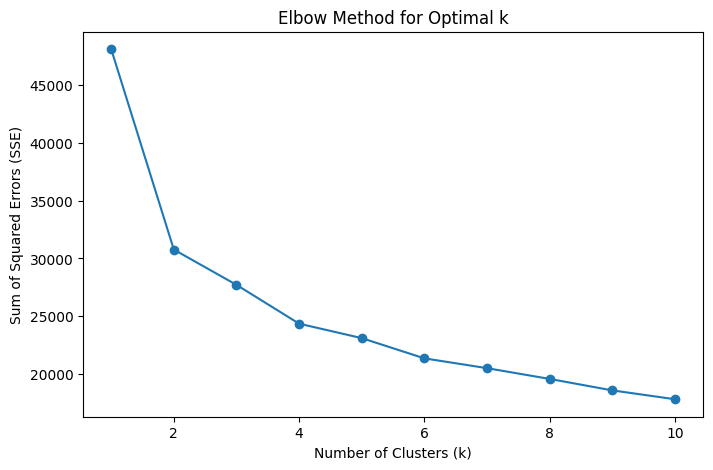

K-Means model saved to kmeans_model.pkl
Scaler saved to scaler.pkl
Clustered data saved to clustered_data_no_outliers.csv


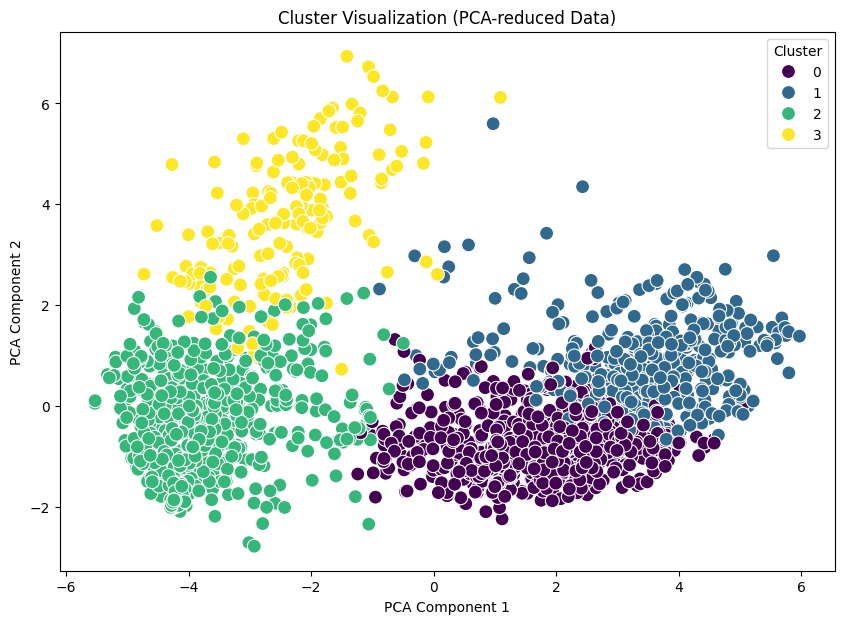

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pickle  # For saving and loading models
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# Handle Outliers Using IQR
def remove_outliers_iqr(data, columns):
    """Removes outliers using the IQR method."""
    for col in columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        data = data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]
    return data

# Remove outliers from clustering columns
df = remove_outliers_iqr(df, columns_to_cluster)

# Select the clustering data
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Determine the optimal number of clusters using the Elbow Method
sse = []  # Sum of Squared Errors
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

# Choose the optimal k based on the elbow and fit the K-Means model
optimal_k = 4  # Update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Save the trained K-Means model and scaler to `.pkl` files
with open("kmeans_model.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

print(f"K-Means model saved to kmeans_model.pkl")
print(f"Scaler saved to scaler.pkl")

# Add the cluster labels to the original DataFrame
df['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = "clustered_data_no_outliers.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Visualization of Clusters**
# Reduce dimensions to 2D for visualization using PCA
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data)
df['PCA1'] = reduced_data[:, 0]
df['PCA2'] = reduced_data[:, 1]

# Plot the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='PCA1', y='PCA2', hue='Cluster', palette='viridis', s=100)
plt.title('Cluster Visualization (PCA-reduced Data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()


In [ ]:
import pickle
import numpy as np

# Load the saved model and scaler
with open("kmeans_model.pkl", "rb") as model_file:
    loaded_kmeans = pickle.load(model_file)

with open("scaler.pkl", "rb") as scaler_file:
    loaded_scaler = pickle.load(scaler_file)

# Example hardcoded input data
# Input: [calories, total_fat, cholesterol, protein, carbohydrate, fiber, sugars, vitamin_a, vitamin_b6, vitamin_b12,
#         vitamin_c, vitamin_d, vitamin_e, vitamin_k, calcium, iron, magnesium, potassium, zinc,
#         saturated_fatty_acids, monounsaturated_fatty_acids, polyunsaturated_fatty_acids, fatty_acids_total_trans]
hardcoded_data = [[200, 0.2, 30, 10, 50, 5, 12, 300, 1.2, 0.4, 25, 0.1, 1.1, 20, 1.5, 0.6, 20, 300, 5, 0.1, 0.2, 0.15, 0.0]]

# Standardize the input data using the loaded scaler
scaled_input = loaded_scaler.transform(hardcoded_data)

# Predict the cluster for the hardcoded input
predicted_cluster = loaded_kmeans.predict(scaled_input)[0]
print(f"Hardcoded data belongs to cluster: {predicted_cluster}")


Hardcoded data belongs to cluster: 2


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pickle
import pandas as pd
import numpy as np

# Load the saved model and scaler
with open("kmeans_model.pkl", "rb") as model_file:
    loaded_kmeans = pickle.load(model_file)

with open("scaler.pkl", "rb") as scaler_file:
    loaded_scaler = pickle.load(scaler_file)

# Load the clustered data
clustered_data_file = "clustered_data_no_outliers.csv"
df = pd.read_csv(clustered_data_file)

# Example hardcoded input data
# Input: [calories, total_fat, cholesterol, protein, carbohydrate, fiber, sugars, vitamin_a, vitamin_b6, vitamin_b12,
#         vitamin_c, vitamin_d, vitamin_e, vitamin_k, calcium, iron, magnesium, potassium, zinc,
#         saturated_fatty_acids, monounsaturated_fatty_acids, polyunsaturated_fatty_acids, fatty_acids_total_trans]
hardcoded_data = [[200, 0.2, 30, 10, 50, 5, 12, 300, 1.2, 0.4, 25, 0.1, 1.1, 20, 1.5, 0.6, 20, 300, 5, 0.1, 0.2, 0.15, 0.0]]

# Standardize the input data using the loaded scaler
scaled_input = loaded_scaler.transform(hardcoded_data)

# Predict the cluster for the hardcoded input
predicted_cluster = loaded_kmeans.predict(scaled_input)[0]
print(f"Hardcoded data belongs to cluster: {predicted_cluster}")

# Recommend foods from the same cluster
recommendations = df[df['Cluster'] == predicted_cluster].sample(5)  # Randomly sample 5 items
print("\nRecommended Foods:")
print(recommendations)


Hardcoded data belongs to cluster: 2

Recommended Foods:
      calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
601  -0.861241  -0.667423    -0.329973 -1.070808     -0.689973 -0.477888   
943   0.404564  -0.667423    -0.329973 -1.077456     -0.811375 -0.477888   
663  -0.831804  -0.667423    -0.329973 -1.070808     -0.713080 -0.477888   
1016 -0.955441  -0.540979    -0.329973 -0.925509     -0.459272  0.084313   
153  -1.332239  -0.667423    -0.329973 -1.077456     -0.811375 -0.477888   

        sugars  vitamin_a  vitamin_b6  vitamin_b12  ...  magnesium  potassium  \
601  -0.492509  -0.183060   -0.558759    -0.281323  ...  -0.577814  -0.714150   
943  -0.492509  -0.183060   -0.556620    -0.281323  ...  -0.577814  -0.708765   
663  -0.492509  -0.183060   -0.558759    -0.281323  ...  -0.577814  -0.714150   
1016  0.032345  -0.074792   -0.558759    -0.281323  ...  -0.577814   0.147403   
153  -0.492509  -0.183060   -0.558759    -0.281323  ...  -0.577814  -0.714150   


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
from IPython.display import display

# Display the input and recommendations interactively
print("\n### Hardcoded Input Data ###")
display(hardcoded_data)

print("\n### Recommended Foods ###")
display(recommendations)



### Hardcoded Input Data ###


[[200,
  0.2,
  30,
  10,
  50,
  5,
  12,
  300,
  1.2,
  0.4,
  25,
  0.1,
  1.1,
  20,
  1.5,
  0.6,
  20,
  300,
  5,
  0.1,
  0.2,
  0.15,
  0.0]]


### Recommended Foods ###


,calories,total_fat,cholesterol,protein,carbohydrate,fiber,sugars,vitamin_a,vitamin_b6,vitamin_b12,...,magnesium,potassium,zinc,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids,fatty_acids_total_trans,vegetarian,halal,Cluster
601,-0.861241,-0.667423,-0.329973,-1.070808,-0.689973,-0.477888,-0.492509,-0.183060,-0.558759,-0.281323,...,-0.577814,-0.714150,-0.581532,-0.534396,-0.552651,-0.4187,-0.329973,1,0,2
943,0.404564,-0.667423,-0.329973,-1.077456,-0.811375,-0.477888,-0.492509,-0.183060,-0.556620,-0.281323,...,-0.577814,-0.708765,-0.569540,-0.534396,-0.552651,-0.4187,-0.329973,1,0,2
663,-0.831804,-0.667423,-0.329973,-1.070808,-0.713080,-0.477888,-0.492509,-0.183060,-0.558759,-0.281323,...,-0.577814,-0.714150,-0.581532,-0.534396,-0.552651,-0.4187,-0.329973,1,0,2
1016,-0.955441,-0.540979,-0.329973,-0.925509,-0.459272,0.084313,0.032345,-0.074792,-0.558759,-0.281323,...,-0.577814,0.147403,-0.581532,-0.534396,-0.552651,-0.4187,-0.329973,1,1,2
153,-1.332239,-0.667423,-0.329973,-1.077456,-0.811375,-0.477888,-0.492509,-0.183060,-0.558759,-0.281323,...,-0.577814,-0.714150,-0.581532,-0.534396,-0.552651,-0.4187,-0.329973,1,1,2


Making More Effiecent

Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

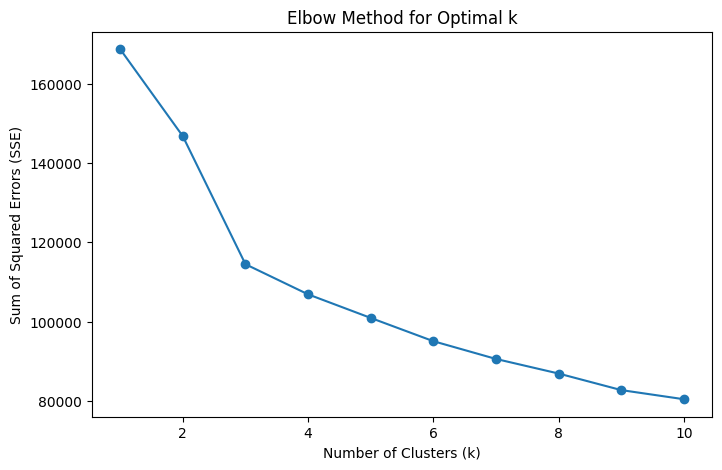

K-Means model saved to kmeans_model.pkl
Scaler saved to scaler.pkl
Clustered data saved to clustered_data_no_outliers_ef.csv


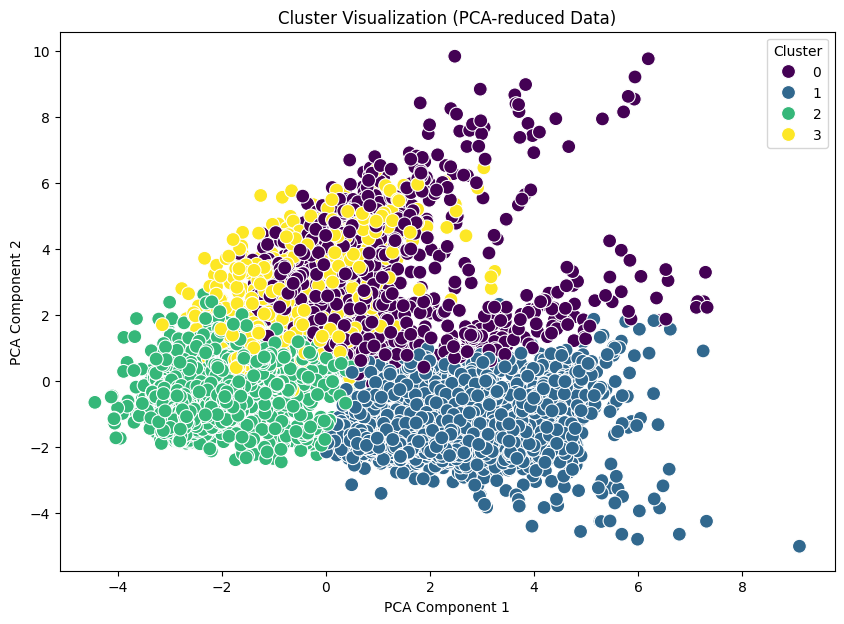

In [ ]:
from scipy.stats import zscore
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# Remove Outliers Using Z-Score
def remove_outliers_zscore(data, columns, threshold=3.0):
    """Removes outliers using the Z-score method."""
    z_scores = np.abs(zscore(data[columns]))
    return data[(z_scores < threshold).all(axis=1)]

# Apply Z-Score method to remove outliers
df = remove_outliers_zscore(df, columns_to_cluster)

# Select the clustering data
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Determine the optimal number of clusters using the Elbow Method
sse = []  # Sum of Squared Errors
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

# Choose the optimal k based on the elbow and fit the K-Means model
optimal_k = 4  # Update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Save the trained K-Means model and scaler to `.pkl` files
with open("kmeans_model_ef.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler_ef.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

print(f"K-Means model saved to kmeans_model.pkl")
print(f"Scaler saved to scaler.pkl")

# Add the cluster labels to the original DataFrame
df['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = "clustered_data_no_outliers_ef.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Visualization of Clusters**
# Reduce dimensions to 2D for visualization using PCA
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data)
df['PCA1'] = reduced_data[:, 0]
df['PCA2'] = reduced_data[:, 1]

# Plot the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='PCA1', y='PCA2', hue='Cluster', palette='viridis', s=100)
plt.title('Cluster Visualization (PCA-reduced Data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()


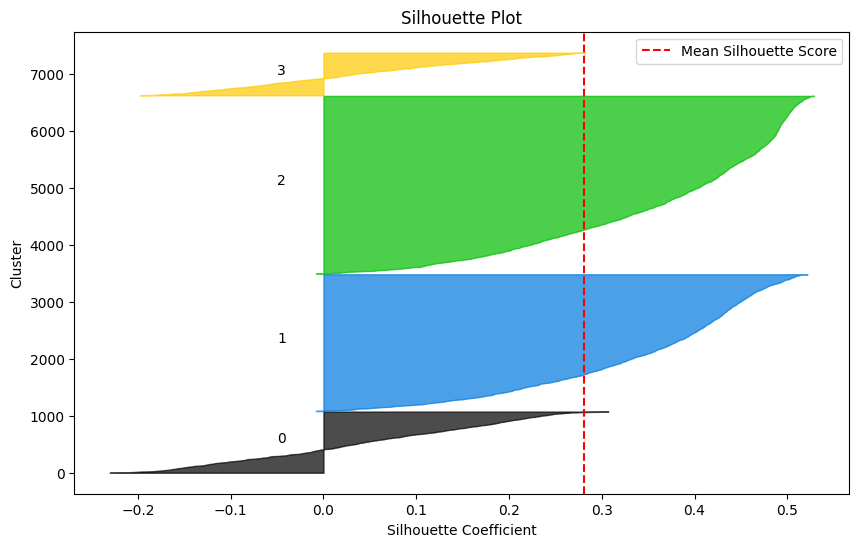

In [ ]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np

def plot_silhouette(data, labels, n_clusters):
    """Plots the silhouette coefficient for each sample."""
    silhouette_vals = silhouette_samples(data, labels)
    y_lower = 10  # For spacing
    fig, ax = plt.subplots(figsize=(10, 6))

    for i in range(n_clusters):
        ith_cluster_silhouette_values = silhouette_vals[labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10  # Add space between clusters

    ax.set_title("Silhouette Plot")
    ax.set_xlabel("Silhouette Coefficient")
    ax.set_ylabel("Cluster")
    plt.axvline(x=silhouette_vals.mean(), color="red", linestyle="--", label="Mean Silhouette Score")
    plt.legend()
    plt.show()

# Plot silhouette values for all clusters
plot_silhouette(scaled_data, cluster_labels, n_clusters=optimal_k)


Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

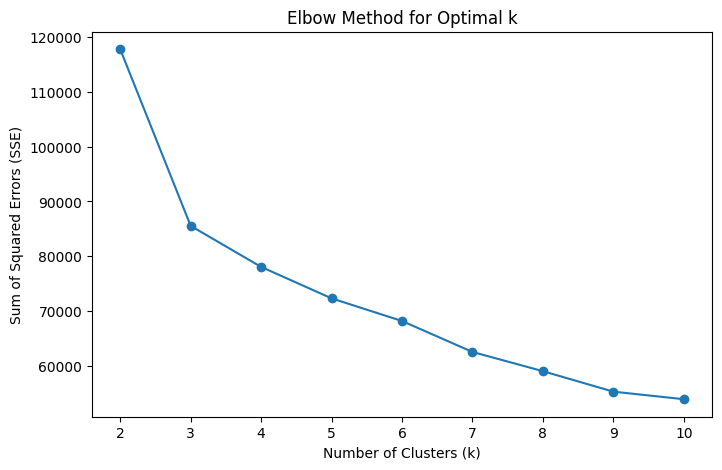

K-Means model saved to kmeans_model.pkl
Scaler saved to scaler.pkl
PCA model saved to pca_model.pkl
Clustered data saved to clustered_data_no_outliers.csv


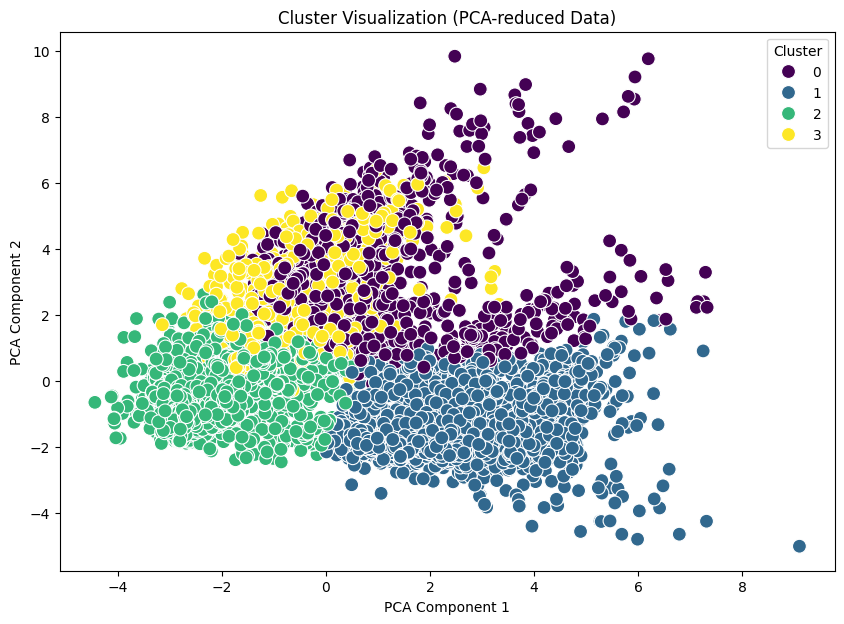


### Predicted Cluster for Hardcoded Data: 3 ###

Recommended Foods:
      calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
1846  0.080753  -0.642134    -0.329973 -0.870429      1.531580  1.185289   
9     0.375127   0.470568    -0.329973  1.106779     -0.481278  0.951039   
137   1.116947  -0.047850    -0.329973 -0.545642      2.009120  0.037463   
4658  0.869674  -0.604201    -0.329973 -0.364256      2.155463 -0.056237   
726   0.392789  -0.395569    -0.329973 -0.137285      1.121526  0.060888   

        sugars  vitamin_a  vitamin_b6  vitamin_b12  ...  magnesium  potassium  \
1846  2.287028   0.028334   -0.120431    -0.281323  ...   0.156497   1.256652   
9    -0.434192  -0.183060    2.648517     0.701901  ...  -0.165883   0.901262   
137   0.959586  -0.182519   -0.349217    -0.281323  ...   0.299778   0.217404   
4658 -0.468453  -0.183060    0.407700    -0.281323  ...  -0.094243  -0.245680   
726  -0.363483  -0.183060   -0.483922    -0.281323  ...  -0.094243  -

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# Remove Outliers Using Z-Score
def remove_outliers_zscore(data, columns, threshold=3.0):
    """Removes outliers using the Z-score method."""
    z_scores = np.abs((data[columns] - data[columns].mean()) / data[columns].std())
    return data[(z_scores < threshold).all(axis=1)]

# Apply Z-Score method to remove outliers
df = remove_outliers_zscore(df, columns_to_cluster)

# Select the clustering data
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Perform PCA for dimensionality reduction
pca = PCA(n_components=10)  # Reduce to 10 dimensions
reduced_data = pca.fit_transform(scaled_data)

# Determine the optimal number of clusters using the Elbow Method
sse = []  # Sum of Squared Errors
k_range = range(2, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(reduced_data)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

# Choose the optimal k based on the elbow and fit the K-Means model
optimal_k = 4  # Update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(reduced_data)

# Save the trained K-Means model and scaler to `.pkl` files
with open("kmeans_model.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

with open("pca_model.pkl", "wb") as pca_file:
    pickle.dump(pca, pca_file)

print(f"K-Means model saved to kmeans_model.pkl")
print(f"Scaler saved to scaler.pkl")
print(f"PCA model saved to pca_model.pkl")

# Add the cluster labels to the original DataFrame
df['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = "clustered_data_no_outliers.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Visualization of Clusters**
# Plot the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=cluster_labels, palette='viridis', s=100)
plt.title('Cluster Visualization (PCA-reduced Data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

# **Prediction on Hardcoded Data with Recommendations**
# Example hardcoded input data
hardcoded_data = [[200, 0.2, 30, 10, 50, 5, 12, 300, 1.2, 0.4, 25, 0.1, 1.1, 20, 1.5, 0.6, 20, 300, 5, 0.1, 0.2, 0.15, 0.0]]

# Load the saved models
with open("kmeans_model.pkl", "rb") as model_file:
    loaded_kmeans = pickle.load(model_file)

with open("scaler.pkl", "rb") as scaler_file:
    loaded_scaler = pickle.load(scaler_file)

with open("pca_model.pkl", "rb") as pca_file:
    loaded_pca = pickle.load(pca_file)

# Preprocess the hardcoded input
scaled_input = loaded_scaler.transform(hardcoded_data)
reduced_input = loaded_pca.transform(scaled_input)

# Predict the cluster for the hardcoded input
predicted_cluster = loaded_kmeans.predict(reduced_input)[0]
print(f"\n### Predicted Cluster for Hardcoded Data: {predicted_cluster} ###")

# Recommend foods from the same cluster
recommendations = df[df['Cluster'] == predicted_cluster].sample(5)  # Randomly sample 5 items
print("\nRecommended Foods:")
print(recommendations)


Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

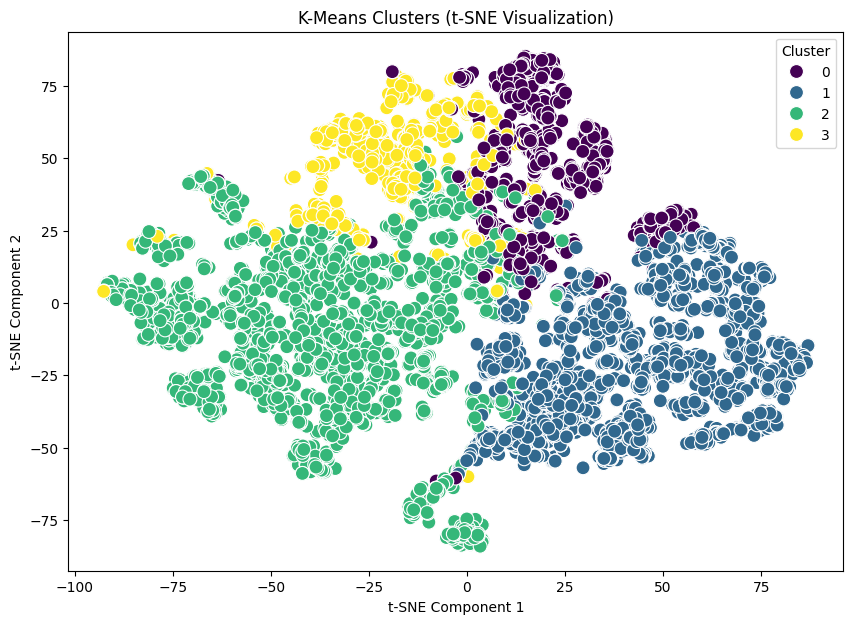

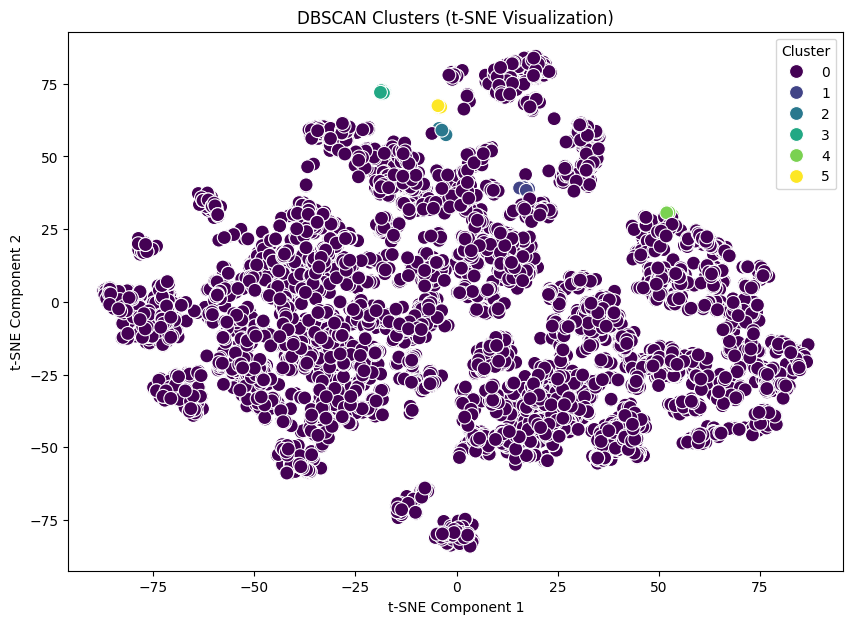


### Predicted Cluster for Hardcoded Data: 3 ###

Recommended Foods:
      calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
2610  0.940323  -0.427180    -0.329973 -0.308226      2.119153  0.459114   
1846  0.080753  -0.642134    -0.329973 -0.870429      1.531580  1.185289   
7433 -0.378469  -0.635812    -0.329973 -0.193316      0.320857  0.787064   
960   0.740149  -0.458791    -0.329973 -0.013829      1.965107  1.653790   
5452  0.899111  -0.262804    -0.329973 -0.289232      1.954838  0.927614   

        sugars  vitamin_a  vitamin_b6  vitamin_b12  ...  \
2610 -0.492509  -0.182248   -0.238031    -0.281323  ...   
1846  2.287028   0.028334   -0.120431    -0.281323  ...   
7433 -0.492509  -0.183060   -0.143951    -0.281323  ...   
960   0.965418  -0.183060    0.039933    -0.253230  ...   
5452  1.786960   0.667387    2.128938    -0.274300  ...   

      saturated_fatty_acids  monounsaturated_fatty_acids  \
2610              -0.444141                    -0.360734   

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# Remove Outliers Using Z-Score
def remove_outliers_zscore(data, columns, threshold=3.0):
    """Removes outliers using the Z-score method."""
    z_scores = np.abs((data[columns] - data[columns].mean()) / data[columns].std())
    return data[(z_scores < threshold).all(axis=1)]

# Apply Z-Score method to remove outliers
df = remove_outliers_zscore(df, columns_to_cluster)

# Select the clustering data
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Perform PCA for dimensionality reduction
pca = PCA(n_components=10)  # Reduce to 10 dimensions
reduced_data = pca.fit_transform(scaled_data)

# **DBSCAN Clustering**
dbscan = DBSCAN(eps=2.0, min_samples=5)  # Adjust `eps` and `min_samples` for your dataset
dbscan_labels = dbscan.fit_predict(reduced_data)

# Evaluate DBSCAN clustering
if len(set(dbscan_labels)) > 1:  # Ensure more than one cluster exists
    silhouette_avg = silhouette_score(reduced_data, dbscan_labels)
    davies_bouldin = davies_bouldin_score(reduced_data, dbscan_labels)
    print(f"DBSCAN Silhouette Score: {silhouette_avg:.2f}")
    print(f"DBSCAN Davies-Bouldin Index: {davies_bouldin:.2f}")
else:
    print("DBSCAN could not form meaningful clusters. Adjust `eps` and `min_samples`.")

# **K-Means Clustering as Comparison**
optimal_k = 4  # Based on your Elbow Method analysis
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_labels = kmeans.fit_predict(reduced_data)

# Evaluate K-Means clustering
kmeans_silhouette_avg = silhouette_score(reduced_data, kmeans_labels)
kmeans_davies_bouldin = davies_bouldin_score(reduced_data, kmeans_labels)
print(f"K-Means Silhouette Score: {kmeans_silhouette_avg:.2f}")
print(f"K-Means Davies-Bouldin Index: {kmeans_davies_bouldin:.2f}")

# Save the K-Means model and scaler for predictions
with open("kmeans_model.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

with open("pca_model.pkl", "wb") as pca_file:
    pickle.dump(pca, pca_file)

print(f"K-Means model saved to kmeans_model.pkl")
print(f"Scaler saved to scaler.pkl")
print(f"PCA model saved to pca_model.pkl")

# Add cluster labels to the original DataFrame for visualization
df['KMeans_Cluster'] = kmeans_labels
df['DBSCAN_Cluster'] = dbscan_labels

# Save the clustered data
output_file = "clustered_data_with_scores.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Visualization with t-SNE**
tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(reduced_data)
df['tSNE1'] = tsne_data[:, 0]
df['tSNE2'] = tsne_data[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='tSNE1', y='tSNE2', hue='KMeans_Cluster', palette='viridis', s=100)
plt.title('K-Means Clusters (t-SNE Visualization)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.show()

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df[df['DBSCAN_Cluster'] != -1], x='tSNE1', y='tSNE2', hue='DBSCAN_Cluster', palette='viridis', s=100)
plt.title('DBSCAN Clusters (t-SNE Visualization)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.show()

# **Prediction and Recommendations**
hardcoded_data = [[200, 0.2, 30, 10, 50, 5, 12, 300, 1.2, 0.4, 25, 0.1, 1.1, 20, 1.5, 0.6, 20, 300, 5, 0.1, 0.2, 0.15, 0.0]]
scaled_input = scaler.transform(hardcoded_data)
reduced_input = pca.transform(scaled_input)
predicted_cluster = kmeans.predict(reduced_input)[0]
print(f"\n### Predicted Cluster for Hardcoded Data: {predicted_cluster} ###")

recommendations = df[df['KMeans_Cluster'] == predicted_cluster].sample(5)
print("\nRecommended Foods:")
print(recommendations)


Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

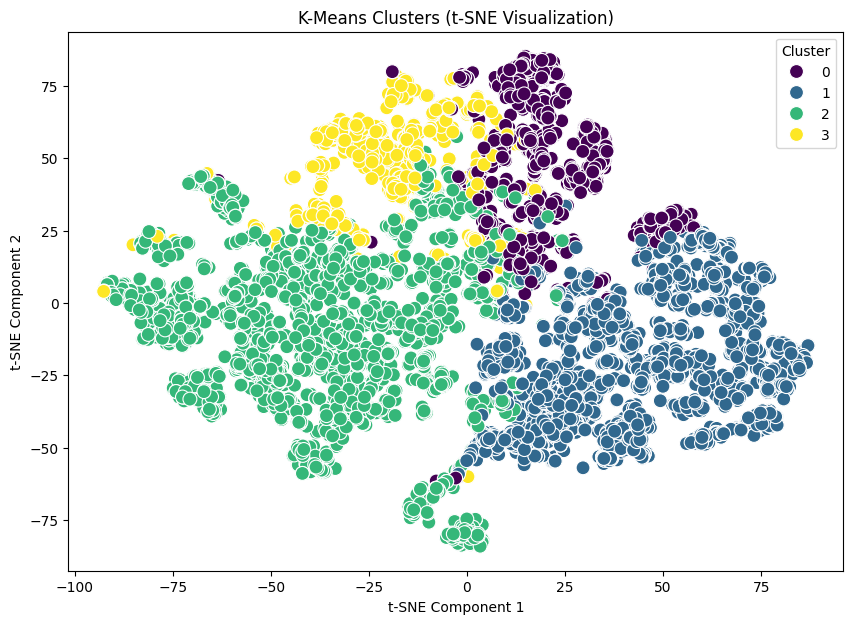

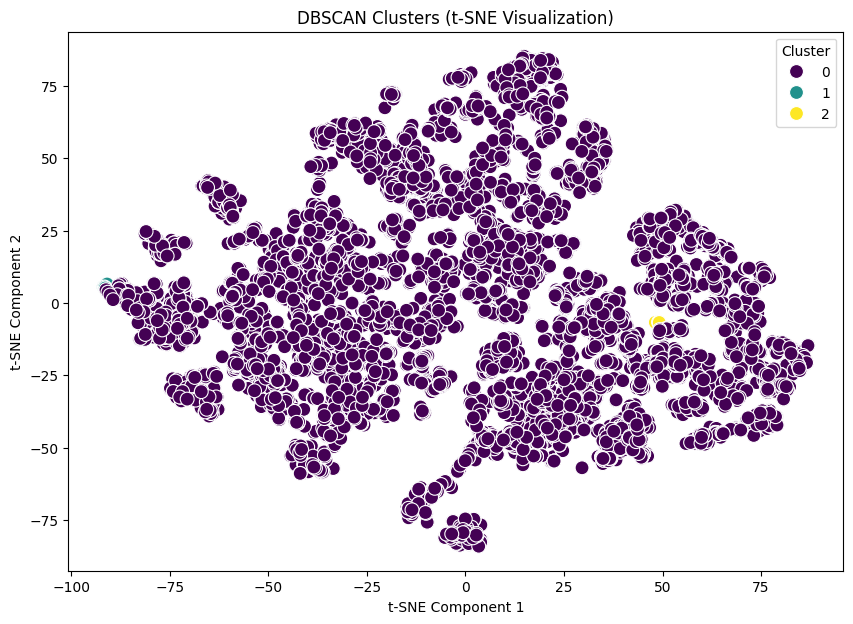


### Predicted Cluster for Hardcoded Data: 3 ###

Recommended Foods:
      calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
405   0.098416  -0.376603    -0.329973 -0.232252      0.784094  0.669939   
520  -0.749380  -0.648456    -0.329973 -0.571283     -0.069391 -0.477888   
2610  0.940323  -0.427180    -0.329973 -0.308226      2.119153  0.459114   
2937  0.257377  -0.357636    -0.329973 -1.076506      0.868452  2.028590   
2466  1.040410   0.028016    -0.329973 -0.186668      1.635744  1.278990   

        sugars  vitamin_a  vitamin_b6  vitamin_b12  ...  \
405  -0.152083  -0.182248    0.014275    -0.281323  ...   
520  -0.492509  -0.183060   -0.002831    -0.281323  ...   
2610 -0.492509  -0.182248   -0.238031    -0.281323  ...   
2937 -0.018683  -0.155993   -0.558759    -0.281323  ...   
2466  1.872977   0.059461    0.749810    -0.009766  ...   

      saturated_fatty_acids  monounsaturated_fatty_acids  \
405               -0.424067                    -0.310337   

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# Remove Outliers Using Z-Score
def remove_outliers_zscore(data, columns, threshold=3.0):
    """Removes outliers using the Z-score method."""
    z_scores = np.abs((data[columns] - data[columns].mean()) / data[columns].std())
    return data[(z_scores < threshold).all(axis=1)]

# Apply Z-Score method to remove outliers
df = remove_outliers_zscore(df, columns_to_cluster)

# Select the clustering data
data_to_cluster = df[columns_to_cluster]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_to_cluster)

# Perform PCA for dimensionality reduction
pca = PCA(n_components=10)  # Reduce to 10 dimensions
reduced_data = pca.fit_transform(scaled_data)

# **Dynamic DBSCAN Tuning**
best_dbscan_labels = None
best_silhouette_score = -1
best_eps = None

for eps in np.arange(1.0, 3.0, 0.5):  # Adjust range and step for eps
    dbscan = DBSCAN(eps=eps, min_samples=5)  # Adjust `min_samples` if needed
    dbscan_labels = dbscan.fit_predict(reduced_data)
    if len(set(dbscan_labels)) > 1:  # Ensure more than one cluster exists
        silhouette_avg = silhouette_score(reduced_data, dbscan_labels)
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_dbscan_labels = dbscan_labels
            best_eps = eps

if best_dbscan_labels is not None:
    print(f"Best DBSCAN Silhouette Score: {best_silhouette_score:.2f} (eps={best_eps})")
else:
    print("DBSCAN could not form meaningful clusters.")

# **K-Means Clustering**
optimal_k = 4  # Based on your Elbow Method analysis
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_labels = kmeans.fit_predict(reduced_data)

# Evaluate K-Means clustering
kmeans_silhouette_avg = silhouette_score(reduced_data, kmeans_labels)
kmeans_davies_bouldin = davies_bouldin_score(reduced_data, kmeans_labels)
kmeans_calinski_harabasz = calinski_harabasz_score(reduced_data, kmeans_labels)
print(f"K-Means Silhouette Score: {kmeans_silhouette_avg:.2f}")
print(f"K-Means Davies-Bouldin Index: {kmeans_davies_bouldin:.2f}")
print(f"K-Means Calinski-Harabasz Score: {kmeans_calinski_harabasz:.2f}")

# Save the K-Means model and scaler for predictions
with open("kmeans_model.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

with open("pca_model.pkl", "wb") as pca_file:
    pickle.dump(pca, pca_file)

print(f"K-Means model saved to kmeans_model.pkl")
print(f"Scaler saved to scaler.pkl")
print(f"PCA model saved to pca_model.pkl")

# Add cluster labels to the original DataFrame for visualization
df['KMeans_Cluster'] = kmeans_labels
if best_dbscan_labels is not None:
    df['DBSCAN_Cluster'] = best_dbscan_labels

# Save the clustered data
output_file = "clustered_data_with_scores.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Visualization with t-SNE**
tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(reduced_data)
df['tSNE1'] = tsne_data[:, 0]
df['tSNE2'] = tsne_data[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='tSNE1', y='tSNE2', hue='KMeans_Cluster', palette='viridis', s=100)
plt.title('K-Means Clusters (t-SNE Visualization)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.show()

if best_dbscan_labels is not None:
    plt.figure(figsize=(10, 7))
    sns.scatterplot(data=df[df['DBSCAN_Cluster'] != -1], x='tSNE1', y='tSNE2', hue='DBSCAN_Cluster', palette='viridis', s=100)
    plt.title('DBSCAN Clusters (t-SNE Visualization)')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.legend(title='Cluster')
    plt.show()

# **Prediction and Recommendations**
hardcoded_data = [[200, 0.2, 30, 10, 50, 5, 12, 300, 1.2, 0.4, 25, 0.1, 1.1, 20, 1.5, 0.6, 20, 300, 5, 0.1, 0.2, 0.15, 0.0]]
scaled_input = scaler.transform(hardcoded_data)
reduced_input = pca.transform(scaled_input)
predicted_cluster = kmeans.predict(reduced_input)[0]
print(f"\n### Predicted Cluster for Hardcoded Data: {predicted_cluster} ###")

recommendations = df[df['KMeans_Cluster'] == predicted_cluster]
if len(recommendations) >= 5:
    recommendations = recommendations.sample(5)
else:
    recommendations = recommendations.sample(len(recommendations))  # Fallback for fewer samples
print("\nRecommended Foods:")
print(recommendations)


Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

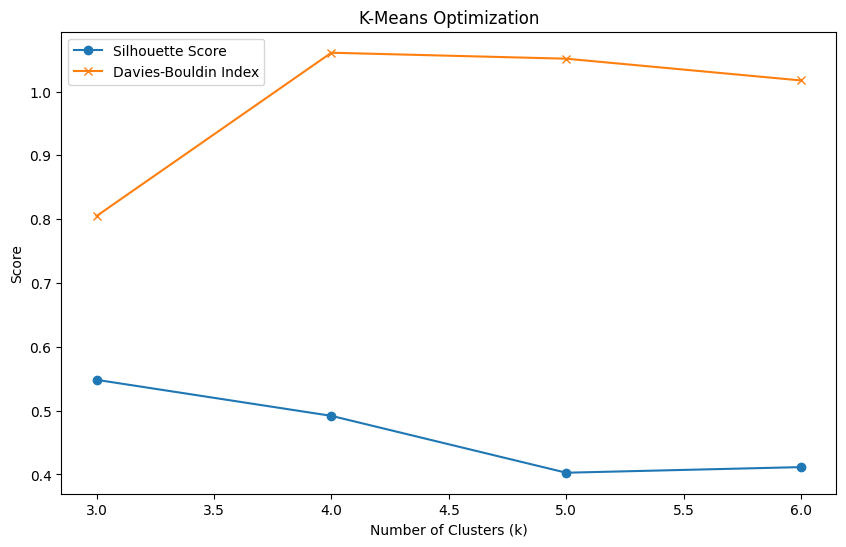

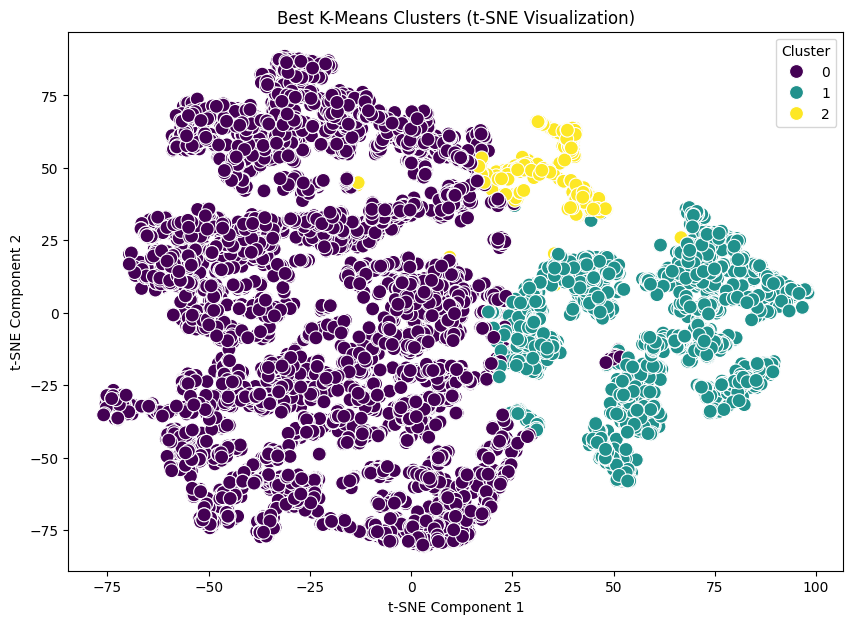


### Predicted Cluster for Hardcoded Data: 2 ###

Recommended Foods:
      calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
8690  2.117817   3.062659     0.641461  0.077339     -0.811375 -0.477888   
1270  2.270891   2.936216    -0.329973  1.287216     -0.369412  0.623089   
3834  2.123704   2.430442    -0.329973  0.590160      0.199822 -0.009387   
3293  3.872282   5.654750    -0.329973 -1.077456     -0.811375 -0.477888   
4656  1.370108   1.798225     1.178306  1.196048     -0.790469 -0.477888   

        sugars  vitamin_a  vitamin_b6  vitamin_b12  ...  \
8690 -0.492509  -0.183060   -0.473231     0.268814  ...   
1270 -0.492509  -0.149497    0.638624    -0.281323  ...   
3834 -0.492509  -0.183060   -0.019936    -0.281323  ...   
3293 -0.492509  -0.183060   -0.558759    -0.281323  ...   
4656 -0.492509  -0.112144    0.243060     0.118990  ...   

      monounsaturated_fatty_acids  polyunsaturated_fatty_acids  \
8690                     3.021997                    

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# **Refined Feature Engineering**
# Add interaction terms for better separation
df['fat_ratio'] = df['saturated_fatty_acids'] / (df['monounsaturated_fatty_acids'] + df['polyunsaturated_fatty_acids'] + 1e-6)
df['fiber_to_carb_ratio'] = df['fiber'] / (df['carbohydrate'] + 1e-6)

# Normalize features using MinMaxScaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df[columns_to_cluster + ['fat_ratio', 'fiber_to_carb_ratio']])

# Perform PCA for dimensionality reduction
pca = PCA(n_components=10)
reduced_data = pca.fit_transform(scaled_data)

# **Optimize K-Means**
best_k = None
best_silhouette = -1
best_kmeans_model = None
best_kmeans_labels = None

silhouette_scores = []
davies_bouldin_scores = []

for k in range(3, 7):  # Testing k=3 to k=6
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans_labels = kmeans.fit_predict(reduced_data)
    silhouette_avg = silhouette_score(reduced_data, kmeans_labels)
    davies_bouldin = davies_bouldin_score(reduced_data, kmeans_labels)

    silhouette_scores.append(silhouette_avg)
    davies_bouldin_scores.append(davies_bouldin)

    if silhouette_avg > best_silhouette:
        best_k = k
        best_silhouette = silhouette_avg
        best_kmeans_model = kmeans
        best_kmeans_labels = kmeans_labels

    print(f"K={k} | Silhouette Score: {silhouette_avg:.2f} | Davies-Bouldin Index: {davies_bouldin:.2f}")

# Save the best K-Means model
with open("best_kmeans_model.pkl", "wb") as model_file:
    pickle.dump(best_kmeans_model, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

with open("pca_model.pkl", "wb") as pca_file:
    pickle.dump(pca, pca_file)

print(f"Best K-Means model saved to best_kmeans_model.pkl")
print(f"Scaler and PCA models saved.")

# Add the best cluster labels to the DataFrame
df['Best_KMeans_Cluster'] = best_kmeans_labels

# Save the clustered data
output_file = "optimized_clustered_data_final.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Visualization of K-Means Optimization**
plt.figure(figsize=(10, 6))
plt.plot(range(3, 7), silhouette_scores, marker='o', label='Silhouette Score')
plt.plot(range(3, 7), davies_bouldin_scores, marker='x', label='Davies-Bouldin Index')
plt.title('K-Means Optimization')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Score')
plt.legend()
plt.show()

# **Visualization with t-SNE**
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(reduced_data)
df['tSNE1'] = tsne_data[:, 0]
df['tSNE2'] = tsne_data[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='tSNE1', y='tSNE2', hue='Best_KMeans_Cluster', palette='viridis', s=100)
plt.title('Best K-Means Clusters (t-SNE Visualization)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.show()

# **Prediction and Recommendations**
hardcoded_data = [[200, 0.2, 30, 10, 50, 5, 12, 300, 1.2, 0.4, 25, 0.1, 1.1, 20, 1.5, 0.6, 20, 300, 5, 0.1, 0.2, 0.15, 0.0, 1, 0]]
scaled_input = scaler.transform(hardcoded_data)
reduced_input = pca.transform(scaled_input)
predicted_cluster = best_kmeans_model.predict(reduced_input)[0]
print(f"\n### Predicted Cluster for Hardcoded Data: {predicted_cluster} ###")

recommendations = df[df['Best_KMeans_Cluster'] == predicted_cluster]
if len(recommendations) >= 5:
    recommendations = recommendations.sample(5)
else:
    recommendations = recommendations.sample(len(recommendations))  # Fallback for fewer samples
print("\nRecommended Foods:")
print(recommendations)


Original Dataset:
   calories  total_fat  cholesterol   protein  carbohydrate     fiber  \
0  0.910886  -0.661100    -0.329973 -1.052765      2.536175 -0.267062   
1  2.736001   3.884542    -0.329973 -0.206611     -0.303026  1.770915   
2 -1.185052  -0.654778    -0.329973 -0.984389     -0.595712  0.224863   
3  0.828461  -0.515690    -0.329973  0.185601      1.870846  1.396115   
4 -0.484444  -0.540979    -0.321452 -0.972993      0.303619 -0.173362   

     sugars  vitamin_a  vitamin_b6  vitamin_b12  ...      iron  magnesium  \
0 -0.492509  -0.183060   -0.558759    -0.281323  ... -0.384361  -0.524084   
1 -0.203111  -0.167902   -0.109740    -0.281323  ... -0.020450   1.589300   
2 -0.235185  -0.176835   -0.379151    -0.281323  ... -0.426759  -0.327074   
3 -0.358380  -0.180624    0.471846    -0.281323  ...  0.880495   2.717632   
4  1.280330  -0.170609   -0.509580    -0.250889  ... -0.442658  -0.434534   

   potassium      zinc  saturated_fatty_acids  monounsaturated_fatty_acids  \
0 

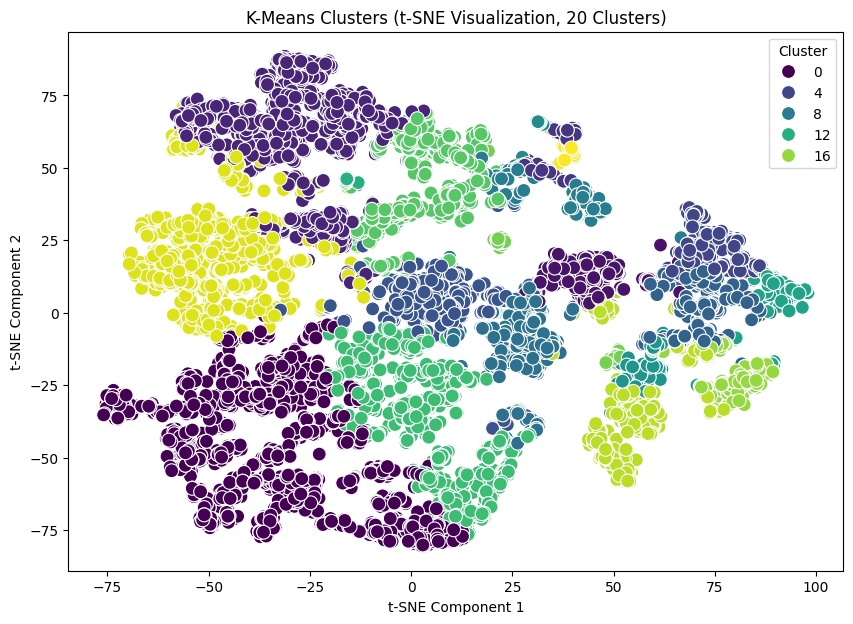

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Original Dataset:")
print(df.head())

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# **Refined Feature Engineering**
# Add interaction terms for better separation
df['fat_ratio'] = df['saturated_fatty_acids'] / (df['monounsaturated_fatty_acids'] + df['polyunsaturated_fatty_acids'] + 1e-6)
df['fiber_to_carb_ratio'] = df['fiber'] / (df['carbohydrate'] + 1e-6)

# Normalize features using MinMaxScaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df[columns_to_cluster + ['fat_ratio', 'fiber_to_carb_ratio']])

# Perform PCA for dimensionality reduction
pca = PCA(n_components=10)
reduced_data = pca.fit_transform(scaled_data)

# **Clustering into 20 Clusters**
kmeans = KMeans(n_clusters=20, random_state=42)
kmeans_labels = kmeans.fit_predict(reduced_data)

# Save the K-Means model
with open("kmeans_20_clusters_model.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

with open("pca_model.pkl", "wb") as pca_file:
    pickle.dump(pca, pca_file)

print(f"K-Means model with 20 clusters saved to kmeans_20_clusters_model.pkl")
print(f"Scaler and PCA models saved.")

# Add the cluster labels to the DataFrame
df['KMeans_Cluster_20'] = kmeans_labels

# Save the clustered data
output_file = "clustered_data_20_clusters.csv"
df.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# **Silhouette and Davies-Bouldin Scores**
silhouette_avg = silhouette_score(reduced_data, kmeans_labels)
davies_bouldin = davies_bouldin_score(reduced_data, kmeans_labels)
print(f"Silhouette Score for 20 Clusters: {silhouette_avg:.2f}")
print(f"Davies-Bouldin Index for 20 Clusters: {davies_bouldin:.2f}")

# **Visualization with t-SNE**
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(reduced_data)
df['tSNE1'] = tsne_data[:, 0]
df['tSNE2'] = tsne_data[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='tSNE1', y='tSNE2', hue='KMeans_Cluster_20', palette='viridis', s=100)
plt.title('K-Means Clusters (t-SNE Visualization, 20 Clusters)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.show()


Original dataset size: 8789, Cleaned dataset size (after outlier removal): 8349


<ipython-input-20-0efc8506c0a2>:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned.loc[:, 'KMeans_Cluster_20'] = kmeans_labels


Clustered data saved to clustered_data_20_clusters_cleaned.csv
Silhouette Score for 20 Clusters: 0.32
Davies-Bouldin Index for 20 Clusters: 1.05


<ipython-input-20-0efc8506c0a2>:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tSNE1'] = tsne_data[:, 0]
<ipython-input-20-0efc8506c0a2>:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tSNE2'] = tsne_data[:, 1]


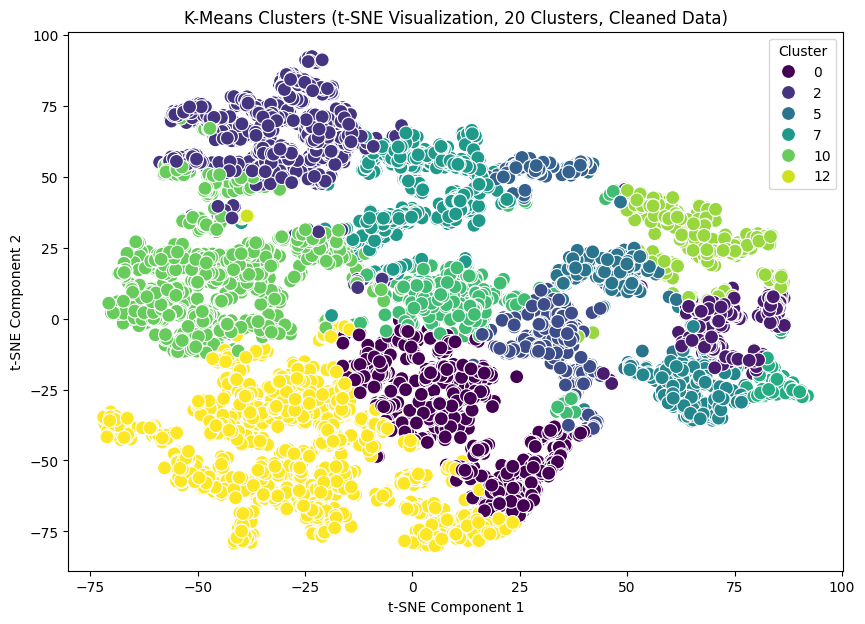

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Load dataset
file_path = "/content/cleaned_and_preprocessed_final_features.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# List of columns for clustering
columns_to_cluster = ['calories', 'total_fat', 'cholesterol', 'protein',
                      'carbohydrate', 'fiber', 'sugars', 'vitamin_a',
                      'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d',
                      'vitamin_e', 'vitamin_k', 'calcium', 'iron',
                      'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
                      'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids',
                      'fatty_acids_total_trans']

# Ensure the vegetarian and halal columns are boolean
boolean_columns = ['vegetarian', 'halal']
for column in boolean_columns:
    df[column] = df[column].astype(int)  # Convert True/False to 1/0 if not already

# Add interaction terms for better separation
df['fat_ratio'] = df['saturated_fatty_acids'] / (df['monounsaturated_fatty_acids'] + df['polyunsaturated_fatty_acids'] + 1e-6)
df['fiber_to_carb_ratio'] = df['fiber'] / (df['carbohydrate'] + 1e-6)

# Normalize features using MinMaxScaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df[columns_to_cluster + ['fat_ratio', 'fiber_to_carb_ratio']])

# Outlier Detection and Removal using Isolation Forest
isolation_forest = IsolationForest(contamination=0.05, random_state=42)
outliers = isolation_forest.fit_predict(scaled_data)
df['Outlier'] = outliers
df_cleaned = df[df['Outlier'] == 1]  # Keep only non-outliers
scaled_data_cleaned = scaled_data[df['Outlier'] == 1]

print(f"Original dataset size: {len(df)}, Cleaned dataset size (after outlier removal): {len(df_cleaned)}")

# Perform PCA for dimensionality reduction
pca = PCA(n_components=10)
reduced_data = pca.fit_transform(scaled_data_cleaned)

# Clustering into 20 clusters
kmeans = KMeans(n_clusters=14, random_state=42)
kmeans_labels = kmeans.fit_predict(reduced_data)

# Add the cluster labels to the cleaned DataFrame
df_cleaned.loc[:, 'KMeans_Cluster_20'] = kmeans_labels

# Save the K-Means model
with open("kmeans_20_clusters_model.pkl", "wb") as model_file:
    pickle.dump(kmeans, model_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

with open("pca_model.pkl", "wb") as pca_file:
    pickle.dump(pca, pca_file)

# Save the clustered data
output_file = "clustered_data_20_clusters_cleaned.csv"
df_cleaned.to_csv(output_file, index=False)
print(f"Clustered data saved to {output_file}")

# Compute evaluation metrics
silhouette_avg = silhouette_score(reduced_data, kmeans_labels)
davies_bouldin = davies_bouldin_score(reduced_data, kmeans_labels)
print(f"Silhouette Score for 20 Clusters: {silhouette_avg:.2f}")
print(f"Davies-Bouldin Index for 20 Clusters: {davies_bouldin:.2f}")

# Visualization with t-SNE
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(reduced_data)
df_cleaned['tSNE1'] = tsne_data[:, 0]
df_cleaned['tSNE2'] = tsne_data[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_cleaned, x='tSNE1', y='tSNE2', hue='KMeans_Cluster_20', palette='viridis', s=100)
plt.title('K-Means Clusters (t-SNE Visualization, 20 Clusters, Cleaned Data)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.show()

# Analyze cluster compositions
cluster_composition = df_cleaned['KMeans_Cluster_20'].value_counts()
print("\nCluster Composition:")
print(cluster_composition)

# Save cluster composition for further analysis
cluster_composition.to_csv("cluster_composition.csv", index=True)



Cluster Composition:
KMeans_Cluster_20
13    1855
10    1230
0     1014
2      957
7      675
11     478
9      460
3      409
6      330
1      330
5      294
4      171
8      135
12      11
Name: count, dtype: int64


<ipython-input-21-598078b35a11>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tSNE1'] = tsne_data[:, 0]
<ipython-input-21-598078b35a11>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tSNE2'] = tsne_data[:, 1]


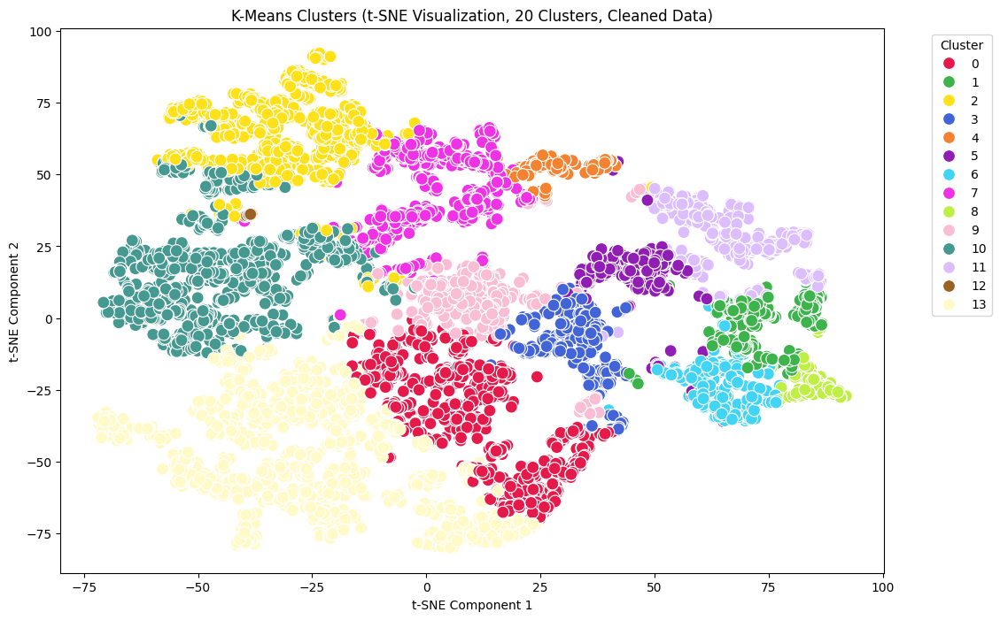

In [ ]:
from matplotlib.colors import ListedColormap
from sklearn.manifold import TSNE

# Define a colormap with 20 distinct colors
colors = ListedColormap([
    '#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6',
    '#bfef45', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8'
])

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(reduced_data)
df_cleaned['tSNE1'] = tsne_data[:, 0]
df_cleaned['tSNE2'] = tsne_data[:, 1]

# Plot t-SNE with distinct colors for each cluster
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df_cleaned, x='tSNE1', y='tSNE2',
    hue='KMeans_Cluster_20', palette=colors, s=100, legend='full'
)
plt.title('K-Means Clusters (t-SNE Visualization, 20 Clusters, Cleaned Data)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import xgboost as xgb

# Load dataset
file_path = "/content/Synthetic_User_Dataset__15000_Users_.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
            'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Encode categorical features
label_encoders = {}
for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[['Height (ft)', 'Weight (kg)']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)']])

# Define features and labels
X = df[features].values
y = df['Target_Cluster'].values

# One-hot encode target labels for Neural Network
y_nn = to_categorical(y)

# Relabel the target for XGBoost (contiguous labels starting from 0)
label_mapping = {val: idx for idx, val in enumerate(sorted(np.unique(y)))}
y_xgb = np.array([label_mapping[label] for label in y])

# Split data into training and testing sets
X_train, X_test, y_train_nn, y_test_nn = train_test_split(X, y_nn, test_size=0.2, random_state=42)
_, _, y_train_xgb, y_test_xgb = train_test_split(X, y_xgb, test_size=0.2, random_state=42)

# Build Neural Network Model
model = Sequential([
    Dense(128, activation='relu', kernel_regularizer='l2', input_shape=(X_train.shape[1],)),
    Dropout(0.3),
    Dense(64, activation='relu', kernel_regularizer='l2'),
    Dropout(0.3),
    Dense(y_train_nn.shape[1], activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the Neural Network
history = model.fit(
    X_train, y_train_nn, validation_split=0.2,
    epochs=500, batch_size=16, verbose=1, callbacks=[early_stop]
)

# Evaluate the NN model on the test dataset
test_loss, test_accuracy = model.evaluate(X_test, y_test_nn, verbose=0)
print(f"Neural Network Test Accuracy: {test_accuracy:.2f}")

# Generate predictions on the test dataset
y_pred_nn = model.predict(X_test)
y_pred_classes_nn = np.argmax(y_pred_nn, axis=1)
y_test_classes_nn = np.argmax(y_test_nn, axis=1)

# Classification report for Neural Network
print("\nNeural Network Classification Report:")
print(classification_report(y_test_classes_nn, y_pred_classes_nn, zero_division=1))

# Plot validation accuracy and loss
plt.figure(figsize=(12, 5))

# Validation Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('NN Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Validation Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('NN Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Save the Neural Network model in the recommended format
model.save("nn_model_classification.keras")
print("Neural Network model saved as nn_model_classification.keras")

# XGBoost Model for Classification
xgb_model = xgb.XGBClassifier(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    objective='multi:softmax',
    num_class=len(label_mapping),
    random_state=42
)

# Train XGBoost model
xgb_model.fit(X_train, y_train_xgb)

# Evaluate XGBoost model
xgb_pred = xgb_model.predict(X_test)
print("\nXGBoost Classification Report:")
print(classification_report(y_test_xgb, xgb_pred, zero_division=1))
xgb_accuracy = accuracy_score(y_test_xgb, xgb_pred)
print(f"XGBoost Test Accuracy: {xgb_accuracy:.2f}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/Synthetic_User_Dataset__15000_Users_.csv'

In [ ]:
# Example: Predict for a new user
new_user_data = {
    'Height (ft)': 4.6,
    'Weight (kg)': 90,
    'Gender': 'Female',
    'Occupation': 'Teacher',
    'Religion': 'Non-Muslim',
    'Exercise Level': '6 days a week',
    'Sleep Hours': '6-7 hours',
    'Medical History': 'Diabetes Problem',
}

predict_user_input_nn(new_user_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
Predicted Cluster for the user: 8


8

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


304/304 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step - accuracy: 0.2257 - loss: 2.1107 - val_accuracy: 0.2461 - val_loss: 1.4434
Epoch 2/500
304/304 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2504 - loss: 1.5166 - val_accuracy: 0.2539 - val_loss: 1.4057
Epoch 3/500
304/304 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2526 - loss: 1.4498 - val_accuracy: 0.2407 - val_loss: 1.4044
Epoch 4/500
304/304 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2628 - loss: 1.4186 - val_accuracy: 0.2235 - val_loss: 1.3977
Epoch 5/500
304/304 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2557 - loss: 1.4121 - val_accuracy: 0.2428 - val_loss: 1.3943
Epoch 6/500
304/304 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2533 - loss: 1.4047 - val_accuracy: 0.2374 - val_loss: 1.3935
Epoch 7/500
304/304 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2684 - loss: 1.3972 - val_accuracy: 0.2510 - val_loss: 1.3969
Epoch 8/500
304/304 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2564 - loss: 1.3983 - val_accuracy: 0.25

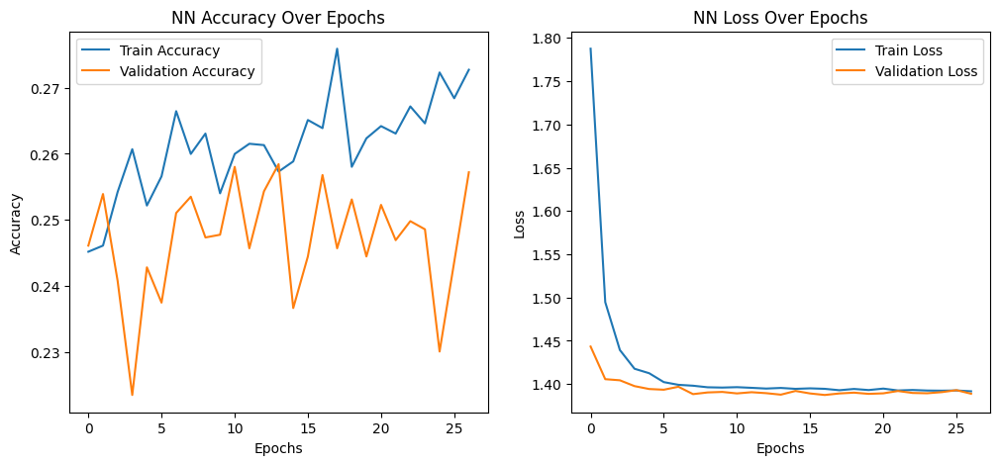

Neural Network model saved as nn_model_70_accuracy.keras


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load dataset
file_path = "/content/Synthetic_User_Dataset__15000_Users_.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
            'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Add derived features
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI
features.append('BMI')

# Encode categorical features
label_encoders = {}
for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[['Height (ft)', 'Weight (kg)', 'BMI']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)', 'BMI']])

# Define features and labels
X = df[features].values
y = df['Target_Cluster'].values

# One-hot encode target labels for Neural Network
y_nn = to_categorical(y)

# Balance the dataset using SMOTE (for XGBoost and NN training)
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

# Recreate one-hot encoding for the balanced dataset
y_balanced_nn = to_categorical(y_balanced)

# Split data into training and testing sets
X_train, X_test, y_train_nn, y_test_nn = train_test_split(X_balanced, y_balanced_nn, test_size=0.2, random_state=42)
_, _, y_train_xgb, y_test_xgb = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)

# Class weights for the original dataset
class_weights = compute_class_weight('balanced', classes=np.unique(y), y=y)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Build Neural Network Model
model = Sequential([
    Dense(256, activation='relu', input_shape=(X_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.4),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(y_train_nn.shape[1], activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the Neural Network
history = model.fit(
    X_train, y_train_nn, validation_split=0.2,
    epochs=500, batch_size=32, verbose=1, callbacks=[early_stop], class_weight=class_weight_dict
)

# Evaluate the NN model on the test dataset
test_loss, test_accuracy = model.evaluate(X_test, y_test_nn, verbose=0)
print(f"Neural Network Test Accuracy: {test_accuracy:.2f}")

# Generate predictions on the test dataset
y_pred_nn = model.predict(X_test)
y_pred_classes_nn = np.argmax(y_pred_nn, axis=1)
y_test_classes_nn = np.argmax(y_test_nn, axis=1)

# Classification report for Neural Network
print("\nNeural Network Classification Report:")
print(classification_report(y_test_classes_nn, y_pred_classes_nn, zero_division=1))

# Plot validation accuracy and loss
plt.figure(figsize=(12, 5))

# Validation Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('NN Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Validation Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('NN Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Save the Neural Network model in the recommended format
model.save("nn_model_70_accuracy.keras")
print("Neural Network model saved as nn_model_70_accuracy.keras")


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import StackingClassifier
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, Activation
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load dataset
file_path = "/content/Synthetic_User_Dataset__4000_Users_.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
            'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Add derived features
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI
features.append('BMI')

# Encode categorical features
label_encoders = {}
for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[['Height (ft)', 'Weight (kg)', 'BMI']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)', 'BMI']])

# Define features and labels
X = df[features].values
y = df['Target_Cluster'].values

# One-hot encode target labels for Neural Network
y_nn = pd.get_dummies(y).values

# Balance the dataset using SMOTE (for XGBoost and NN training)
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

# Recreate one-hot encoding for the balanced dataset
y_balanced_nn = pd.get_dummies(y_balanced).values

# Split data into training and testing sets
X_train, X_test, y_train_nn, y_test_nn = train_test_split(X_balanced, y_balanced_nn, test_size=0.2, random_state=42)
_, _, y_train_xgb, y_test_xgb = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)

# Class weights for the original dataset
class_weights = compute_class_weight('balanced', classes=np.unique(y_balanced), y=y_balanced)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Build Improved Neural Network Model
input_layer = Input(shape=(X_train.shape[1],))
x = Dense(256, activation='relu')(input_layer)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)
residual = Dense(128, activation='relu')(x)
x = Dense(128)(residual)  # Residual connection
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Dropout(0.3)(x)
x = Dense(64, activation='relu')(x)
output_layer = Dense(y_train_nn.shape[1], activation='softmax')(x)

model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the Neural Network
history = model.fit(
    X_train, y_train_nn, validation_split=0.2,
    epochs=500, batch_size=32, verbose=1, callbacks=[early_stop], class_weight=class_weight_dict
)

# Evaluate the NN model on the test dataset
test_loss, test_accuracy = model.evaluate(X_test, y_test_nn, verbose=0)
print(f"Neural Network Test Accuracy: {test_accuracy:.2f}")

# XGBoost Model for Classification
xgb_model = xgb.XGBClassifier(
    n_estimators=200,
    max_depth=8,
    learning_rate=0.05,
    objective='multi:softmax',
    num_class=len(np.unique(y_balanced)),
    random_state=42
)

# Train XGBoost model
xgb_model.fit(X_train, y_train_xgb)

# Evaluate XGBoost model
xgb_pred = xgb_model.predict(X_test)
xgb_accuracy = accuracy_score(y_test_xgb, xgb_pred)
print(f"XGBoost Test Accuracy: {xgb_accuracy:.2f}")

# Combine Neural Network and XGBoost Predictions
stacked_model = StackingClassifier(
    estimators=[('xgb', xgb_model), ('nn', make_pipeline(StandardScaler(), LogisticRegression()))],
    final_estimator=LogisticRegression(),
    cv=5
)

stacked_model.fit(X_train, y_train_xgb)
stacked_pred = stacked_model.predict(X_test)
stacked_accuracy = accuracy_score(y_test_xgb, stacked_pred)
print(f"Stacked Model Test Accuracy: {stacked_accuracy:.2f}")

# Plot validation accuracy and loss
plt.figure(figsize=(12, 5))

# Validation Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('NN Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Validation Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('NN Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


Epoch 1/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 18s 108ms/step - accuracy: 0.2485 - loss: 1.5322 - val_accuracy: 0.2336 - val_loss: 1.3896
Epoch 2/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2812 - loss: 1.4052 - val_accuracy: 0.2708 - val_loss: 1.3852
Epoch 3/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2782 - loss: 1.3976 - val_accuracy: 0.2560 - val_loss: 1.3930
Epoch 4/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2619 - loss: 1.4031 - val_accuracy: 0.2321 - val_loss: 1.3948
Epoch 5/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3015 - loss: 1.3762 - val_accuracy: 0.2411 - val_loss: 1.3953
Epoch 6/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2821 - loss: 1.3889 - val_accuracy: 0.2530 - val_loss: 1.3966
Epoch 7/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3135 - loss: 1.3792 - val_accuracy: 0.2768 - val_loss: 1.3924
Epoch 8/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2843 - loss: 1.3762 - val_accuracy: 0.2589 

ValueError: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2 3], got [ 1  6  8 11]

In [ ]:
def predict_user_input_nn(user_data):
    # Preprocess user data
    user_df = pd.DataFrame([user_data])

    # Compute the BMI for the user
    user_df['Height (m)'] = user_df['Height (ft)'] * 0.3048  # Convert height to meters
    user_df['BMI'] = user_df['Weight (kg)'] / (user_df['Height (m)'] ** 2)  # Calculate BMI

    # Encode categorical columns
    for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
        user_df[col] = label_encoders[col].transform(user_df[col])

    # Scale numerical columns
    user_df[['Height (ft)', 'Weight (kg)', 'BMI']] = scaler.transform(user_df[['Height (ft)', 'Weight (kg)', 'BMI']])

    # Ensure the DataFrame matches the feature set used during training
    user_features = user_df[features]

    # Predict using the NN model
    prediction = model.predict(user_features.values)
    predicted_cluster = np.argmax(prediction, axis=1)[0]
    print(f"Predicted Cluster (NN): {predicted_cluster}")
    return predicted_cluster

# Example: Predict for a new user
new_user_data = {
    'Height (ft)': 4.6,
    'Weight (kg)': 90,
    'Gender': 'Female',
    'Occupation': 'Teacher',
    'Religion': 'Non-Muslim',
    'Exercise Level': '6 days a week',
    'Sleep Hours': '6-7 hours',
    'Medical History': 'Diabetes Problem',
}

predict_user_input_nn(new_user_data)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step
Predicted Cluster (NN): 3


3

Random Forest Test Accuracy: 0.31

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.29      0.35      0.32       188
           1       0.32      0.31      0.31       222
           2       0.29      0.27      0.28       199
           3       0.33      0.30      0.31       231

    accuracy                           0.31       840
   macro avg       0.31      0.31      0.31       840
weighted avg       0.31      0.31      0.31       840


XGBoost Test Accuracy: 0.27

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.25      0.29      0.27       188
           1       0.29      0.28      0.29       222
           2       0.21      0.20      0.20       199
           3       0.29      0.29      0.29       231

    accuracy                           0.27       840
   macro avg       0.26      0.26      0.26       840
weighted avg       0.27      0.27      0.26       84

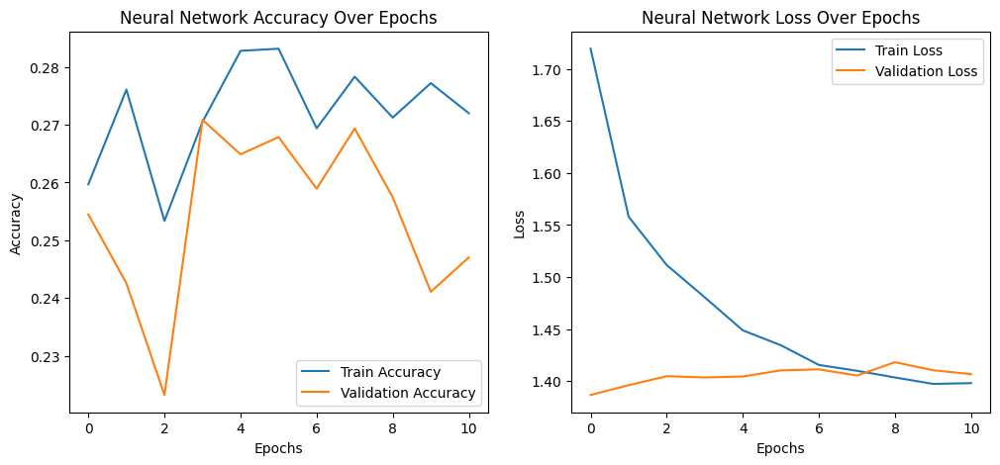

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, Activation
from tensorflow.keras.callbacks import EarlyStopping
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load dataset
file_path = "/content/Synthetic_User_Dataset__4000_Users_.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
            'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Add derived features
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI
features.append('BMI')

# Encode categorical features
label_encoders = {}
for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[['Height (ft)', 'Weight (kg)', 'BMI']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)', 'BMI']])

# Define features and labels
X = df[features].values
y = df['Target_Cluster'].values

# Balance the dataset using SMOTE
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

# Map target labels to sequential integers for XGBoost and Random Forest
unique_labels = sorted(np.unique(y_balanced))  # Get sorted unique labels
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}  # Create mapping
reverse_mapping = {idx: label for label, idx in label_mapping.items()}  # Reverse mapping for predictions
y_balanced_mapped = np.array([label_mapping[label] for label in y_balanced])  # Apply mapping

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced_mapped, test_size=0.2, random_state=42)

# Class weights for the dataset
class_weights = compute_class_weight('balanced', classes=np.unique(y_balanced_mapped), y=y_balanced_mapped)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=200, max_depth=12, random_state=42, class_weight="balanced")
rf_model.fit(X_train, y_train)

# Evaluate Random Forest model
rf_pred = rf_model.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_pred)
print(f"Random Forest Test Accuracy: {rf_accuracy:.2f}")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, rf_pred, zero_division=1))

# XGBoost Classifier
xgb_model = xgb.XGBClassifier(
    n_estimators=200,
    max_depth=8,
    learning_rate=0.05,
    objective='multi:softmax',
    num_class=len(unique_labels),
    random_state=42
)

# Train XGBoost model
xgb_model.fit(X_train, y_train)

# Evaluate XGBoost model
xgb_pred = xgb_model.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_pred)
print(f"\nXGBoost Test Accuracy: {xgb_accuracy:.2f}")
print("\nXGBoost Classification Report:")
print(classification_report(y_test, xgb_pred, zero_division=1))

# Build Neural Network Model
input_layer = Input(shape=(X_train.shape[1],))
x = Dense(256, activation='relu')(input_layer)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.2)(x)
output_layer = Dense(len(unique_labels), activation='softmax')(x)

model = Model(inputs=input_layer, outputs=output_layer)

# Compile the Neural Network
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the Neural Network
history = model.fit(
    X_train, y_train, validation_split=0.2,
    epochs=500, batch_size=32, verbose=1, callbacks=[early_stop], class_weight=class_weight_dict
)

# Evaluate Neural Network model
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"\nNeural Network Test Accuracy: {test_accuracy:.2f}")

# Generate predictions for Neural Network
y_pred_nn = np.argmax(model.predict(X_test), axis=1)
print("\nNeural Network Classification Report:")
print(classification_report(y_test, y_pred_nn, zero_division=1))

# Plot validation accuracy and loss
plt.figure(figsize=(12, 5))

# Validation Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Neural Network Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Validation Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Neural Network Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
Predicted Cluster (NN): 3


3

Random Forest Test Accuracy: 0.31

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.28      0.31      0.29       188
           1       0.36      0.31      0.33       222
           2       0.25      0.25      0.25       199
           3       0.36      0.37      0.36       231

    accuracy                           0.31       840
   macro avg       0.31      0.31      0.31       840
weighted avg       0.31      0.31      0.31       840


XGBoost Test Accuracy: 0.29

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.27      0.30      0.28       188
           1       0.33      0.28      0.31       222
           2       0.25      0.28      0.26       199
           3       0.33      0.30      0.32       231

    accuracy                           0.29       840
   macro avg       0.29      0.29      0.29       840
weighted avg       0.30      0.29      0.29       84

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



AdaBoost Test Accuracy: 0.27

AdaBoost Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.30      0.27       188
           1       0.26      0.15      0.19       222
           2       0.27      0.35      0.30       199
           3       0.32      0.30      0.31       231

    accuracy                           0.27       840
   macro avg       0.27      0.27      0.27       840
weighted avg       0.27      0.27      0.27       840



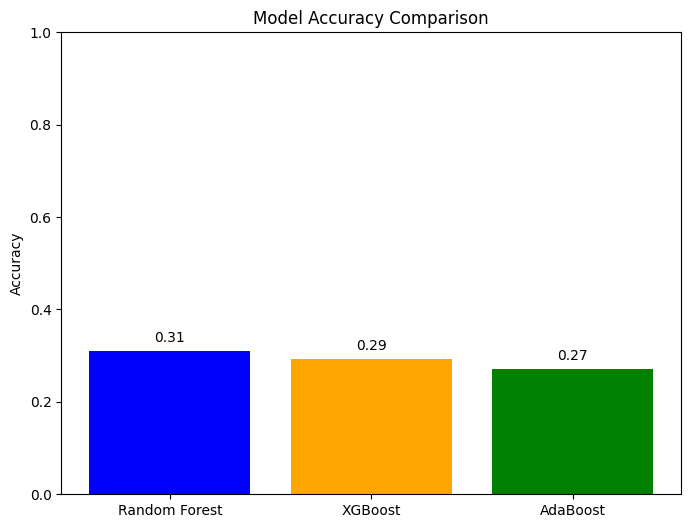


Best Model: Random Forest with Accuracy: 0.31
Best model saved as best_model_Random Forest.pkl


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import pickle

# Load dataset
file_path = "/content/Synthetic_User_Dataset__4000_Users_.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
            'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Add derived features
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI

# **Add New Features: Age and Exercise-to-Sleep Ratio**
# Calculate Age from DOB
from datetime import datetime
df['DOB'] = pd.to_datetime(df['DOB'])
df['Age'] = datetime.now().year - df['DOB'].dt.year

# Map Exercise Level and Sleep Hours to numerical values
exercise_mapping = {'2 days a week': 2, '4 days a week': 4, '6 days a week': 6, 'Daily': 7}
sleep_mapping = {'4-5 hours': 4.5, '5-6 hours': 5.5, '6-7 hours': 6.5, '7-8 hours': 7.5}
df['Exercise Hours'] = df['Exercise Level'].map(exercise_mapping)
df['Sleep Hours Num'] = df['Sleep Hours'].map(sleep_mapping)
df['Exercise-to-Sleep Ratio'] = df['Exercise Hours'] / df['Sleep Hours Num']

# Update features
features.extend(['BMI', 'Age', 'Exercise-to-Sleep Ratio'])

# Encode categorical features
label_encoders = {}
for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[features] = scaler.fit_transform(df[features])

# Define features and labels
X = df[features].values
y = df['Target_Cluster'].values

# Balance the dataset using SMOTE
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

# Map target labels to sequential integers for classifiers
unique_labels = sorted(np.unique(y_balanced))  # Get sorted unique labels
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}  # Create mapping
reverse_mapping = {idx: label for label, idx in label_mapping.items()}  # Reverse mapping for predictions
y_balanced_mapped = np.array([label_mapping[label] for label in y_balanced])  # Apply mapping

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced_mapped, test_size=0.2, random_state=42)

# Class weights for the dataset
class_weights = compute_class_weight('balanced', classes=np.unique(y_balanced_mapped), y=y_balanced_mapped)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Train and Evaluate Models
results = {}
models = {}

# Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=200, max_depth=12, random_state=42, class_weight="balanced")
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_pred)
results['Random Forest'] = rf_accuracy
models['Random Forest'] = rf_model
print(f"Random Forest Test Accuracy: {rf_accuracy:.2f}")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, rf_pred, zero_division=1))

# XGBoost Classifier
xgb_model = xgb.XGBClassifier(
    n_estimators=200,
    max_depth=8,
    learning_rate=0.05,
    objective='multi:softmax',
    num_class=len(unique_labels),
    random_state=42
)
xgb_model.fit(X_train, y_train)
xgb_pred = xgb_model.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_pred)
results['XGBoost'] = xgb_accuracy
models['XGBoost'] = xgb_model
print(f"\nXGBoost Test Accuracy: {xgb_accuracy:.2f}")
print("\nXGBoost Classification Report:")
print(classification_report(y_test, xgb_pred, zero_division=1))

# AdaBoost Classifier
adaboost_model = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=3),  # Use Decision Tree as base classifier
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)
adaboost_model.fit(X_train, y_train)
adaboost_pred = adaboost_model.predict(X_test)
adaboost_accuracy = accuracy_score(y_test, adaboost_pred)
results['AdaBoost'] = adaboost_accuracy
models['AdaBoost'] = adaboost_model
print(f"\nAdaBoost Test Accuracy: {adaboost_accuracy:.2f}")
print("\nAdaBoost Classification Report:")
print(classification_report(y_test, adaboost_pred, zero_division=1))

# Compare Performance
plt.figure(figsize=(8, 6))
model_names = list(results.keys())
accuracies = list(results.values())
plt.bar(model_names, accuracies, color=['blue', 'orange', 'green'])
plt.title('Model Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.02, f"{acc:.2f}", ha='center')
plt.show()

# Save the Best Model
best_model_name = max(results, key=results.get)
best_model = models[best_model_name]
print(f"\nBest Model: {best_model_name} with Accuracy: {results[best_model_name]:.2f}")

# Save the best model to a file
with open(f"best_model_{best_model_name}.pkl", "wb") as f:
    pickle.dump(best_model, f)
print(f"Best model saved as best_model_{best_model_name}.pkl")


Random Forest Test Accuracy: 0.31

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.28      0.31      0.29       188
           1       0.36      0.31      0.33       222
           2       0.25      0.25      0.25       199
           3       0.36      0.37      0.36       231

    accuracy                           0.31       840
   macro avg       0.31      0.31      0.31       840
weighted avg       0.31      0.31      0.31       840


XGBoost Test Accuracy: 0.29

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.27      0.30      0.28       188
           1       0.33      0.28      0.31       222
           2       0.25      0.28      0.26       199
           3       0.33      0.30      0.32       231

    accuracy                           0.29       840
   macro avg       0.29      0.29      0.29       840
weighted avg       0.30      0.29      0.29       84

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



AdaBoost Test Accuracy: 0.27

AdaBoost Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.30      0.27       188
           1       0.26      0.15      0.19       222
           2       0.27      0.35      0.30       199
           3       0.32      0.30      0.31       231

    accuracy                           0.27       840
   macro avg       0.27      0.27      0.27       840
weighted avg       0.27      0.27      0.27       840


SVM Test Accuracy: 0.22

SVM Classification Report:
              precision    recall  f1-score   support

           0       0.20      0.46      0.28       188
           1       0.21      0.11      0.14       222
           2       0.25      0.13      0.17       199
           3       0.25      0.22      0.23       231

    accuracy                           0.22       840
   macro avg       0.23      0.23      0.21       840
weighted avg       0.23      0.22      0.20       840



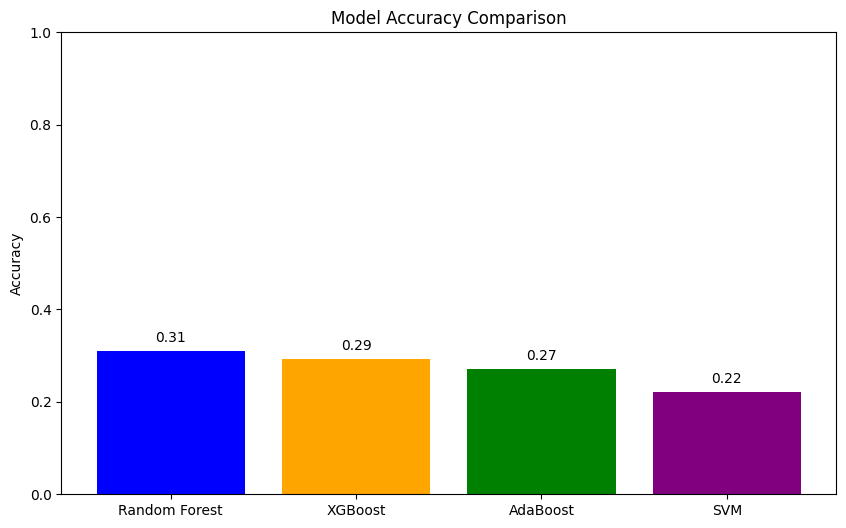


Best Model: Random Forest with Accuracy: 0.31
Best model saved as best_model_Random Forest.pkl


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pickle

# Load dataset
file_path = "/content/Synthetic_User_Dataset__4000_Users_.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
            'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Add derived features
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI

# **Add New Features: Age and Exercise-to-Sleep Ratio**
from datetime import datetime
df['DOB'] = pd.to_datetime(df['DOB'])
df['Age'] = datetime.now().year - df['DOB'].dt.year

# Map Exercise Level and Sleep Hours to numerical values
exercise_mapping = {'2 days a week': 2, '4 days a week': 4, '6 days a week': 6, 'Daily': 7}
sleep_mapping = {'4-5 hours': 4.5, '5-6 hours': 5.5, '6-7 hours': 6.5, '7-8 hours': 7.5}
df['Exercise Hours'] = df['Exercise Level'].map(exercise_mapping)
df['Sleep Hours Num'] = df['Sleep Hours'].map(sleep_mapping)
df['Exercise-to-Sleep Ratio'] = df['Exercise Hours'] / df['Sleep Hours Num']

# Update features
features.extend(['BMI', 'Age', 'Exercise-to-Sleep Ratio'])

# Encode categorical features
label_encoders = {}
for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[features] = scaler.fit_transform(df[features])

# Define features and labels
X = df[features].values
y = df['Target_Cluster'].values

# Balance the dataset using SMOTE
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

# Map target labels to sequential integers for classifiers
unique_labels = sorted(np.unique(y_balanced))  # Get sorted unique labels
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}  # Create mapping
reverse_mapping = {idx: label for label, idx in label_mapping.items()}  # Reverse mapping for predictions
y_balanced_mapped = np.array([label_mapping[label] for label in y_balanced])  # Apply mapping

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced_mapped, test_size=0.2, random_state=42)

# Class weights for the dataset
class_weights = compute_class_weight('balanced', classes=np.unique(y_balanced_mapped), y=y_balanced_mapped)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Train and Evaluate Models
results = {}
models = {}

# Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=200, max_depth=12, random_state=42, class_weight="balanced")
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_pred)
results['Random Forest'] = rf_accuracy
models['Random Forest'] = rf_model
print(f"Random Forest Test Accuracy: {rf_accuracy:.2f}")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, rf_pred, zero_division=1))

# XGBoost Classifier
xgb_model = xgb.XGBClassifier(
    n_estimators=200,
    max_depth=8,
    learning_rate=0.05,
    objective='multi:softmax',
    num_class=len(unique_labels),
    random_state=42
)
xgb_model.fit(X_train, y_train)
xgb_pred = xgb_model.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_pred)
results['XGBoost'] = xgb_accuracy
models['XGBoost'] = xgb_model
print(f"\nXGBoost Test Accuracy: {xgb_accuracy:.2f}")
print("\nXGBoost Classification Report:")
print(classification_report(y_test, xgb_pred, zero_division=1))

# AdaBoost Classifier
adaboost_model = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=3),  # Use Decision Tree as base classifier
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)
adaboost_model.fit(X_train, y_train)
adaboost_pred = adaboost_model.predict(X_test)
adaboost_accuracy = accuracy_score(y_test, adaboost_pred)
results['AdaBoost'] = adaboost_accuracy
models['AdaBoost'] = adaboost_model
print(f"\nAdaBoost Test Accuracy: {adaboost_accuracy:.2f}")
print("\nAdaBoost Classification Report:")
print(classification_report(y_test, adaboost_pred, zero_division=1))

# SVM Classifier
svm_model = SVC(kernel='linear', class_weight='balanced', probability=True, random_state=42)
svm_model.fit(X_train, y_train)
svm_pred = svm_model.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_pred)
results['SVM'] = svm_accuracy
models['SVM'] = svm_model
print(f"\nSVM Test Accuracy: {svm_accuracy:.2f}")
print("\nSVM Classification Report:")
print(classification_report(y_test, svm_pred, zero_division=1))

# Compare Performance
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
accuracies = list(results.values())
plt.bar(model_names, accuracies, color=['blue', 'orange', 'green', 'purple'])
plt.title('Model Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.02, f"{acc:.2f}", ha='center')
plt.show()

# Save the Best Model
best_model_name = max(results, key=results.get)
best_model = models[best_model_name]
print(f"\nBest Model: {best_model_name} with Accuracy: {results[best_model_name]:.2f}")

# Save the best model to a file
with open(f"best_model_{best_model_name}.pkl", "wb") as f:
    pickle.dump(best_model, f)
print(f"Best model saved as best_model_{best_model_name}.pkl")


In [ ]:
pip install pytorch-tabnet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 1.9 MB/s eta 0:00:00


Naive Bayes Test Accuracy: 0.25
              precision    recall  f1-score   support

           0       0.26      0.43      0.32       188
           1       0.22      0.18      0.20       222
           2       0.25      0.27      0.26       199
           3       0.27      0.15      0.19       231

    accuracy                           0.25       840
   macro avg       0.25      0.26      0.24       840
weighted avg       0.25      0.25      0.24       840



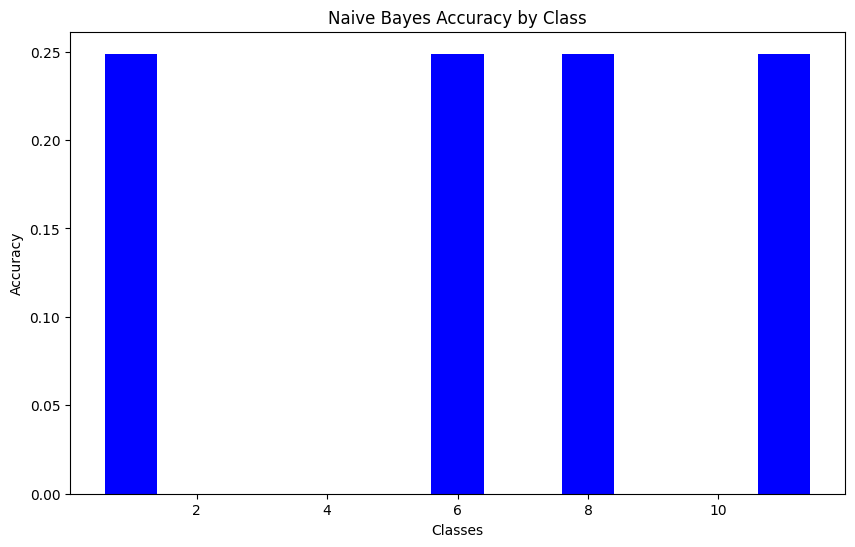

Naive Bayes model saved as 'naive_bayes_model.pkl'
Predicted Cluster for new data: 6


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.naive_bayes import GaussianNB
import matplotlib.pyplot as plt

# Load dataset
file_path = "/content/Synthetic_User_Dataset__4000_Users_.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
            'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Add derived features
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI

# Add new features: Age and Exercise-to-Sleep Ratio
from datetime import datetime
df['DOB'] = pd.to_datetime(df['DOB'])
df['Age'] = datetime.now().year - df['DOB'].dt.year

exercise_mapping = {'2 days a week': 2, '4 days a week': 4, '6 days a week': 6, 'Daily': 7}
sleep_mapping = {'4-5 hours': 4.5, '5-6 hours': 5.5, '6-7 hours': 6.5, '7-8 hours': 7.5}
df['Exercise Hours'] = df['Exercise Level'].map(exercise_mapping)
df['Sleep Hours Num'] = df['Sleep Hours'].map(sleep_mapping)
df['Exercise-to-Sleep Ratio'] = df['Exercise Hours'] / df['Sleep Hours Num']

# Update features
features.extend(['BMI', 'Age', 'Exercise-to-Sleep Ratio'])

# Encode categorical features
label_encoders = {}
for col in ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[features] = scaler.fit_transform(df[features])

# Define features and labels
X = df[features].values
y = df['Target_Cluster'].values

# Balance the dataset using SMOTE
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

# Map target labels to sequential integers for classifiers
unique_labels = sorted(np.unique(y_balanced))  # Get sorted unique labels
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}  # Create mapping
reverse_mapping = {idx: label for label, idx in label_mapping.items()}  # Reverse mapping for predictions
y_balanced_mapped = np.array([label_mapping[label] for label in y_balanced])  # Apply mapping

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced_mapped, test_size=0.2, random_state=42)

# Initialize the Naive Bayes model
nb_model = GaussianNB()

# Train the Naive Bayes model
nb_model.fit(X_train, y_train)

# Evaluate the model
y_pred = nb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Naive Bayes Test Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

# Plotting the accuracy vs classes (optional)
plt.figure(figsize=(10, 6))
plt.bar(unique_labels, [accuracy_score(y_test, nb_model.predict(X_test)) for label in unique_labels], color='blue')
plt.title('Naive Bayes Accuracy by Class')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.show()

# Save the Naive Bayes model
import joblib
joblib.dump(nb_model, 'naive_bayes_model.pkl')
print("Naive Bayes model saved as 'naive_bayes_model.pkl'")

# Prediction on new unseen data (example)
# Let's simulate new user data (e.g., new rows of data similar to the original dataset):
new_user_data = np.array([[5.5, 70, 1, 2, 0, 4, 6, 0.3, 25, 0.3, 1.6]])  # Example new data point
new_user_data_scaled = scaler.transform(new_user_data)  # Scaling the new data

# Predict using the trained model
new_user_pred = nb_model.predict(new_user_data_scaled)

# Reverse the label mapping for readable output
predicted_cluster = reverse_mapping[new_user_pred[0]]
print(f"Predicted Cluster for new data: {predicted_cluster}")


In [ ]:
import pandas as pd

# Load the clustered data (after outlier removal and PCA)
clustered_data_path = "clustered_data_20_clusters_cleaned.csv"  # Path to the file with clustered data
df_cleaned = pd.read_csv(clustered_data_path)

# Define nutritional diet tags for each of the 14 clusters
cluster_nutritional_diet = {
    0: "High Protein, Low Fat",
    1: "Low Carb, High Fiber",
    2: "Balanced Diet",
    3: "High Sugar, Low Fiber",
    4: "Low Cholesterol",
    5: "Rich in Vitamins",
    6: "High Calorie Snacks",
    7: "Low Sodium",
    8: "High Iron Content",
    9: "Rich in Calcium",
    10: "Low Calorie, Low Fat",
    11: "High Potassium Foods",
    12: "Vitamin C Rich",
    13: "Low Fatty Acids"
}

# Map the nutritional diet tags to each cluster
df_cleaned['Cluster_Tag'] = df_cleaned['KMeans_Cluster_20'].map(cluster_nutritional_diet)

# Save the updated DataFrame with the new Cluster_Tag column
updated_file_path = "clustered_data_with_tags.csv"
df_cleaned.to_csv(updated_file_path, index=False)

print(f"Updated file with cluster tags saved as {updated_file_path}")

# Optional: Show a preview of the updated data (first 20 rows)
print("\nPreview of the updated data:")
print(df_cleaned[['KMeans_Cluster_20', 'Cluster_Tag']].head(20))


Updated file with cluster tags saved as clustered_data_with_tags.csv

Preview of the updated data:
    KMeans_Cluster_20            Cluster_Tag
0                  11   High Potassium Foods
1                   4        Low Cholesterol
2                  13        Low Fatty Acids
3                  11   High Potassium Foods
4                   0  High Protein, Low Fat
5                  13        Low Fatty Acids
6                  13        Low Fatty Acids
7                   7             Low Sodium
8                   7             Low Sodium
9                   7             Low Sodium
10                 13        Low Fatty Acids
11                  1   Low Carb, High Fiber
12                 13        Low Fatty Acids
13                 11   High Potassium Foods
14                 10   Low Calorie, Low Fat
15                 10   Low Calorie, Low Fat
16                  3  High Sugar, Low Fiber
17                 13        Low Fatty Acids
18                  0  High Protein, Low Fat
1

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
import pickle

# Load the clustered data with tags
file_path = ""  # Replace with the correct path
df = pd.read_csv(file_path)

# Preprocessing
# Extract relevant features and target
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']
target = 'KMeans_Cluster_20'  # The cluster labels are our target variable

# Encode categorical features using Label Encoding
label_encoders = {}
for col in ['Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[['Height (ft)', 'Weight (kg)']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)']])

# Define features and labels
X = df[features]
y = df[target]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Naive Bayes classifier (Gaussian Naive Bayes)
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

# Evaluate the model
y_pred = nb_model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Accuracy Score: {accuracy_score(y_test, y_pred):.2f}")

# Save the trained Naive Bayes model and preprocessing objects (scaler and label encoders)
with open("naive_bayes_model.pkl", "wb") as model_file:
    pickle.dump(nb_model, model_file)

with open("label_encoders.pkl", "wb") as le_file:
    pickle.dump(label_encoders, le_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

print("Model and preprocessing objects saved successfully.")

# Function to predict user-provided data using the trained Naive Bayes model
def predict_user_input(user_data):
    # Load the saved model and preprocessing objects
    with open("naive_bayes_model.pkl", "rb") as model_file:
        nb_model = pickle.load(model_file)

    with open("label_encoders.pkl", "rb") as le_file:
        label_encoders = pickle.load(le_file)

    with open("scaler.pkl", "rb") as scaler_file:
        scaler = pickle.load(scaler_file)

    # Convert the user data dictionary to a DataFrame
    user_df = pd.DataFrame([user_data])

    # Preprocess categorical columns using the saved label encoders
    for col in ['Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']:
        if col in user_data:
            user_df[col] = label_encoders[col].transform(user_df[col])

    # Scale numerical columns using the saved scaler
    if 'Height (ft)' in user_df and 'Weight (kg)' in user_df:
        user_df[['Height (ft)', 'Weight (kg)']] = scaler.transform(
            user_df[['Height (ft)', 'Weight (kg)']]
        )

    # Predict the target cluster (cluster label)
    predicted_cluster = nb_model.predict(user_df[features])[0]

    print(f"Predicted Cluster: {predicted_cluster}")
    return predicted_cluster

# Example: Predict for a new user
new_user_data = {
    'Height (ft)': 5.6,
    'Weight (kg)': 70,
    'Gender': 'Male',
    'Occupation': 'Teacher',
    'Exercise Level': '6 days a week',
    'Sleep Hours': '6-7 hours',
    'Medical History': 'Diabetes Problem',
}

# Predict the cluster label for the new user
predict_user_input(new_user_data)


KeyError: 'KMeans_Cluster_20'

In [ ]:
import pandas as pd
import pickle
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Function to predict user-provided data using the trained Naive Bayes model
def predict_user_input(user_data):
    # Load the saved model and preprocessing objects
    with open("naive_bayes_model.pkl", "rb") as model_file:
        nb_model = pickle.load(model_file)

    with open("label_encoders.pkl", "rb") as le_file:
        label_encoders = pickle.load(le_file)

    with open("scaler.pkl", "rb") as scaler_file:
        scaler = pickle.load(scaler_file)

    # Convert the user data dictionary to a DataFrame
    user_df = pd.DataFrame([user_data])

    # Verify column names exist in user data
    print("Columns in user data: ", user_df.columns)

    # Preprocess categorical columns using the saved label encoders
    for col in ['Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']:
        if col in user_df.columns:
            user_df[col] = label_encoders[col].transform(user_df[col])
        else:
            print(f"Warning: Column {col} is missing from user data.")

    # Scale numerical columns using the saved scaler
    if 'Height (ft)' in user_df.columns and 'Weight (kg)' in user_df.columns:
        user_df[['Height (ft)', 'Weight (kg)']] = scaler.transform(
            user_df[['Height (ft)', 'Weight (kg)']]
        )

    # Predict the target cluster (cluster label)
    predicted_cluster = nb_model.predict(user_df[features])[0]

    print(f"Predicted Cluster: {predicted_cluster}")
    return predicted_cluster

# Example: Predict for a new user
new_user_data = {
    'Height (ft)': 5.6,
    'Weight (kg)': 70,
    'Gender': 'Male',  # Make sure this matches the column name in your dataset
    'Occupation': 'Teacher',
    'Exercise Level': '6 days a week',
    'Sleep Hours': '6-7 hours',
    'Medical History': 'Diabetes Problem',
}

# Predict the cluster label for the new user
predict_user_input(new_user_data)


UnpicklingError: invalid load key, '\x0a'.

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
import xgboost as xgb
import pickle

# Load dataset
file_path = "/content/Synthetic_User_Dataset__4000_Users_.csv"  # Replace with your actual file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract relevant features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification (we'll use the first cluster label)
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as target

# Handle categorical features using Label Encoding
label_encoders = {}
for col in ['Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[['Height (ft)', 'Weight (kg)']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)']])

# Define features and labels
X = df[features]
y = df['Target_Cluster']

# Re-assign labels to ensure they are in a continuous sequence starting from 0
y = pd.factorize(y)[0]

# Train-test split (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Hyperparameter tuning with GridSearchCV for Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': ['balanced', None]
}
rf_grid_search = GridSearchCV(rf_model, rf_param_grid, cv=5, verbose=1, n_jobs=-1)
rf_grid_search.fit(X_train, y_train)
print(f"Best Random Forest Params: {rf_grid_search.best_params_}")

# Evaluate the Random Forest with tuned hyperparameters
rf_best_model = rf_grid_search.best_estimator_
rf_best_model.fit(X_train, y_train)
rf_y_pred = rf_best_model.predict(X_test)
print("Random Forest Classification Report:")
print(classification_report(y_test, rf_y_pred))
print(f"Random Forest Accuracy: {accuracy_score(y_test, rf_y_pred):.2f}")

# 2. Hyperparameter tuning with GridSearchCV for XGBoost
xgb_model = xgb.XGBClassifier(random_state=42, objective='multi:softmax', num_class=len(df['Target_Cluster'].unique()))
xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [6, 10, 15],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 0.9, 1],
    'colsample_bytree': [0.8, 0.9, 1]
}
xgb_grid_search = GridSearchCV(xgb_model, xgb_param_grid, cv=5, verbose=1, n_jobs=-1)
xgb_grid_search.fit(X_train, y_train)
print(f"Best XGBoost Params: {xgb_grid_search.best_params_}")

# Evaluate the XGBoost with tuned hyperparameters
xgb_best_model = xgb_grid_search.best_estimator_
xgb_best_model.fit(X_train, y_train)
xgb_y_pred = xgb_best_model.predict(X_test)
print("XGBoost Classification Report:")
print(classification_report(y_test, xgb_y_pred))
print(f"XGBoost Accuracy: {accuracy_score(y_test, xgb_y_pred):.2f}")

# 3. Evaluate Gradient Boosting Classifier
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)
gb_y_pred = gb_model.predict(X_test)
print("Gradient Boosting Classification Report:")
print(classification_report(y_test, gb_y_pred))
print(f"Gradient Boosting Accuracy: {accuracy_score(y_test, gb_y_pred):.2f}")

# 4. Model comparison and selection of the best model
model_results = {
    "Random Forest": accuracy_score(y_test, rf_y_pred),
    "XGBoost": accuracy_score(y_test, xgb_y_pred),
    "Gradient Boosting": accuracy_score(y_test, gb_y_pred)
}

best_model_name = max(model_results, key=model_results.get)
print(f"\nBest Model: {best_model_name} with Accuracy: {model_results[best_model_name]:.2f}")

# Save the best model
if best_model_name == "Random Forest":
    best_model = rf_best_model
elif best_model_name == "XGBoost":
    best_model = xgb_best_model
else:
    best_model = gb_model

with open(f"{best_model_name}_model.pkl", "wb") as model_file:
    pickle.dump(best_model, model_file)

with open("label_encoders.pkl", "wb") as le_file:
    pickle.dump(label_encoders, le_file)

with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)

print(f"Best model saved as {best_model_name}_model.pkl")


# Function to predict user-provided data using the trained best model
def predict_user_input(user_data, top_n=3):
    # Load the saved model and preprocessing objects
    with open(f"{best_model_name}_model.pkl", "rb") as model_file:
        best_model = pickle.load(model_file)

    with open("label_encoders.pkl", "rb") as le_file:
        label_encoders = pickle.load(le_file)

    with open("scaler.pkl", "rb") as scaler_file:
        scaler = pickle.load(scaler_file)

    # Convert the user data dictionary to a DataFrame
    user_df = pd.DataFrame([user_data])

    # Preprocess categorical columns using the saved label encoders
    for col in ['Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']:
        if col in user_df.columns:
            user_df[col] = label_encoders[col].transform(user_df[col])

    # Scale numerical columns using the saved scaler
    if 'Height (ft)' in user_df.columns and 'Weight (kg)' in user_df.columns:
        user_df[['Height (ft)', 'Weight (kg)']] = scaler.transform(
            user_df[['Height (ft)', 'Weight (kg)']]
        )

    # Predict the target cluster probabilities
    prob = best_model.predict_proba(user_df[features])[0]

    # Get the top N clusters with the highest probabilities
    top_n_clusters = prob.argsort()[-top_n:][::-1]
    print(f"Top {top_n} Predicted Clusters: {top_n_clusters}")

    return top_n_clusters


# Example: Predict for a new user (unseen data)
new_user_data = {
    'Height (ft)': 5.91,
    'Weight (kg)': 50,
    'Gender': 'Male',  # Ensure this matches the column name in your dataset
    'Occupation': 'Engineer',
    'Exercise Level': 'Daily',
    'Sleep Hours': '4-5 hours',
    'Medical History': 'Heart Problem',
}

# Predict the top 3 cluster labels for the new user
predicted_clusters = predict_user_input(new_user_data, top_n=3)

# Map the predicted cluster labels to their corresponding nutritional diet
cluster_tags = {
    0: "High Protein, Low Fat",
    1: "Low Carb, High Fiber",
    2: "Balanced Diet",
    3: "High Sugar, Low Fiber",
    4: "Low Cholesterol",
    5: "Rich in Vitamins",
    6: "High Calorie Snacks",
    7: "Low Sodium",
    8: "High Iron Content",
    9: "Rich in Calcium",
    10: "Low Calorie, Low Fat",
    11: "High Potassium Foods",
    12: "Vitamin C Rich",
    13: "Low Fatty Acids"
}

# Get the nutritional diet for the top N clusters
recommended_diets = [cluster_tags.get(cluster, "Unknown Diet") for cluster in predicted_clusters]
print(f"Recommended Nutritional Diets: {', '.join(recommended_diets)}")


Fitting 5 folds for each of 162 candidates, totalling 810 fits
Best Random Forest Params: {'class_weight': 'balanced', 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.26      0.26      0.26       217
           1       0.21      0.22      0.22       192
           2       0.31      0.27      0.29       223
           3       0.20      0.23      0.21       168

    accuracy                           0.25       800
   macro avg       0.25      0.24      0.24       800
weighted avg       0.25      0.25      0.25       800

Random Forest Accuracy: 0.25
Fitting 5 folds for each of 243 candidates, totalling 1215 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best XGBoost Params: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 100, 'subsample': 0.9}
XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.26      0.25      0.26       217
           1       0.19      0.21      0.20       192
           2       0.30      0.25      0.27       223
           3       0.21      0.23      0.22       168

    accuracy                           0.24       800
   macro avg       0.24      0.24      0.24       800
weighted avg       0.24      0.24      0.24       800

XGBoost Accuracy: 0.24
Gradient Boosting Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.23      0.24       217
           1       0.23      0.29      0.26       192
           2       0.25      0.18      0.21       223
           3       0.17      0.19      0.18       168

    accuracy                           0.22       800
   macro avg      

In [ ]:
# Predict the top 3 cluster labels for the new user
predicted_clusters = predict_user_input(new_user_data, top_n=2)

# Map the predicted cluster label"s to their corresponding nutritional diet
cluster_tags = {
    0: "High Protein, Low Fat",
    1: "Low Carb, High Fiber",
    2: "Balanced Diet",
    3: "High Sugar, Low Fiber",
    4: "Low Cholesterol",
    5: "Rich in Vitamins",
    6: "High Calorie Snacks",
    7: "Low Sodium",
    8: "High Iron Content",
    9: "Rich in Calcium",
    10: "Low Calorie, Low Fat",
    11: "High Potassium Foods",
    12: "Vitamin C Rich",
    13: "Low Fatty Acids"
}

# Get the nutritional diet for the top N clusters
recommended_diets = [cluster_tags.get(cluster, "Unknown Diet") for cluster in predicted_clusters]
print(f"Recommended Nutritional Diets: {', '.join(recommended_diets)}")


Top 2 Predicted Clusters: [0 2]
Recommended Nutritional Diets: High Protein, Low Fat, Balanced Diet


Checking for duplicates and missing values...
Dropped 2035 duplicate rows.
Data shape after cleaning: (1965, 18)
Before SMOTE: Counter({8: 678, 11: 655, 10: 321, 2: 311})
After SMOTE: Counter({10: 678, 8: 678, 11: 678, 2: 678})

Training Random Forest Classifier...
Random Forest Best Params: {'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Random Forest Test Accuracy: 0.52

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.64      0.65       136
           1       0.36      0.43      0.39       135
           2       0.70      0.57      0.63       136
           3       0.43      0.43      0.43       136

    accuracy                           0.52       543
   macro avg       0.53      0.52      0.52       543
weighted avg       0.54      0.52      0.52       543


Training XGBoost Classifier...
XGBoost Best Params: {'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 200, '

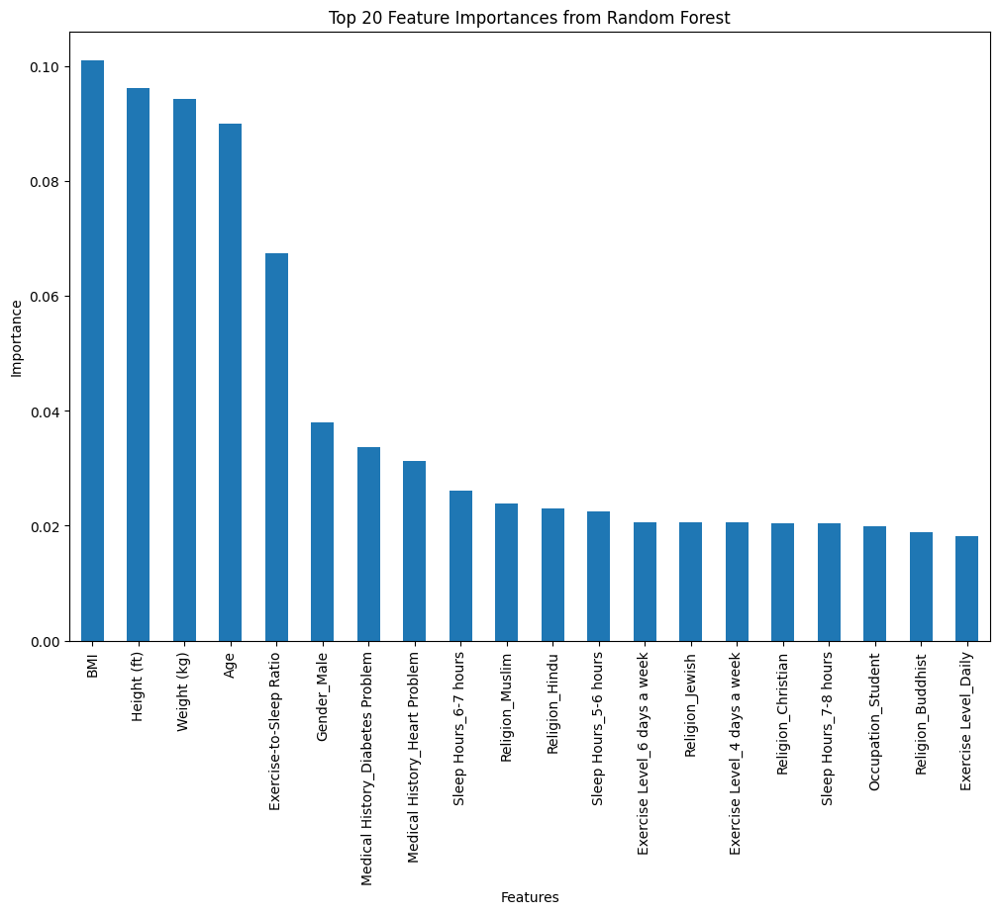


Training Voting Classifier...
VotingClassifier Test Accuracy: 0.53

VotingClassifier Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.66      0.70       136
           1       0.37      0.42      0.40       135
           2       0.66      0.64      0.65       136
           3       0.41      0.41      0.41       136

    accuracy                           0.53       543
   macro avg       0.55      0.53      0.54       543
weighted avg       0.55      0.53      0.54       543


Performing Cross-Validation for Random Forest...
Random Forest Cross-Validation Accuracy: 0.52 ± 0.15

Comparing Model Accuracies...


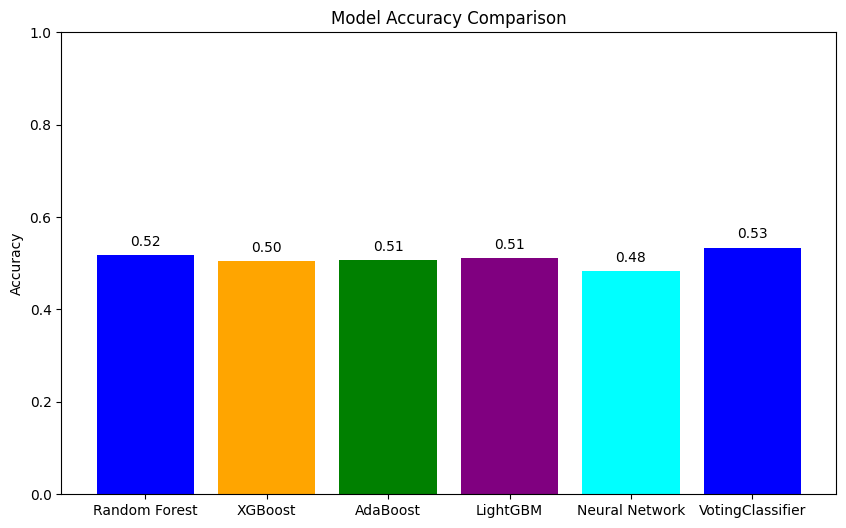


Best Model: VotingClassifier with Accuracy: 0.53
Best model saved as best_model_VotingClassifier.pkl


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
import lightgbm as lgb
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pickle
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from collections import Counter
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
tf.random.set_seed(RANDOM_STATE)

# 1. Load Dataset
file_path = "/content/synthetic_data_NEW_4000.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# 2. Data Preprocessing

# 2.1 Extract Features and Target
target_column = 'Target Clusters'
feature_columns = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
                   'Exercise Level', 'Sleep Hours', 'Medical History']

# 2.2 Flatten Target Clusters for Multi-Class Classification
df['Target_Cluster'] = df[target_column].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# 2.3 Feature Engineering
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI

# Calculate Age from DOB
df['DOB'] = pd.to_datetime(df['DOB'])
current_year = pd.Timestamp.now().year
df['Age'] = current_year - df['DOB'].dt.year

# Map Exercise Level and Sleep Hours to numerical values
exercise_mapping = {'2 days a week': 2, '4 days a week': 4, '6 days a week': 6, 'Daily': 7}
sleep_mapping = {'4-5 hours': 4.5, '5-6 hours': 5.5, '6-7 hours': 6.5, '7-8 hours': 7.5}
df['Exercise Hours'] = df['Exercise Level'].map(exercise_mapping)
df['Sleep Hours Num'] = df['Sleep Hours'].map(sleep_mapping)
df['Exercise-to-Sleep Ratio'] = df['Exercise Hours'] / df['Sleep Hours Num']

# Update feature columns with new features
feature_columns.extend(['BMI', 'Age', 'Exercise-to-Sleep Ratio'])

# 2.4 Define Categorical and Numerical Columns
categorical_cols = ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']
numeric_cols = [col for col in feature_columns if col not in categorical_cols]

# 2.5 Handle Missing Values and Duplicates
print("Checking for duplicates and missing values...")
initial_shape = df.shape
df = df.drop_duplicates()
df = df.dropna()
final_shape = df.shape
print(f"Dropped {initial_shape[0] - final_shape[0]} duplicate rows.")
print(f"Data shape after cleaning: {final_shape}")

# 2.6 Feature Encoding and Scaling using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(drop='first'), categorical_cols)
    ]
)

# Apply preprocessing
X = preprocessor.fit_transform(df[feature_columns])
y = df['Target_Cluster'].values

# 2.7 Balancing the Dataset using SMOTE
print("Before SMOTE:", Counter(y))
smote = SMOTE(random_state=RANDOM_STATE)
X_balanced, y_balanced = smote.fit_resample(X, y)
print("After SMOTE:", Counter(y_balanced))

# 2.8 Map Target Labels to Sequential Integers for Classifiers
unique_labels = sorted(np.unique(y_balanced))
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
reverse_mapping = {idx: label for label, idx in label_mapping.items()}
y_mapped = np.array([label_mapping[label] for label in y_balanced])

# 2.9 Split Data into Training and Testing Sets with Stratification
X_train, X_test, y_train, y_test = train_test_split(
    X_balanced, y_mapped, test_size=0.2, random_state=RANDOM_STATE, stratify=y_mapped
)

# 2.10 Compute Class Weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# 3. Model Training and Evaluation

# Initialize dictionaries to store results and models
results = {}
models = {}

# 3.1 Random Forest Classifier with Hyperparameter Tuning
print("\nTraining Random Forest Classifier...")
rf = RandomForestClassifier(random_state=RANDOM_STATE, class_weight="balanced")
rf_params = {
    'n_estimators': [100, 200],
    'max_depth': [10, 12, 15],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}
rf_grid = GridSearchCV(rf, rf_params, cv=3, n_jobs=-1, scoring='accuracy')
rf_grid.fit(X_train, y_train)
rf_best = rf_grid.best_estimator_
rf_pred = rf_best.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_pred)
results['Random Forest'] = rf_accuracy
models['Random Forest'] = rf_best
print(f"Random Forest Best Params: {rf_grid.best_params_}")
print(f"Random Forest Test Accuracy: {rf_accuracy:.2f}")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, rf_pred, zero_division=1))

# 3.2 XGBoost Classifier with Hyperparameter Tuning
print("\nTraining XGBoost Classifier...")
xgb_clf = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=len(unique_labels),
    random_state=RANDOM_STATE,
    use_label_encoder=False,
    eval_metric='mlogloss'
)
xgb_params = {
    'n_estimators': [100, 200],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 1.0]
}
xgb_grid = GridSearchCV(xgb_clf, xgb_params, cv=3, n_jobs=-1, scoring='accuracy')
xgb_grid.fit(X_train, y_train)
xgb_best = xgb_grid.best_estimator_
xgb_pred = xgb_best.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_pred)
results['XGBoost'] = xgb_accuracy
models['XGBoost'] = xgb_best
print(f"XGBoost Best Params: {xgb_grid.best_params_}")
print(f"XGBoost Test Accuracy: {xgb_accuracy:.2f}")
print("\nXGBoost Classification Report:")
print(classification_report(y_test, xgb_pred, zero_division=1))

# 3.3 AdaBoost Classifier with Hyperparameter Tuning (Corrected)
print("\nTraining AdaBoost Classifier...")
adaboost = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(random_state=RANDOM_STATE),
    random_state=RANDOM_STATE
)
adaboost_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0],
    'estimator__max_depth': [1, 3, 5]  # Corrected parameter name
}
adaboost_grid = GridSearchCV(adaboost, adaboost_params, cv=3, n_jobs=-1, scoring='accuracy')
adaboost_grid.fit(X_train, y_train)
adaboost_best = adaboost_grid.best_estimator_
adaboost_pred = adaboost_best.predict(X_test)
adaboost_accuracy = accuracy_score(y_test, adaboost_pred)
results['AdaBoost'] = adaboost_accuracy
models['AdaBoost'] = adaboost_best
print(f"AdaBoost Best Params: {adaboost_grid.best_params_}")
print(f"AdaBoost Test Accuracy: {adaboost_accuracy:.2f}")
print("\nAdaBoost Classification Report:")
print(classification_report(y_test, adaboost_pred, zero_division=1))

# 3.4 LightGBM Classifier with Hyperparameter Tuning
print("\nTraining LightGBM Classifier...")
lgbm_clf = lgb.LGBMClassifier(
    objective='multiclass',
    num_class=len(unique_labels),
    random_state=RANDOM_STATE
)
lgbm_params = {
    'n_estimators': [100, 200],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 50, 70]
}
lgbm_grid = GridSearchCV(lgbm_clf, lgbm_params, cv=3, n_jobs=-1, scoring='accuracy')
lgbm_grid.fit(X_train, y_train)
lgbm_best = lgbm_grid.best_estimator_
lgbm_pred = lgbm_best.predict(X_test)
lgbm_accuracy = accuracy_score(y_test, lgbm_pred)
results['LightGBM'] = lgbm_accuracy
models['LightGBM'] = lgbm_best
print(f"LightGBM Best Params: {lgbm_grid.best_params_}")
print(f"LightGBM Test Accuracy: {lgbm_accuracy:.2f}")
print("\nLightGBM Classification Report:")
print(classification_report(y_test, lgbm_pred, zero_division=1))

# 3.5 Deep Neural Network (DNN)
print("\nTraining Deep Neural Network...")
def create_dnn(input_dim, num_classes):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

dnn_model = create_dnn(X_train.shape[1], len(unique_labels))
dnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = dnn_model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=[early_stop],
    verbose=1
)

# Evaluate DNN
dnn_loss, dnn_accuracy = dnn_model.evaluate(X_test, y_test, verbose=0)
results['Neural Network'] = dnn_accuracy
models['Neural Network'] = dnn_model
print(f"DNN Test Accuracy: {dnn_accuracy:.2f}")

# DNN Classification Report
dnn_pred_probs = dnn_model.predict(X_test)
dnn_pred = np.argmax(dnn_pred_probs, axis=1)
print("\nDNN Classification Report:")
print(classification_report(y_test, dnn_pred, zero_division=1))

# 3.6 Feature Importance Analysis using Random Forest
print("\nAnalyzing Feature Importances from Random Forest...")
importances = rf_best.feature_importances_
# Retrieve feature names from preprocessor
num_features = preprocessor.named_transformers_['num'].get_feature_names_out(numeric_cols)
cat_features = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_cols)
all_features = list(num_features) + list(cat_features)
feature_importances = pd.Series(importances, index=all_features).sort_values(ascending=False)

plt.figure(figsize=(12, 8))
feature_importances.head(20).plot(kind='bar')
plt.title('Top 20 Feature Importances from Random Forest')
plt.ylabel('Importance')
plt.xlabel('Features')
plt.show()

# 3.7 Voting Classifier (Ensemble of Multiple Models)
print("\nTraining Voting Classifier...")
voting_clf = VotingClassifier(
    estimators=[
        ('rf', rf_best),
        ('xgb', xgb_best),
        ('adaboost', adaboost_best),
        ('lgbm', lgbm_best)
    ],
    voting='soft',
    n_jobs=-1
)
voting_clf.fit(X_train, y_train)
voting_pred = voting_clf.predict(X_test)
voting_accuracy = accuracy_score(y_test, voting_pred)
results['VotingClassifier'] = voting_accuracy
models['VotingClassifier'] = voting_clf
print(f"VotingClassifier Test Accuracy: {voting_accuracy:.2f}")
print("\nVotingClassifier Classification Report:")
print(classification_report(y_test, voting_pred, zero_division=1))

# 3.8 Cross-Validation for Random Forest
print("\nPerforming Cross-Validation for Random Forest...")
cv_scores = cross_val_score(rf_best, X_balanced, y_mapped, cv=5, scoring='accuracy', n_jobs=-1)
print(f"Random Forest Cross-Validation Accuracy: {cv_scores.mean():.2f} ± {cv_scores.std():.2f}")

# 4. Model Performance Comparison
print("\nComparing Model Accuracies...")
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
accuracies = list(results.values())
colors = ['blue', 'orange', 'green', 'purple', 'cyan']
plt.bar(model_names, accuracies, color=colors[:len(model_names)])
plt.title('Model Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.02, f"{acc:.2f}", ha='center')
plt.show()

# 5. Save the Best Model
best_model_name = max(results, key=results.get)
best_model = models[best_model_name]
print(f"\nBest Model: {best_model_name} with Accuracy: {results[best_model_name]:.2f}")

if best_model_name == 'Neural Network':
    # Save Keras model
    best_model.save(f"best_model_{best_model_name}.h5")
    print(f"Best model saved as best_model_{best_model_name}.h5")
else:
    # Save scikit-learn model
    with open(f"best_model_{best_model_name}.pkl", "wb") as f:
        pickle.dump(best_model, f)
    print(f"Best model saved as best_model_{best_model_name}.pkl")


In [ ]:
import csv
import random
from datetime import datetime, timedelta

num_records = 4000

occupations = [
    "Engineer", "Teacher", "Student", "Nurse", "Doctor", "Lawyer", "Artist", "Chef", "Accountant",
    "Architect", "Driver", "Software Developer", "Manager", "Consultant", "Salesperson", "Researcher",
    "Pharmacist", "Electrician", "Carpenter", "Farmer"
]

religions = ["Muslim", "Non-Muslim", "Christian", "Hindu", "Buddhist", "Jewish", "Atheist"]
genders = ["Male", "Female"]
exercise_levels = ["Daily", "6 days a week", "4 days a week", "3 days a week", "2 days a week", "Sedentary"]
sleep_hours_options = ["4-5 hours", "5-6 hours", "6-7 hours", "7-8 hours"]
medical_histories = ["None", "Heart Problem", "Diabetes Problem", "Both Heart and Diabetes"]
cluster_options = [
    [8, 11, 1, 6],
    [11, 1, 4, 8],
    [2, 5, 3, 9],
    [10, 4, 7, 12],
    [8, 11, 1, 6],  # repeating some patterns
    [11, 1, 4, 8]
]

def random_date(start_year=1950, end_year=2005):
    start_date = datetime(start_year, 1, 1)
    end_date = datetime(end_year, 12, 31)
    delta = end_date - start_date
    random_days = random.randrange(delta.days)
    return (start_date + timedelta(days=random_days)).strftime("%m/%d/%Y")

with open("synthetic_data_NEW_4000.csv", "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    # Write header
    writer.writerow(["ID","Height (ft)","DOB","Weight (kg)","Gender","Occupation","Religion","Exercise Level","Sleep Hours","Medical History","Target Clusters"])

    for i in range(1, num_records+1):
        height = round(random.uniform(4.5, 6.5), 2)  # in feet
        dob = random_date()
        weight = random.randint(40, 130)
        gender = random.choice(genders)
        occupation = random.choice(occupations)
        religion = random.choice(religions)
        exercise_level = random.choice(exercise_levels)
        sleep_hours = random.choice(sleep_hours_options)
        medical_history = random.choice(medical_histories)
        target_clusters = random.choice(cluster_options)

        # Convert cluster to string format like [8, 11, 1, 6]
        target_clusters_str = "[" + ", ".join(map(str, target_clusters)) + "]"

        writer.writerow([
            i,
            height,
            dob,
            weight,
            gender,
            occupation,
            religion,
            exercise_level,
            sleep_hours,
            medical_history,
            target_clusters_str
        ])

print("synthetic_data.csv has been created with 4000 rows.")


synthetic_data.csv has been created with 4000 rows.


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


Checking for duplicates and missing values...
Dropped 1970 duplicate rows.
Data shape after cleaning: (2030, 18)
Before SMOTE: Counter({8: 705, 11: 682, 10: 334, 2: 309})
After SMOTE: Counter({8: 705, 11: 705, 10: 705, 2: 705})

Training Random Forest Classifier...
Random Forest Best Params: {'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Random Forest Test Accuracy: 0.53

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.67      0.73       141
           1       0.36      0.43      0.39       141
           2       0.70      0.57      0.63       141
           3       0.39      0.45      0.42       141

    accuracy                           0.53       564
   macro avg       0.56      0.53      0.54       564
weighted avg       0.56      0.53      0.54       564


Training XGBoost Classifier...
XGBoost Best Params: {'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 200,

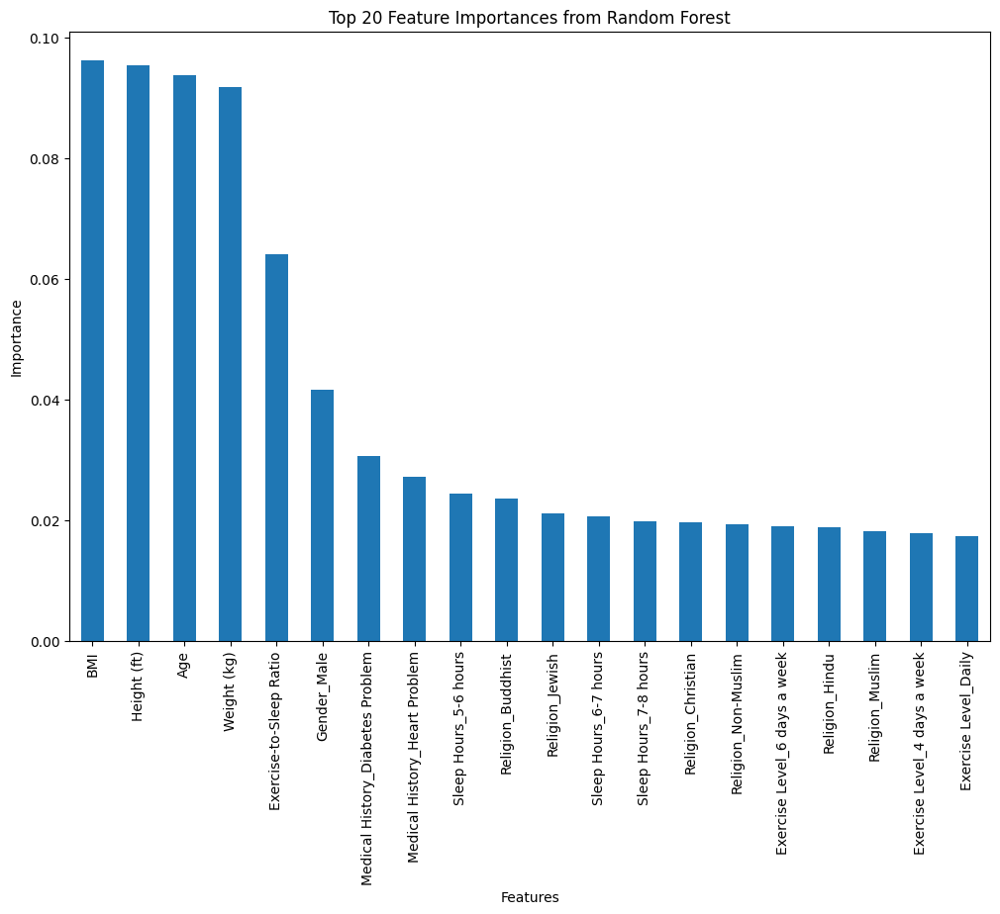


Training Voting Classifier...
VotingClassifier Test Accuracy: 0.49

VotingClassifier Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.60      0.68       141
           1       0.29      0.38      0.33       141
           2       0.70      0.57      0.63       141
           3       0.36      0.40      0.38       141

    accuracy                           0.49       564
   macro avg       0.53      0.49      0.51       564
weighted avg       0.53      0.49      0.51       564


Performing Cross-Validation for Random Forest...
Random Forest Cross-Validation Accuracy: 0.53 ± 0.16

Comparing Model Accuracies...


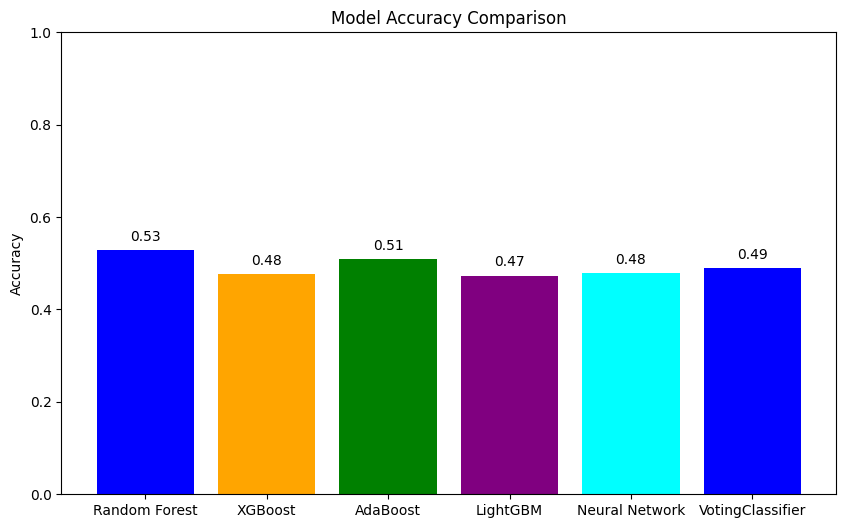


Best Model: Random Forest with Accuracy: 0.53
Best model saved as models/best_model_Random Forest.pkl
Preprocessor saved as models/preprocessor.pkl
Label mapping saved as models/label_mapping.pkl


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, accuracy_score
import xgboost as xgb
import lightgbm as lgb
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pickle
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from collections import Counter
import warnings
import os

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
tf.random.set_seed(RANDOM_STATE)

# 1. Load Dataset
file_path = "/content/synthetic_data_NEW_4000.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# 2. Data Preprocessing

# 2.1 Extract Features and Target
target_column = 'Target Clusters'
feature_columns = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
                   'Exercise Level', 'Sleep Hours', 'Medical History']

# 2.2 Flatten Target Clusters for Multi-Class Classification
df['Target_Cluster'] = df[target_column].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# 2.3 Feature Engineering
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI

# Calculate Age from DOB
df['DOB'] = pd.to_datetime(df['DOB'])
current_year = pd.Timestamp.now().year
df['Age'] = current_year - df['DOB'].dt.year

# Map Exercise Level and Sleep Hours to numerical values
exercise_mapping = {'2 days a week': 2, '4 days a week': 4, '6 days a week': 6, 'Daily': 7}
sleep_mapping = {'4-5 hours': 4.5, '5-6 hours': 5.5, '6-7 hours': 6.5, '7-8 hours': 7.5}
df['Exercise Hours'] = df['Exercise Level'].map(exercise_mapping)
df['Sleep Hours Num'] = df['Sleep Hours'].map(sleep_mapping)
df['Exercise-to-Sleep Ratio'] = df['Exercise Hours'] / df['Sleep Hours Num']

# Update feature columns with new features
feature_columns.extend(['BMI', 'Age', 'Exercise-to-Sleep Ratio'])

# 2.4 Define Categorical and Numerical Columns
categorical_cols = ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']
numeric_cols = [col for col in feature_columns if col not in categorical_cols]

# 2.5 Handle Missing Values and Duplicates
print("Checking for duplicates and missing values...")
initial_shape = df.shape
df = df.drop_duplicates()
df = df.dropna()
final_shape = df.shape
print(f"Dropped {initial_shape[0] - final_shape[0]} duplicate rows.")
print(f"Data shape after cleaning: {final_shape}")

# 2.6 Feature Encoding and Scaling using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(drop='first'), categorical_cols)
    ]
)

# Fit the preprocessor and transform the data
X = preprocessor.fit_transform(df[feature_columns])
y = df['Target_Cluster'].values

# 2.7 Balancing the Dataset using SMOTE
print("Before SMOTE:", Counter(y))
smote = SMOTE(random_state=RANDOM_STATE)
X_balanced, y_balanced = smote.fit_resample(X, y)
print("After SMOTE:", Counter(y_balanced))

# 2.8 Map Target Labels to Sequential Integers for Classifiers
unique_labels = sorted(np.unique(y_balanced))
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
reverse_mapping = {idx: label for label, idx in label_mapping.items()}
y_mapped = np.array([label_mapping[label] for label in y_balanced])

# 2.9 Split Data into Training and Testing Sets with Stratification
X_train, X_test, y_train, y_test = train_test_split(
    X_balanced, y_mapped, test_size=0.2, random_state=RANDOM_STATE, stratify=y_mapped
)

# 2.10 Compute Class Weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# 3. Model Training and Evaluation

# Initialize dictionaries to store results and models
results = {}
models = {}

# 3.1 Random Forest Classifier with Hyperparameter Tuning
print("\nTraining Random Forest Classifier...")
rf = RandomForestClassifier(random_state=RANDOM_STATE, class_weight="balanced")
rf_params = {
    'n_estimators': [100, 200],
    'max_depth': [10, 12, 15],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}
rf_grid = GridSearchCV(rf, rf_params, cv=3, n_jobs=-1, scoring='accuracy')
rf_grid.fit(X_train, y_train)
rf_best = rf_grid.best_estimator_
rf_pred = rf_best.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_pred)
results['Random Forest'] = rf_accuracy
models['Random Forest'] = rf_best
print(f"Random Forest Best Params: {rf_grid.best_params_}")
print(f"Random Forest Test Accuracy: {rf_accuracy:.2f}")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, rf_pred, zero_division=1))

# 3.2 XGBoost Classifier with Hyperparameter Tuning
print("\nTraining XGBoost Classifier...")
xgb_clf = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=len(unique_labels),
    random_state=RANDOM_STATE,
    use_label_encoder=False,
    eval_metric='mlogloss'
)
xgb_params = {
    'n_estimators': [100, 200],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 1.0]
}
xgb_grid = GridSearchCV(xgb_clf, xgb_params, cv=3, n_jobs=-1, scoring='accuracy')
xgb_grid.fit(X_train, y_train)
xgb_best = xgb_grid.best_estimator_
xgb_pred = xgb_best.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_pred)
results['XGBoost'] = xgb_accuracy
models['XGBoost'] = xgb_best
print(f"XGBoost Best Params: {xgb_grid.best_params_}")
print(f"XGBoost Test Accuracy: {xgb_accuracy:.2f}")
print("\nXGBoost Classification Report:")
print(classification_report(y_test, xgb_pred, zero_division=1))

# 3.3 AdaBoost Classifier with Hyperparameter Tuning
print("\nTraining AdaBoost Classifier...")
adaboost = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(random_state=RANDOM_STATE),
    random_state=RANDOM_STATE
)
adaboost_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0],
    'estimator__max_depth': [1, 3, 5]
}
adaboost_grid = GridSearchCV(adaboost, adaboost_params, cv=3, n_jobs=-1, scoring='accuracy')
adaboost_grid.fit(X_train, y_train)
adaboost_best = adaboost_grid.best_estimator_
adaboost_pred = adaboost_best.predict(X_test)
adaboost_accuracy = accuracy_score(y_test, adaboost_pred)
results['AdaBoost'] = adaboost_accuracy
models['AdaBoost'] = adaboost_best
print(f"AdaBoost Best Params: {adaboost_grid.best_params_}")
print(f"AdaBoost Test Accuracy: {adaboost_accuracy:.2f}")
print("\nAdaBoost Classification Report:")
print(classification_report(y_test, adaboost_pred, zero_division=1))

# 3.4 LightGBM Classifier with Hyperparameter Tuning
print("\nTraining LightGBM Classifier...")
lgbm_clf = lgb.LGBMClassifier(
    objective='multiclass',
    num_class=len(unique_labels),
    random_state=RANDOM_STATE
)
lgbm_params = {
    'n_estimators': [100, 200],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 50, 70]
}
lgbm_grid = GridSearchCV(lgbm_clf, lgbm_params, cv=3, n_jobs=-1, scoring='accuracy')
lgbm_grid.fit(X_train, y_train)
lgbm_best = lgbm_grid.best_estimator_
lgbm_pred = lgbm_best.predict(X_test)
lgbm_accuracy = accuracy_score(y_test, lgbm_pred)
results['LightGBM'] = lgbm_accuracy
models['LightGBM'] = lgbm_best
print(f"LightGBM Best Params: {lgbm_grid.best_params_}")
print(f"LightGBM Test Accuracy: {lgbm_accuracy:.2f}")
print("\nLightGBM Classification Report:")
print(classification_report(y_test, lgbm_pred, zero_division=1))

# 3.5 Deep Neural Network (DNN)
print("\nTraining Deep Neural Network...")
def create_dnn(input_dim, num_classes):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

dnn_model = create_dnn(X_train.shape[1], len(unique_labels))
dnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = dnn_model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=[early_stop],
    verbose=1
)

# Evaluate DNN
dnn_loss, dnn_accuracy = dnn_model.evaluate(X_test, y_test, verbose=0)
results['Neural Network'] = dnn_accuracy
models['Neural Network'] = dnn_model
print(f"DNN Test Accuracy: {dnn_accuracy:.2f}")

# DNN Classification Report
dnn_pred_probs = dnn_model.predict(X_test)
dnn_pred = np.argmax(dnn_pred_probs, axis=1)
print("\nDNN Classification Report:")
print(classification_report(y_test, dnn_pred, zero_division=1))

# 3.6 Feature Importance Analysis using Random Forest
print("\nAnalyzing Feature Importances from Random Forest...")
importances = rf_best.feature_importances_
num_features = preprocessor.named_transformers_['num'].get_feature_names_out(numeric_cols)
cat_features = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_cols)
all_features = list(num_features) + list(cat_features)
feature_importances = pd.Series(importances, index=all_features).sort_values(ascending=False)

plt.figure(figsize=(12, 8))
feature_importances.head(20).plot(kind='bar')
plt.title('Top 20 Feature Importances from Random Forest')
plt.ylabel('Importance')
plt.xlabel('Features')
plt.show()

# 3.7 Voting Classifier (Ensemble of Multiple Models)
print("\nTraining Voting Classifier...")
voting_clf = VotingClassifier(
    estimators=[
        ('rf', rf_best),
        ('xgb', xgb_best),
        ('adaboost', adaboost_best),
        ('lgbm', lgbm_best)
    ],
    voting='soft',
    n_jobs=-1
)
voting_clf.fit(X_train, y_train)
voting_pred = voting_clf.predict(X_test)
voting_accuracy = accuracy_score(y_test, voting_pred)
results['VotingClassifier'] = voting_accuracy
models['VotingClassifier'] = voting_clf
print(f"VotingClassifier Test Accuracy: {voting_accuracy:.2f}")
print("\nVotingClassifier Classification Report:")
print(classification_report(y_test, voting_pred, zero_division=1))

# 3.8 Cross-Validation for Random Forest
print("\nPerforming Cross-Validation for Random Forest...")
cv_scores = cross_val_score(rf_best, X_balanced, y_mapped, cv=5, scoring='accuracy', n_jobs=-1)
print(f"Random Forest Cross-Validation Accuracy: {cv_scores.mean():.2f} ± {cv_scores.std():.2f}")

# 4. Model Performance Comparison
print("\nComparing Model Accuracies...")
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
accuracies = list(results.values())
colors = ['blue', 'orange', 'green', 'purple', 'cyan']
plt.bar(model_names, accuracies, color=colors[:len(model_names)])
plt.title('Model Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.02, f"{acc:.2f}", ha='center')
plt.show()

# 5. Save the Best Model and Preprocessing Artifacts
best_model_name = max(results, key=results.get)
best_model = models[best_model_name]
print(f"\nBest Model: {best_model_name} with Accuracy: {results[best_model_name]:.2f}")

# Create a directory for models if it doesn't exist
os.makedirs("models", exist_ok=True)

if best_model_name == 'Neural Network':
    # Save Keras model
    best_model.save(f"models/best_model1_{best_model_name}.h5")
    print(f"Best model saved as models/best_model_{best_model_name}.h5")
else:
    # Save scikit-learn model
    with open(f"models/best_model_1{best_model_name}.pkl", "wb") as f:
        pickle.dump(best_model, f)
    print(f"Best model saved as models/best_model_{best_model_name}.pkl")

# Save the preprocessor
with open("models/preprocessor.pkl", "wb") as f:
    pickle.dump(preprocessor, f)
print("Preprocessor saved as models/preprocessor.pkl")

# Save the label mapping
with open("models/label_mapping.pkl", "wb") as f:
    pickle.dump((label_mapping, reverse_mapping), f)
print("Label mapping saved as models/label_mapping.pkl")


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
import xgboost as xgb
import pickle
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Load dataset
file_path = "/content/synthetic_data_NEW_4000.csv"  # Replace with your actual file path
df = pd.read_csv(file_path)

# Preprocessing
# Extract relevant features and target
target = 'Target Clusters'
features = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']

# Flatten target clusters for multi-class classification (we'll use the first cluster label)
df['Target_Cluster'] = df[target].apply(lambda x: eval(x)[0])  # Take the first cluster as target

# Handle categorical features using Label Encoding
label_encoders = {}
categorical_cols = ['Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoders for later use

# Feature scaling for numerical columns
scaler = StandardScaler()
df[['Height (ft)', 'Weight (kg)']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)']])

# Define features and labels
X = df[features]
y = df['Target_Cluster']

# Re-assign labels to ensure they are in a continuous sequence starting from 0
y = pd.factorize(y)[0]

# Train-test split (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print(f"Training samples: {X_train.shape[0]}, Testing samples: {X_test.shape[0]}")

# Define classifiers and their hyperparameter grids
classifiers = {
    'RandomForest': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 200, 300],
            'max_depth': [10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'class_weight': ['balanced', None]
        }
    },
    'XGBoost': {
        'model': xgb.XGBClassifier(random_state=42, objective='multi:softmax', use_label_encoder=False, eval_metric='mlogloss'),
        'params': {
            'n_estimators': [100, 200, 300],
            'max_depth': [6, 10, 15],
            'learning_rate': [0.01, 0.05, 0.1],
            'subsample': [0.8, 0.9, 1],
            'colsample_bytree': [0.8, 0.9, 1]
        }
    },
    'GradientBoosting': {
        'model': GradientBoostingClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 200, 300],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'subsample': [0.8, 0.9, 1],
            'min_samples_split': [2, 5, 10]
        }
    },
    'LogisticRegression': {
        'model': LogisticRegression(max_iter=1000, random_state=42),
        'params': {
            'C': [0.01, 0.1, 1, 10, 100],
            'penalty': ['l2'],
            'solver': ['lbfgs']
        }
    },
    'SVM': {
        'model': SVC(probability=True, random_state=42),
        'params': {
            'C': [0.1, 1, 10],
            'kernel': ['linear', 'rbf', 'poly'],
            'gamma': ['scale', 'auto']
        }
    },
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [3, 5, 7, 9],
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan']
        }
    },
    'ExtraTrees': {
        'model': ExtraTreesClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 200, 300],
            'max_depth': [10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'bootstrap': [True, False]
        }
    }
}

best_models = {}
model_performance = {}

for clf_name, clf_info in classifiers.items():
    print(f"\nTraining and tuning {clf_name}...")
    model = clf_info['model']
    params = clf_info['params']

    grid_search = GridSearchCV(
        estimator=model,
        param_grid=params,
        cv=5,
        scoring='accuracy',
        verbose=1,
        n_jobs=-1
    )

    grid_search.fit(X_train, y_train)
    best_models[clf_name] = grid_search.best_estimator_

    print(f"Best parameters for {clf_name}: {grid_search.best_params_}")

    # Evaluate on test set
    y_pred = grid_search.best_estimator_.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    model_performance[clf_name] = acc
    print(f"{clf_name} Test Accuracy: {acc:.4f}")
    print(f"Classification Report for {clf_name}:\n{classification_report(y_test, y_pred)}")

# Display model performances
print("\nModel Performance Comparison:")
for model_name, acc in model_performance.items():
    print(f"{model_name}: {acc:.4f}")

# Identify the best model
best_model_name = max(model_performance, key=model_performance.get)
best_accuracy = model_performance[best_model_name]
print(f"\nBest Model: {best_model_name} with Test Accuracy: {best_accuracy:.4f}")

# Save the best model
with open(f"{best_model_name}_model.pkl", "wb") as model_file:
    pickle.dump(best_models[best_model_name], model_file)
print(f"Best model saved as {best_model_name}_model.pkl")

# Save label encoders
with open("label_encoders.pkl", "wb") as le_file:
    pickle.dump(label_encoders, le_file)
print("Label encoders saved as label_encoders.pkl")

# Save the scaler
with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)
print("Scaler saved as scaler.pkl")

# Detailed Performance Metrics
detailed_performance = {}

for clf_name, clf_model in best_models.items():
    y_pred = clf_model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    detailed_performance[clf_name] = {
        'Accuracy': acc,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }

# Convert to DataFrame for better visualization
performance_df = pd.DataFrame(detailed_performance).T
print("\nDetailed Model Performance:")
print(performance_df)

# Optional: Implementing VotingClassifier Ensemble
ensemble_estimators = [
    ('RandomForest', best_models['RandomForest']),
    ('XGBoost', best_models['XGBoost']),
    ('GradientBoosting', best_models['GradientBoosting']),
    ('ExtraTrees', best_models['ExtraTrees']),
    ('LogisticRegression', best_models['LogisticRegression']),
    ('SVM', best_models['SVM']),
    ('KNN', best_models['KNN'])
]

voting_clf = VotingClassifier(
    estimators=ensemble_estimators,
    voting='soft',  # Use 'hard' voting if classifiers do not support predict_proba
    weights=[1, 1, 1, 1, 1, 1, 1]  # Adjust weights as needed
)

print("\nTraining VotingClassifier ensemble...")
voting_clf.fit(X_train, y_train)

# Evaluate the ensemble model
voting_y_pred = voting_clf.predict(X_test)
voting_acc = accuracy_score(y_test, voting_y_pred)
voting_precision = precision_score(y_test, voting_y_pred, average='weighted', zero_division=0)
voting_recall = recall_score(y_test, voting_y_pred, average='weighted', zero_division=0)
voting_f1 = f1_score(y_test, voting_y_pred, average='weighted', zero_division=0)

print(f"VotingClassifier Test Accuracy: {voting_acc:.4f}")
print(f"Classification Report for VotingClassifier:\n{classification_report(y_test, voting_y_pred)}")

# Add ensemble performance to the comparison
model_performance['VotingClassifier'] = voting_acc
detailed_performance['VotingClassifier'] = {
    'Accuracy': voting_acc,
    'Precision': voting_precision,
    'Recall': voting_recall,
    'F1-Score': voting_f1
}

# Update performance DataFrame
performance_df = pd.DataFrame(detailed_performance).T
print("\nUpdated Detailed Model Performance:")
print(performance_df)

# Update best model if ensemble is better
if voting_acc > best_accuracy:
    best_model_name = 'VotingClassifier'
    best_models[best_model_name] = voting_clf
    best_accuracy = voting_acc
    print(f"\nVotingClassifier selected as the best model with Test Accuracy: {voting_acc:.4f}")

    # Save the ensemble model
    with open(f"{best_model_name}_model.pkl", "wb") as model_file:
        pickle.dump(voting_clf, model_file)
    print(f"Best model saved as {best_model_name}_model.pkl")

# Function to predict user-provided data using the trained best model
def predict_user_input(user_data, top_n=3):
    """
    Predict the top N cluster labels for a new user.

    Args:
        user_data (dict): Dictionary containing user features.
        top_n (int): Number of top predictions to return.

    Returns:
        list: Top N predicted cluster labels.
    """
    try:
        # Load the saved model and preprocessing objects
        with open(f"{best_model_name}_model.pkl", "rb") as model_file:
            best_model = pickle.load(model_file)

        with open("label_encoders.pkl", "rb") as le_file:
            label_encoders = pickle.load(le_file)

        with open("scaler.pkl", "rb") as scaler_file:
            scaler = pickle.load(scaler_file)

        # Convert the user data dictionary to a DataFrame
        user_df = pd.DataFrame([user_data])

        # Ensure all required features are present
        missing_features = set(features) - set(user_df.columns)
        if missing_features:
            raise ValueError(f"Missing features: {missing_features}")

        # Preprocess categorical columns using the saved label encoders
        for col in categorical_cols:
            if col in user_df.columns:
                # Handle unseen labels by assigning a default value (e.g., 'Unknown')
                user_df[col] = user_df[col].map(lambda s: s if s in label_encoders[col].classes_ else 'Unknown')
                if 'Unknown' in label_encoders[col].classes_:
                    user_df[col] = label_encoders[col].transform(user_df[col])
                else:
                    # Add 'Unknown' to classes and transform
                    label_encoders[col].classes_ = np.append(label_encoders[col].classes_, 'Unknown')
                    user_df[col] = label_encoders[col].transform(user_df[col].fillna('Unknown'))

        # Scale numerical columns using the saved scaler
        numerical_cols = ['Height (ft)', 'Weight (kg)']
        user_df[numerical_cols] = scaler.transform(user_df[numerical_cols])

        # Predict the target cluster
        if hasattr(best_model, "predict_proba"):
            prob = best_model.predict_proba(user_df[features])[0]
            top_n_clusters = prob.argsort()[-top_n:][::-1]
        else:
            # If the model doesn't support predict_proba, use decision function or predict
            top_n_clusters = [best_model.predict(user_df[features])[0]]

        print(f"Top {top_n} Predicted Clusters: {top_n_clusters}")

        return top_n_clusters

    except Exception as e:
        print(f"Error during prediction: {e}")
        return []

# Example: Predict for a new user (unseen data)
new_user_data = {
    'Height (ft)': 5.91,
    'Weight (kg)': 50,
    'Gender': 'Male',  # Ensure this matches the column name in your dataset
    'Occupation': 'Engineer',
    'Exercise Level': 'Daily',
    'Sleep Hours': '4-5 hours',
    'Medical History': 'Heart Problem',
}

# Predict the top 3 cluster labels for the new user
predicted_clusters = predict_user_input(new_user_data, top_n=3)

# Map the predicted cluster labels to their corresponding nutritional diet
cluster_tags = {
    0: "High Protein, Low Fat",
    1: "Low Carb, High Fiber",
    2: "Balanced Diet",
    3: "High Sugar, Low Fiber",
    4: "Low Cholesterol",
    5: "Rich in Vitamins",
    6: "High Calorie Snacks",
    7: "Low Sodium",
    8: "High Iron Content",
    9: "Rich in Calcium",
    10: "Low Calorie, Low Fat",
    11: "High Potassium Foods",
    12: "Vitamin C Rich",
    13: "Low Fatty Acids"
}

# Get the nutritional diet for the top N clusters
recommended_diets = [cluster_tags.get(cluster, "Unknown Diet") for cluster in predicted_clusters]
print(f"Recommended Nutritional Diets: {', '.join(recommended_diets)}")


Training samples: 3200, Testing samples: 800

Training and tuning RandomForest...
Fitting 5 folds for each of 162 candidates, totalling 810 fits


KeyboardInterrupt: 

In [ ]:
import zipfile
import os

def zip_file(file_path, output_zip):
    """
    Zips a single file.

    Args:
        file_path (str): The path to the file to be zipped.
        output_zip (str): The output zip file path.
    """
    try:
        with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
            zipf.write(file_path, os.path.basename(file_path))
        print(f"File '{file_path}' has been zipped as '{output_zip}'")
    except Exception as e:
        print(f"An error occurred: {e}")

# Example usage
file_to_zip = '/content/models/best_model_VotingClassifier.pkl'  # Replace with the path to your file
output_zip_name = '/content/best_model_VotingClassifier.zip'  # Replace with the desired output zip name
zip_file(file_to_zip, output_zip_name)


File '/content/models/best_model_VotingClassifier.pkl' has been zipped as '/content/best_model_VotingClassifier.zip'


In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
import pickle

# Define global variables for preprocessing
FEATURES = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']
TARGET = 'Target Clusters'
CATEGORICAL_COLS = ['Gender', 'Occupation', 'Exercise Level', 'Sleep Hours', 'Medical History']

# Load and preprocess the dataset
def load_and_preprocess(file_path):
    # Load dataset
    df = pd.read_csv(file_path)

    # Flatten target clusters for multi-class classification (using the first cluster label)
    df['Target_Cluster'] = df[TARGET].apply(lambda x: eval(x)[0])

    # Handle categorical features using Label Encoding
    label_encoders = {}
    for col in CATEGORICAL_COLS:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))
        label_encoders[col] = le  # Save encoders for later use

    # Feature scaling for numerical columns
    scaler = StandardScaler()
    df[['Height (ft)', 'Weight (kg)']] = scaler.fit_transform(df[['Height (ft)', 'Weight (kg)']])

    # Define features and labels
    X = df[FEATURES]
    y = pd.factorize(df['Target_Cluster'])[0]

    return X, y, label_encoders, scaler

# Train and evaluate classifiers
def train_classifiers(X_train, y_train, X_test, y_test):
    classifiers = {
        'LogisticRegression': {
            'model': LogisticRegression(max_iter=1000, random_state=42),
            'params': {
                'C': [0.1, 1, 10],
                'penalty': ['l2'],
                'solver': ['lbfgs']
            }
        },
        'KNN': {
            'model': KNeighborsClassifier(),
            'params': {
                'n_neighbors': [3, 5, 7],
                'weights': ['uniform', 'distance'],
                'metric': ['euclidean', 'manhattan']
            }
        },
        'DecisionTree': {
            'model': DecisionTreeClassifier(random_state=42),
            'params': {
                'max_depth': [None, 10, 20],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
                'criterion': ['gini', 'entropy']
            }
        }
    }

    best_models = {}
    model_performance = {}
    detailed_performance = {}

    for clf_name, clf_info in classifiers.items():
        print(f"\nTraining and tuning {clf_name}...")
        grid_search = GridSearchCV(
            estimator=clf_info['model'],
            param_grid=clf_info['params'],
            scoring='accuracy',
            verbose=0,
            n_jobs=-1
        )
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        best_models[clf_name] = best_model

        # Evaluate on test set
        y_pred = best_model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        model_performance[clf_name] = acc
        print(f"{clf_name} Test Accuracy: {acc:.4f}")
        print(f"Classification Report for {clf_name}:\n{classification_report(y_test, y_pred)}")

        # Detailed metrics
        precision = np.round(precision_score(y_test, y_pred, average='weighted', zero_division=0), 4)
        recall = np.round(recall_score(y_test, y_pred, average='weighted', zero_division=0), 4)
        f1 = np.round(f1_score(y_test, y_pred, average='weighted', zero_division=0), 4)

        detailed_performance[clf_name] = {
            'Accuracy': acc,
            'Precision': precision,
            'Recall': recall,
            'F1-Score': f1
        }

    # Display model performances
    performance_df = pd.DataFrame(detailed_performance).T
    print("\nModel Performance Comparison:")
    print(performance_df)

    # Identify the best model
    best_model_name = performance_df['Accuracy'].idxmax()
    best_accuracy = performance_df.loc[best_model_name, 'Accuracy']
    print(f"\nBest Model: {best_model_name} with Test Accuracy: {best_accuracy:.4f}")

    return best_model_name, best_models[best_model_name], best_models, model_performance, detailed_performance

# Save the best model and preprocessing objects
def save_objects(best_model_name, best_model, label_encoders, scaler):
    with open(f"{best_model_name}_model.pkl", "wb") as model_file:
        pickle.dump(best_model, model_file)
    with open("label_encoders.pkl", "wb") as le_file:
        pickle.dump(label_encoders, le_file)
    with open("scaler.pkl", "wb") as scaler_file:
        pickle.dump(scaler, scaler_file)
    print(f"Best model and preprocessing objects saved as {best_model_name}_model.pkl, label_encoders.pkl, and scaler.pkl.")

# Function to predict user-provided data using the trained best model
def predict_user_input(user_data, top_n=1):
    """
    Predict the top N cluster labels for a new user.

    Args:
        user_data (dict): Dictionary containing user features.
        top_n (int): Number of top predictions to return.

    Returns:
        list: Top N predicted cluster labels.
    """
    try:
        # Load the saved model and preprocessing objects
        with open(f"{BEST_MODEL_NAME}_model.pkl", "rb") as model_file:
            best_model = pickle.load(model_file)

        with open("label_encoders.pkl", "rb") as le_file:
            label_encoders = pickle.load(le_file)

        with open("scaler.pkl", "rb") as scaler_file:
            scaler = pickle.load(scaler_file)

        # Convert the user data dictionary to a DataFrame
        user_df = pd.DataFrame([user_data])

        # Ensure all required features are present
        missing_features = set(FEATURES) - set(user_df.columns)
        if missing_features:
            raise ValueError(f"Missing features: {missing_features}")

        # Preprocess categorical columns using the saved label encoders
        for col in CATEGORICAL_COLS:
            user_df[col] = user_df[col].astype(str)
            user_df[col] = user_df[col].map(lambda s: s if s in label_encoders[col].classes_ else 'Unknown')
            if 'Unknown' not in label_encoders[col].classes_:
                # Add 'Unknown' to classes and transform
                label_encoders[col].classes_ = np.append(label_encoders[col].classes_, 'Unknown')
            user_df[col] = label_encoders[col].transform(user_df[col])

        # Scale numerical columns using the saved scaler
        numerical_cols = ['Height (ft)', 'Weight (kg)']
        user_df[numerical_cols] = scaler.transform(user_df[numerical_cols])

        # Predict the target cluster
        if hasattr(best_model, "predict_proba"):
            prob = best_model.predict_proba(user_df[FEATURES])[0]
            top_n_clusters = prob.argsort()[-top_n:][::-1]
        else:
            # If the model doesn't support predict_proba, use predict
            top_n_clusters = [best_model.predict(user_df[FEATURES])[0]]

        print(f"Top {top_n} Predicted Clusters: {top_n_clusters}")
        return top_n_clusters

    except Exception as e:
        print(f"Error during prediction: {e}")
        return []

# Main execution
if __name__ == "__main__":
    # Load and preprocess data
    FILE_PATH = "/content/synthetic_data_NEW_4000.csv"  # Replace with your actual file path
    X, y, label_encoders, scaler = load_and_preprocess(FILE_PATH)

    # Train-test split (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    print(f"Training samples: {X_train.shape[0]}, Testing samples: {X_test.shape[0]}")

    # Train classifiers and get the best model
    BEST_MODEL_NAME, BEST_MODEL, ALL_MODELS, MODEL_PERFORMANCE, DETAILED_PERFORMANCE = train_classifiers(X_train, y_train, X_test, y_test)

    # Save the best model and preprocessing objects
    save_objects(BEST_MODEL_NAME, BEST_MODEL, label_encoders, scaler)

    # Example: Predict for a new user (unseen data)
    new_user_data = {
        'Height (ft)': 5.91,
        'Weight (kg)': 50,
        'Gender': 'Male',  # Ensure this matches the column name in your dataset
        'Occupation': 'Engineer',
        'Exercise Level': 'Daily',
        'Sleep Hours': '4-5 hours',
        'Medical History': 'Heart Problem',
    }

    # Predict the top N cluster labels for the new user
    predicted_clusters = predict_user_input(new_user_data, top_n=2)

    # Map the predicted cluster labels to their corresponding nutritional diet
    cluster_tags = {
        0: "High Protein, Low Fat",
        1: "Low Carb, High Fiber",
        2: "Balanced Diet",
        3: "High Sugar, Low Fiber",
        4: "Low Cholesterol",
        5: "Rich in Vitamins",
        6: "High Calorie Snacks",
        7: "Low Sodium",
        8: "High Iron Content",
        9: "Rich in Calcium",
        10: "Low Calorie, Low Fat",
        11: "High Potassium Foods",
        12: "Vitamin C Rich",
        13: "Low Fatty Acids"
    }

    # Get the nutritional diet for the top N clusters
    recommended_diets = [cluster_tags.get(cluster, "Unknown Diet") for cluster in predicted_clusters]
    print(f"Recommended Nutritional Diets: {', '.join(recommended_diets)}")


Training samples: 3200, Testing samples: 800

Training and tuning LogisticRegression...
LogisticRegression Test Accuracy: 0.3250
Classification Report for LogisticRegression:
              precision    recall  f1-score   support

           0       0.32      0.45      0.37       269
           1       0.00      0.00      0.00       128
           2       0.33      0.51      0.40       272
           3       0.00      0.00      0.00       131

    accuracy                           0.33       800
   macro avg       0.16      0.24      0.19       800
weighted avg       0.22      0.33      0.26       800


Training and tuning KNN...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


KNN Test Accuracy: 0.3088
Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.34      0.49      0.40       269
           1       0.12      0.08      0.10       128
           2       0.37      0.35      0.36       272
           3       0.12      0.06      0.08       131

    accuracy                           0.31       800
   macro avg       0.24      0.25      0.23       800
weighted avg       0.28      0.31      0.29       800


Training and tuning DecisionTree...
DecisionTree Test Accuracy: 0.3237
Classification Report for DecisionTree:
              precision    recall  f1-score   support

           0       0.35      0.41      0.38       269
           1       0.16      0.07      0.10       128
           2       0.35      0.50      0.41       272
           3       0.11      0.04      0.06       131

    accuracy                           0.32       800
   macro avg       0.24      0.25      0.24       800
weighted avg    

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from imblearn.over_sampling import SMOTE
from collections import Counter
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
tf.random.set_seed(RANDOM_STATE)

# Load Dataset
file_path = "/content/synthetic_data_NEW_4000.csv"  # Replace with your dataset file path
df = pd.read_csv(file_path)

# Data Preprocessing
target_column = 'Target Clusters'
feature_columns = ['Height (ft)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion',
                   'Exercise Level', 'Sleep Hours', 'Medical History']

df['Target_Cluster'] = df[target_column].apply(lambda x: eval(x)[0])  # Take the first cluster as the target

# Feature Engineering
df['Height (m)'] = df['Height (ft)'] * 0.3048  # Convert height to meters
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)  # Calculate BMI

df['DOB'] = pd.to_datetime(df['DOB'])
current_year = pd.Timestamp.now().year
df['Age'] = current_year - df['DOB'].dt.year

exercise_mapping = {'2 days a week': 2, '4 days a week': 4, '6 days a week': 6, 'Daily': 7}
sleep_mapping = {'4-5 hours': 4.5, '5-6 hours': 5.5, '6-7 hours': 6.5, '7-8 hours': 7.5}
df['Exercise Hours'] = df['Exercise Level'].map(exercise_mapping)
df['Sleep Hours Num'] = df['Sleep Hours'].map(sleep_mapping)
df['Exercise-to-Sleep Ratio'] = df['Exercise Hours'] / df['Sleep Hours Num']

feature_columns.extend(['BMI', 'Age', 'Exercise-to-Sleep Ratio'])

categorical_cols = ['Gender', 'Occupation', 'Religion', 'Exercise Level', 'Sleep Hours', 'Medical History']
numeric_cols = [col for col in feature_columns if col not in categorical_cols]

df = df.drop_duplicates().dropna()

# Updated Preprocessor to Handle Unknown Categories
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), categorical_cols)
    ]
)

X = preprocessor.fit_transform(df[feature_columns])
y = df['Target_Cluster'].values

# Balancing the Dataset
smote = SMOTE(random_state=RANDOM_STATE)
X_balanced, y_balanced = smote.fit_resample(X, y)

# Label Mapping
unique_labels = sorted(np.unique(y_balanced))
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
reverse_mapping = {idx: label for label, idx in label_mapping.items()}
y_mapped = np.array([label_mapping[label] for label in y_balanced])

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X_balanced, y_mapped, test_size=0.2, random_state=RANDOM_STATE, stratify=y_mapped
)

# Compute Class Weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Neural Network Model
def create_dnn(input_dim, num_classes):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

dnn_model = create_dnn(X_train.shape[1], len(unique_labels))
dnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

dnn_model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=[early_stop],
    verbose=1
)

dnn_pred_probs = dnn_model.predict(X_test)
dnn_pred = np.argmax(dnn_pred_probs, axis=1)
dnn_accuracy = accuracy_score(y_test, dnn_pred)

# Use Neural Network as the best model
best_model = dnn_model

# Cluster-to-Diet Mapping with Micronutrient Focus
cluster_diet_mapping = {
    'Cluster_A': "Vitamin D-rich diet: fatty fish, fortified dairy products, and egg yolks. Include sunlight exposure.",
    'Cluster_B': "Iron-rich diet: red meat, spinach, lentils, fortified cereals. Pair with vitamin C for absorption.",
    'Cluster_C': "Calcium-rich diet: dairy, leafy greens, almonds, and calcium-fortified juices.",
    'Cluster_D': "Magnesium-rich diet: nuts, seeds, whole grains, and dark chocolate.",
    'Cluster_E': "Zinc-rich diet: shellfish, legumes, and pumpkin seeds.",
    'Cluster_F': "Vitamin B12-rich diet: fish, dairy, and fortified cereals.",
    'Cluster_G': "Vitamin A-rich diet: carrots, sweet potatoes, mangoes, and spinach.",
    'Cluster_H': "Potassium-rich diet: bananas, avocados, and potatoes.",
    'Cluster_I': "Omega-3-rich diet: fatty fish, flaxseeds, and walnuts.",
    'Cluster_J': "Vitamin E-rich diet: nuts, seeds, and vegetable oils.",
    'Cluster_K': "Folate-rich diet: legumes, leafy greens, and citrus fruits.",
    'Cluster_L': "Selenium-rich diet: Brazil nuts, seafood, and eggs.",
    'Cluster_M': "Iodine-rich diet: iodized salt, seafood, and dairy.",
    'Cluster_N': "Vitamin C-rich diet: citrus fruits, strawberries, and bell peppers."
}

# Hardcoded User Input
user_input_data = {
    'Height (ft)': [5.9],
    'Weight (kg)': [70],
    'Gender': ['Male'],
    'Occupation': ['Engineer'],
    'Religion': ['Muslim'],
    'Exercise Level': ['4 days a week'],
    'Sleep Hours': ['6-7 hours'],
    'Medical History': ['No'],
    'DOB': ['1990-01-01']
}

user_input_df = pd.DataFrame(user_input_data)
user_input_df['Height (m)'] = user_input_df['Height (ft)'] * 0.3048
user_input_df['BMI'] = user_input_df['Weight (kg)'] / (user_input_df['Height (m)'] ** 2)
user_input_df['DOB'] = pd.to_datetime(user_input_df['DOB'])
user_input_df['Age'] = current_year - user_input_df['DOB'].dt.year
user_input_df['Exercise Hours'] = user_input_df['Exercise Level'].map(exercise_mapping)
user_input_df['Sleep Hours Num'] = user_input_df['Sleep Hours'].map(sleep_mapping)
user_input_df['Exercise-to-Sleep Ratio'] = user_input_df['Exercise Hours'] / user_input_df['Sleep Hours Num']

# Ensure user input has all necessary columns
for col in feature_columns:
    if col not in user_input_df.columns:
        user_input_df[col] = np.nan
user_input_df.fillna("Unknown", inplace=True)

# Predict for User Input
X_user = preprocessor.transform(user_input_df[feature_columns])

user_prediction = best_model.predict(X_user)
user_prediction_class = np.argmax(user_prediction, axis=1)

# Map Prediction to Original Labels
predicted_label = reverse_mapping[user_prediction_class[0]]
recommended_diet = cluster_diet_mapping.get(predicted_label, "No diet recommendation available for this cluster.")

# Display User Input and Prediction
print("User Input Data:")
print(user_input_df)
print(f"\nPrediction for the Inputted Data: {predicted_label}")
print(f"Recommended Diet for {predicted_label}: {recommended_diet}")


Epoch 1/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.2507 - loss: 1.3990 - val_accuracy: 0.2566 - val_loss: 1.3854
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.2768 - loss: 1.3779 - val_accuracy: 0.2743 - val_loss: 1.3766
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3226 - loss: 1.3647 - val_accuracy: 0.2810 - val_loss: 1.3711
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3439 - loss: 1.3594 - val_accuracy: 0.3009 - val_loss: 1.3661
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3407 - loss: 1.3504 - val_accuracy: 0.3230 - val_loss: 1.3555
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3404 - loss: 1.3469 - val_accuracy: 0.3274 - val_loss: 1.3527
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3514 - loss: 1.3377 - val_accuracy: 0.3341 - val_loss: 1.3469
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3875 - loss: 1.3048 - val_accuracy: 0.3496 - 

In [ ]:
# Hardcoded User Input
user_input_data = {
    'Height (ft)': [5.9],
    'Weight (kg)': [70],
    'Gender': ['Male'],
    'Occupation': ['Engineer'],
    'Religion': ['Muslim'],
    'Exercise Level': ['4 days a week'],
    'Sleep Hours': ['6-7 hours'],
    'Medical History': ['No'],
    'DOB': ['1990-01-01']
}

user_input_df = pd.DataFrame(user_input_data)
user_input_df['Height (m)'] = user_input_df['Height (ft)'] * 0.3048
user_input_df['BMI'] = user_input_df['Weight (kg)'] / (user_input_df['Height (m)'] ** 2)
user_input_df['DOB'] = pd.to_datetime(user_input_df['DOB'])
user_input_df['Age'] = current_year - user_input_df['DOB'].dt.year
user_input_df['Exercise Hours'] = user_input_df['Exercise Level'].map(exercise_mapping)
user_input_df['Sleep Hours Num'] = user_input_df['Sleep Hours'].map(sleep_mapping)
user_input_df['Exercise-to-Sleep Ratio'] = user_input_df['Exercise Hours'] / user_input_df['Sleep Hours Num']

# Ensure user input has all necessary columns
for col in feature_columns:
    if col not in user_input_df.columns:
        user_input_df[col] = np.nan
user_input_df.fillna("Unknown", inplace=True)

# Predict for User Input
X_user = preprocessor.transform(user_input_df[feature_columns])

user_prediction = best_model.predict(X_user)
user_prediction_class = np.argmax(user_prediction, axis=1)

# Map Prediction to Original Labels
predicted_label = reverse_mapping[user_prediction_class[0]]
recommended_diet = cluster_diet_mapping.get(predicted_label, "No diet recommendation available for this cluster.")

# Display User Input and Prediction
print("User Input Data:")
print(user_input_df)
print(f"\nPrediction for the Inputted Data: {predicted_label}")
print(f"Recommended Diet for {predicted_label}: {recommended_diet}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
User Input Data:
   Height (ft)  Weight (kg) Gender Occupation Religion Exercise Level  \
0          5.9           70   Male   Engineer   Muslim  4 days a week   

  Sleep Hours Medical History        DOB  Height (m)        BMI  Age  \
0   6-7 hours              No 1990-01-01     1.79832  21.645324   34   

   Exercise Hours  Sleep Hours Num  Exercise-to-Sleep Ratio  
0               4              6.5                 0.615385  

Prediction for the Inputted Data: 11
Recommended Diet for 11: No diet recommendation available for this cluster.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, accuracy_score
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
import pickle

# Load clustering dataset
file_path_cluster = "/content/cleaned_and_preprocessed_final_features.csv"
df_cluster = pd.read_csv(file_path_cluster)

columns_to_cluster = [
    'calories', 'total_fat', 'cholesterol', 'protein', 'carbohydrate', 'fiber', 'sugars',
    'vitamin_a', 'vitamin_b6', 'vitamin_b12', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'vitamin_k',
    'calcium', 'iron', 'magnesium', 'potassium', 'zinc', 'saturated_fatty_acids',
    'monounsaturated_fatty_acids', 'polyunsaturated_fatty_acids', 'fatty_acids_total_trans'
]

# Add interaction terms
df_cluster['fat_ratio'] = df_cluster['saturated_fatty_acids'] / (
    df_cluster['monounsaturated_fatty_acids'] + df_cluster['polyunsaturated_fatty_acids'] + 1e-6)
df_cluster['fiber_to_carb_ratio'] = df_cluster['fiber'] / (df_cluster['carbohydrate'] + 1e-6)

# Normalize and Reduce Dimensionality
scaler = MinMaxScaler()
scaled_cluster_data = scaler.fit_transform(df_cluster[columns_to_cluster + ['fat_ratio', 'fiber_to_carb_ratio']])

pca = PCA(n_components=10, random_state=42)
reduced_cluster_data = pca.fit_transform(scaled_cluster_data)

# KMeans Clustering
kmeans = KMeans(n_clusters=14, random_state=42)
df_cluster['Cluster_Labels'] = kmeans.fit_predict(reduced_cluster_data)

# Save Clustering Artifacts
with open("kmeans_model.pkl", "wb") as kmeans_file:
    pickle.dump(kmeans, kmeans_file)
with open("scaler.pkl", "wb") as scaler_file:
    pickle.dump(scaler, scaler_file)
with open("pca_model.pkl", "wb") as pca_file:
    pickle.dump(pca, pca_file)

# Classification Dataset
file_path_classification = "/content/synthetic_data_NEW_4000.csv"
df_classification = pd.read_csv(file_path_classification)

# Simplify Religion to Muslim and Non-Muslim
df_classification['Religion'] = df_classification['Religion'].apply(
    lambda x: 'Muslim' if x == 'Muslim' else 'Non-Muslim'
)

# Feature Engineering
df_classification['DOB'] = pd.to_datetime(df_classification['DOB'])
current_year = pd.Timestamp.now().year
df_classification['Age'] = current_year - df_classification['DOB'].dt.year
df_classification['Height (m)'] = df_classification['Height (ft)'] * 0.3048
df_classification['BMI'] = df_classification['Weight (kg)'] / (df_classification['Height (m)'] ** 2)

exercise_mapping = {'Sedentary': 1, '2 days a week': 2, '4 days a week': 4, '6 days a week': 6, 'Daily': 7}
sleep_mapping = {'4-5 hours': 4.5, '5-6 hours': 5.5, '6-7 hours': 6.5, '7-8 hours': 7.5}
df_classification['Exercise Hours'] = df_classification['Exercise Level'].map(exercise_mapping)
df_classification['Sleep Hours Num'] = df_classification['Sleep Hours'].map(sleep_mapping)
df_classification['Exercise-to-Sleep Ratio'] = df_classification['Exercise Hours'] / df_classification['Sleep Hours Num']

# Merge Clustering Results with Classification Dataset
df_classification = pd.merge(
    df_classification,
    df_cluster[['Cluster_Labels']],
    left_index=True,
    right_index=True
)

# Handle Missing Values
numeric_imputer = SimpleImputer(strategy='mean')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Features and Target
feature_columns = ['Height (m)', 'Weight (kg)', 'Gender', 'Occupation', 'Religion', 'Medical History',
                   'Exercise Hours', 'Sleep Hours Num', 'Exercise-to-Sleep Ratio', 'BMI', 'Age', 'Cluster_Labels']
target_column = 'Target Clusters'

categorical_cols = ['Gender', 'Occupation', 'Religion', 'Medical History']
numeric_cols = [col for col in feature_columns if col not in categorical_cols]

X_numeric = numeric_imputer.fit_transform(df_classification[numeric_cols])
X_categorical = categorical_imputer.fit_transform(df_classification[categorical_cols])

onehot_encoder = OneHotEncoder(drop='first', handle_unknown='ignore')
X_categorical_encoded = onehot_encoder.fit_transform(X_categorical)

X_preprocessed = np.hstack([X_numeric, X_categorical_encoded.toarray()])
y = df_classification[target_column].apply(lambda x: eval(x)[0])

# Balance Data Using SMOTE
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X_preprocessed, y)

# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)

# Ensemble Model: RandomForest + AdaBoost
rf = RandomForestClassifier(random_state=42, class_weight='balanced')
adaboost = AdaBoostClassifier(random_state=42)
voting_clf = VotingClassifier(estimators=[('rf', rf), ('adaboost', adaboost)], voting='soft')

voting_clf.fit(X_train, y_train)

# Save the trained Voting Classifier model
with open("voting_classifier_model.pkl", "wb") as model_file:
    pickle.dump(voting_clf, model_file)
print("Voting Classifier model saved as 'voting_classifier_model.pkl'.")

# Save Preprocessing Artifacts
with open("onehot_encoder.pkl", "wb") as encoder_file:
    pickle.dump(onehot_encoder, encoder_file)
print("OneHotEncoder saved as 'onehot_encoder.pkl'.")

with open("numeric_imputer.pkl", "wb") as num_imputer_file:
    pickle.dump(numeric_imputer, num_imputer_file)
print("Numeric Imputer saved as 'numeric_imputer.pkl'.")

with open("categorical_imputer.pkl", "wb") as cat_imputer_file:
    pickle.dump(categorical_imputer, cat_imputer_file)
print("Categorical Imputer saved as 'categorical_imputer.pkl'.")

# Evaluate Model
y_pred = voting_clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Ensemble Model Accuracy: {accuracy:.2f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, zero_division=1))

# Map Predicted Cluster Labels to Nutritional Diets
cluster_tags = {
    0: "High Protein, Low Fat",
    1: "Low Carb, High Fiber",
    2: "Balanced Diet",
    3: "High Sugar, Low Fiber",
    4: "Low Cholesterol",
    5: "Rich in Vitamins",
    6: "High Calorie Snacks",
    7: "Low Sodium",
    8: "High Iron Content",
    9: "Rich in Calcium",
    10: "Low Calorie, Low Fat",
    11: "High Potassium Foods",
    12: "Vitamin C Rich",
    13: "Low Fatty Acids"
}

# Hardcoded User Input
user_input = {
    'Height (ft)': [5.8],
    'Weight (kg)': [70],
    'Gender': ['Male'],
    'Occupation': ['Engineer'],
    'Religion': ['Non-Muslim'],
    'Medical History': ['Diabetes'],
    'Exercise Level': ['4 days a week'],
    'Sleep Hours': ['6-7 hours'],
    'DOB': ['1987-06-15'],
    'Cluster_Labels': [1]  # Example cluster label
}

# Preprocess User Input
user_input_df = pd.DataFrame(user_input)
user_input_df['DOB'] = pd.to_datetime(user_input_df['DOB'])
user_input_df['Age'] = current_year - user_input_df['DOB'].dt.year
user_input_df['Height (m)'] = user_input_df['Height (ft)'] * 0.3048
user_input_df['BMI'] = user_input_df['Weight (kg)'] / (user_input_df['Height (m)'] ** 2)
user_input_df['Exercise Hours'] = user_input_df['Exercise Level'].map(exercise_mapping)
user_input_df['Sleep Hours Num'] = user_input_df['Sleep Hours'].map(sleep_mapping)
user_input_df['Exercise-to-Sleep Ratio'] = user_input_df['Exercise Hours'] / user_input_df['Sleep Hours Num']

X_user_numeric = numeric_imputer.transform(user_input_df[numeric_cols])
X_user_categorical = categorical_imputer.transform(user_input_df[categorical_cols])
X_user_categorical_encoded = onehot_encoder.transform(X_user_categorical)

X_user_preprocessed = np.hstack([X_user_numeric, X_user_categorical_encoded.toarray()])

# Predict for User Input
user_pred = voting_clf.predict(X_user_preprocessed)
predicted_cluster = user_pred[0]

# Display Prediction and Recommended Diet
print(f"\nPrediction for User Input: Target Cluster {predicted_cluster}")
recommended_diet = cluster_tags.get(predicted_cluster, "No specific diet recommendation available.")
print(f"Recommended Diet: {recommended_diet}")


Voting Classifier model saved as 'voting_classifier_model.pkl'.
OneHotEncoder saved as 'onehot_encoder.pkl'.
Numeric Imputer saved as 'numeric_imputer.pkl'.
Categorical Imputer saved as 'categorical_imputer.pkl'.
Ensemble Model Accuracy: 0.47

Classification Report:
              precision    recall  f1-score   support

           2       0.68      0.49      0.57       273
           8       0.33      0.40      0.36       263
          10       0.67      0.48      0.56       287
          11       0.35      0.48      0.41       265

    accuracy                           0.47      1088
   macro avg       0.51      0.47      0.48      1088
weighted avg       0.51      0.47      0.48      1088


Prediction for User Input: Target Cluster 8
Recommended Diet: High Iron Content
